# Libraries and Data Information

## Mount Google Drive

In [ ]:
from google.colab import drive, files, runtime
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Create Virtual Environment.

In [ ]:
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

## Activate Environment

In [ ]:
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


## Installations

In [ ]:
!pip install numpy  # Install or upgrade NumPy first
!pip install tensorflow
!pip install keras-spiking --upgrade
!pip install statsforecast pmdarima

## Libraries

In [ ]:
import keras
print(keras.__version__)

import keras_spiking
print(keras_spiking.__version__)

3.8.0
0.3.0


In [ ]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter


from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error

# keras/tensorflow imports
import tensorflow as tf
from keras.layers import Dense, Dropout, SimpleRNN, LSTM, GRU, Flatten, Conv1D
from keras.layers import MaxPooling1D, TimeDistributed, Conv2D, MaxPooling2D, Lambda
from keras.models import Sequential
import keras_spiking

# warnings imports
import warnings
warnings.filterwarnings("ignore")

#statsmodels imports
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tools.sm_exceptions import ConvergenceWarning
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# statsforecast library
from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA

# torch imports
import torch
import torch.nn as nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# Other imports
import numpy as np
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta

cpu is available.


# Load Data

In [ ]:
data_to_load = files.upload()

Saving pems_time_series_traffic_Q.csv to pems_time_series_traffic_Q.csv


# Read and Check Data

## Preprocessing stage.

In [ ]:
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [ ]:
df = pd.read_csv(filename)
df.head()

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
0,3/6/2023 0:00,"4,730,945.90","71,292.80",66.359379,430583,55.0
1,3/6/2023 1:00,"3,539,705.60","53,661.00",65.964212,430728,55.0
2,3/6/2023 2:00,"3,303,421.80","50,292.40",65.684314,430476,54.9
3,3/6/2023 3:00,"4,293,866.20","65,046.60",66.012154,430728,54.9
4,3/6/2023 4:00,"7,919,316.80","119,801.60",66.103598,430728,54.8


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Hour             8795 non-null   object 
 1   VMT (Veh-Miles)  8795 non-null   object 
 2   VHT (Veh-Hours)  8795 non-null   object 
 3   Q (VMT/VHT)      8795 non-null   float64
 4   # Lane Points    8795 non-null   int64  
 5   % Observed       8795 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 412.4+ KB


In [ ]:
title_name = 'CalTrans PeMS Data from 03-06-2023 to 03-06-2024'

In [ ]:
df['VMT (Veh-Miles)'] = [float(str(i).replace(",", "")) for i in df['VMT (Veh-Miles)']]
df['VHT (Veh-Hours)'] = [float(str(i).replace(",", "")) for i in df['VHT (Veh-Hours)']]

## Other Pre-Processing Information

In [ ]:
# We must convert the Datetime column to Datetime format
df['Hour'] = pd.to_datetime(df['Hour'])

# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8


In [ ]:
# checking missing data
df.isna().sum()

,0
VMT (Veh-Miles),0
VHT (Veh-Hours),0
Q (VMT/VHT),0
# Lane Points,0
% Observed,0


In [ ]:
# Let's look at the years in the data set
years = df.index.year.unique()
years

Index([2023, 2024], dtype='int32', name='Hour')

In [ ]:
# Let's see the average energy consumed per year
df_yr_obs = df['% Observed'].resample('Y').mean()
df_yr_obs.to_frame()

,% Observed
Hour,
2023-12-31,52.018206
2024-12-31,52.886260


In [ ]:
df_yr_lane_pts = df['# Lane Points'].resample('Y').mean()
df_yr_lane_pts.to_frame()

,# Lane Points
Hour,
2023-12-31,436930.190503
2024-12-31,444306.233461


In [ ]:
df_yr_avg_vmt = df['VMT (Veh-Miles)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,VMT (Veh-Miles)
Hour,
2023-12-31,1.664968e+07
2024-12-31,1.608081e+07


In [ ]:
df_yr_avg_vht = df['VHT (Veh-Hours)'].resample('Y').mean()
df_yr_avg_vht.to_frame()

,VHT (Veh-Hours)
Hour,
2023-12-31,285529.216904
2024-12-31,275036.663677


* As can be seen, there are no missing values in our data
* Now let's observe our data set on the graph

In [ ]:
df_yr_avg_vmt = df['Q (VMT/VHT)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,Q (VMT/VHT)
Hour,
2023-12-31,60.974523
2024-12-31,61.079063


## Plot Vehicle-Miles Traveled, Vehicle-Hours Traveled, Q based on Trends and Seasonality.

In [ ]:
def plot_veh_mi_hrs(select_df, start, end, seasonality, title_name):
  fig1, ax11 = plt.subplots(figsize=(16, 16))
  ax12 = ax11.twinx()
  ax11.plot(select_df['VMT (Veh-Miles)'][start:end], color='blue',
            label='Vehicle Miles')
  ax11.set_ylabel("Vehicle Miles", fontsize = 20)
  ax11.set_xlabel("Hour", fontsize = 20)
  ax12.plot(select_df['VHT (Veh-Hours)'][start:end], alpha=0.7, color='orange',
            label='Vehicle Hours')
  ax12.set_ylabel("Vehicle Hours", fontsize = 20)
  plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
  plt.title("Vehicle Miles and Hours for {0} ({1})".
            format(title_name, seasonality), fontsize = 20)
  plt.show()

def plot_veh_mi_hrs_Q(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Hour", fontsize = 20)
    plt.title("{0} for {1} ({2})".format(feature, title_name, seasonality),
              fontsize = 20)
    plt.show()

### Yearly Plots (Trend)

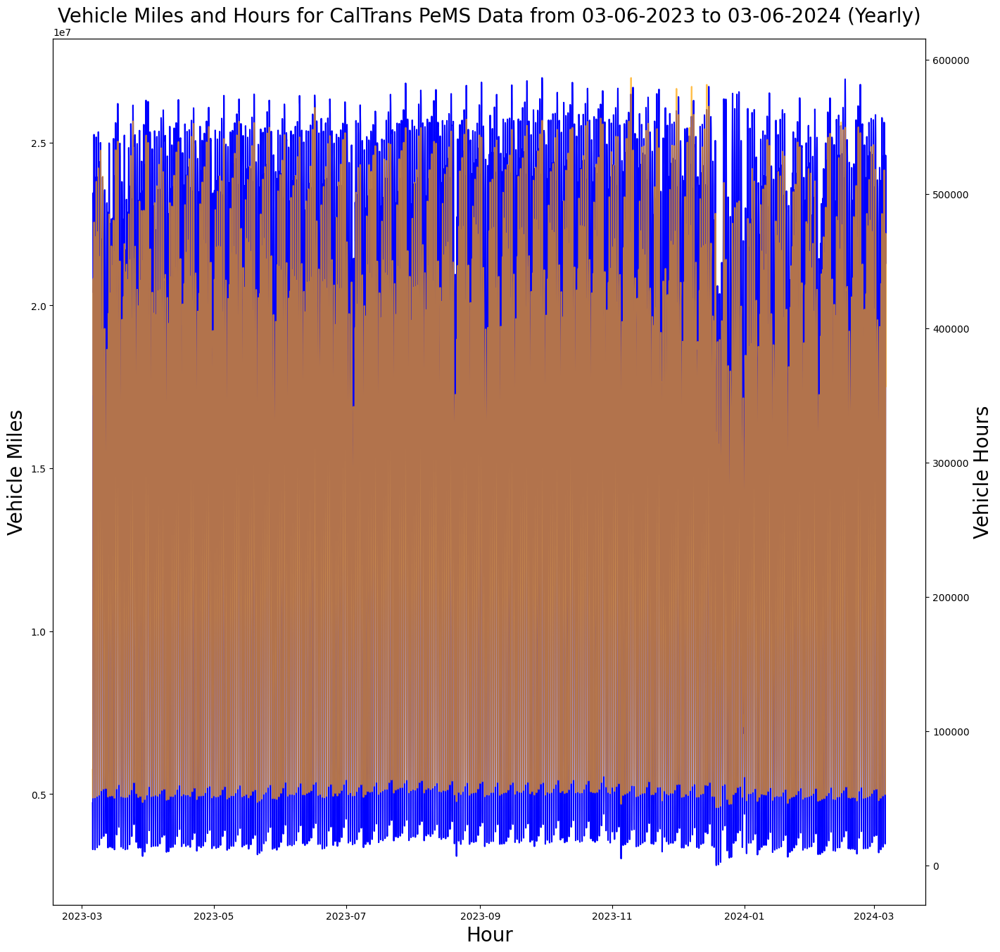

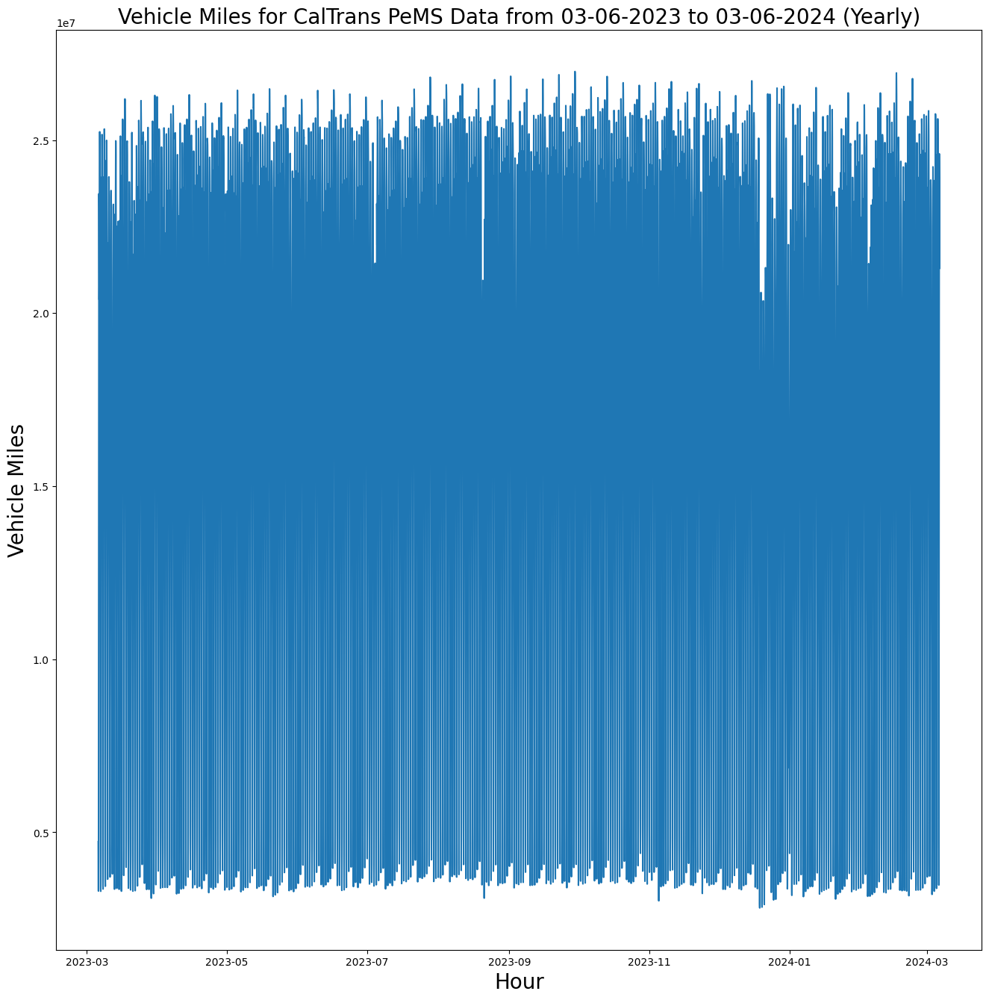

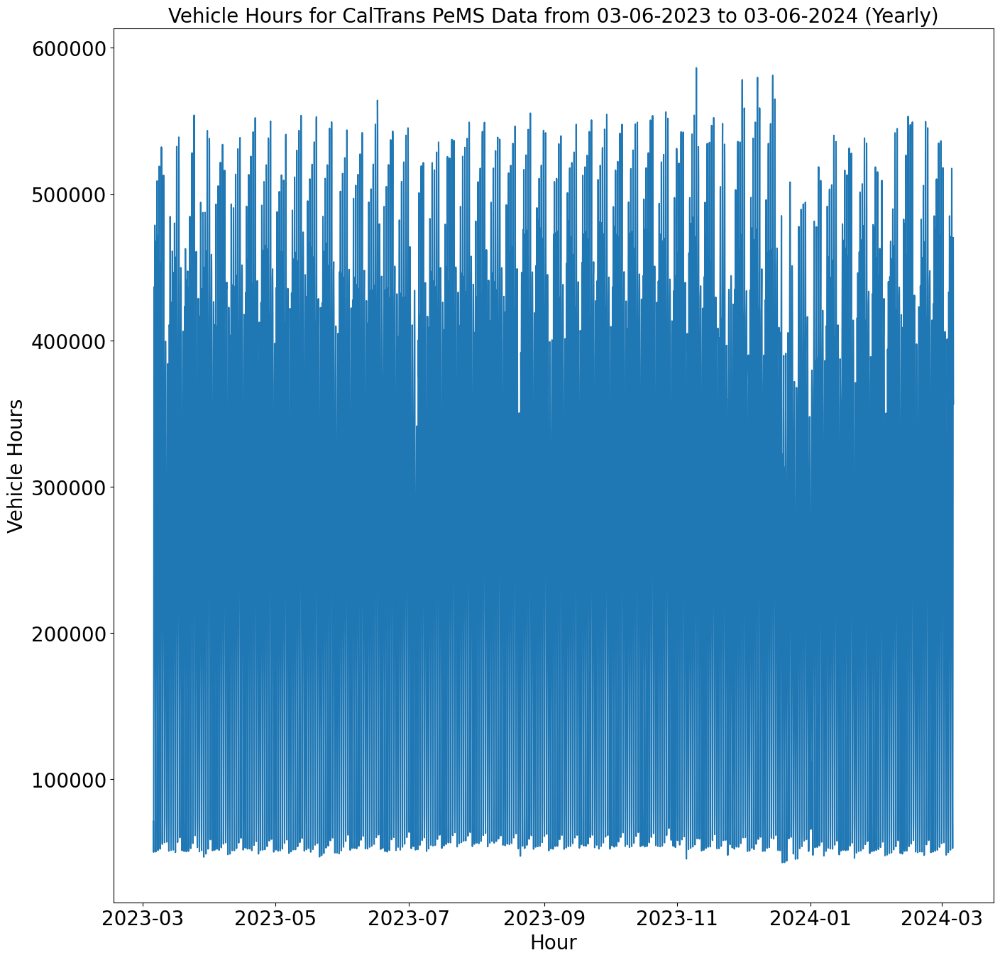

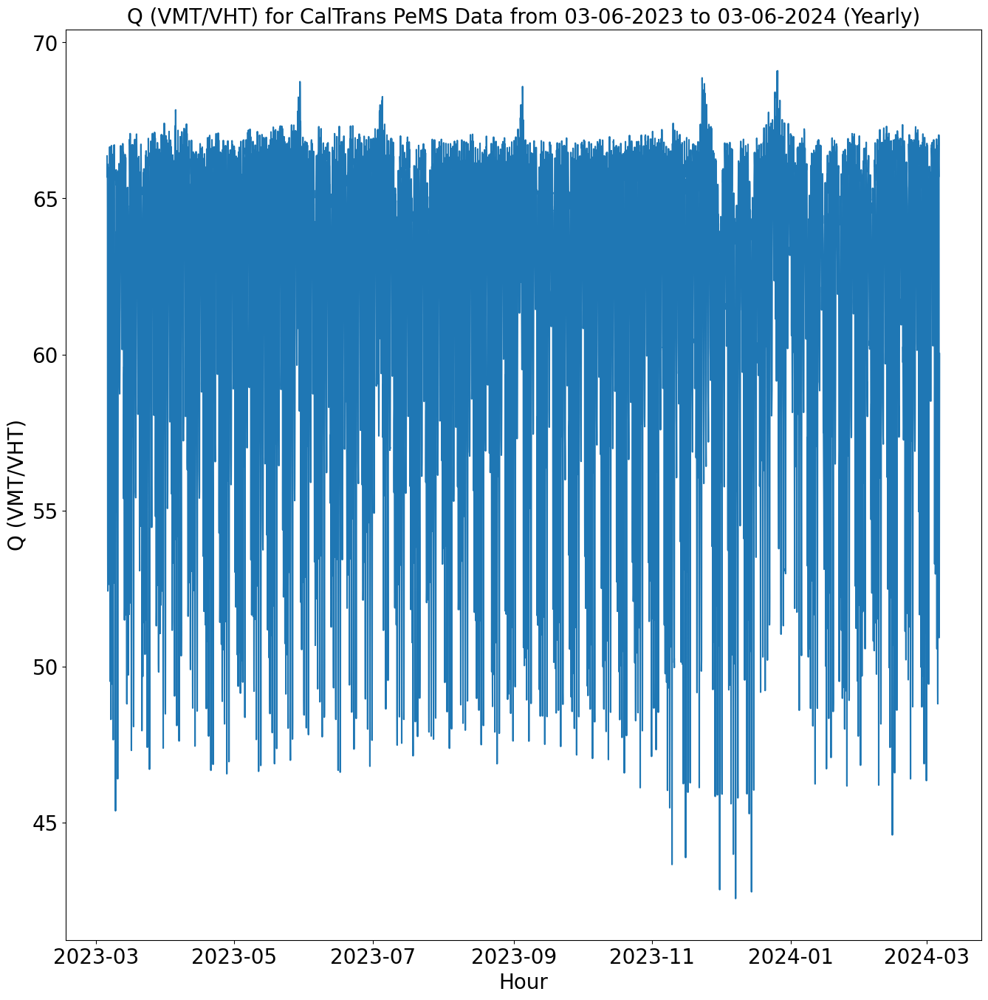

In [ ]:
plot_veh_mi_hrs(df, 0, df.shape[0], "Yearly", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, df.shape[0], "Yearly", title_name,
                  'Q (VMT/VHT)')

### Daily Plots (Seasonality)

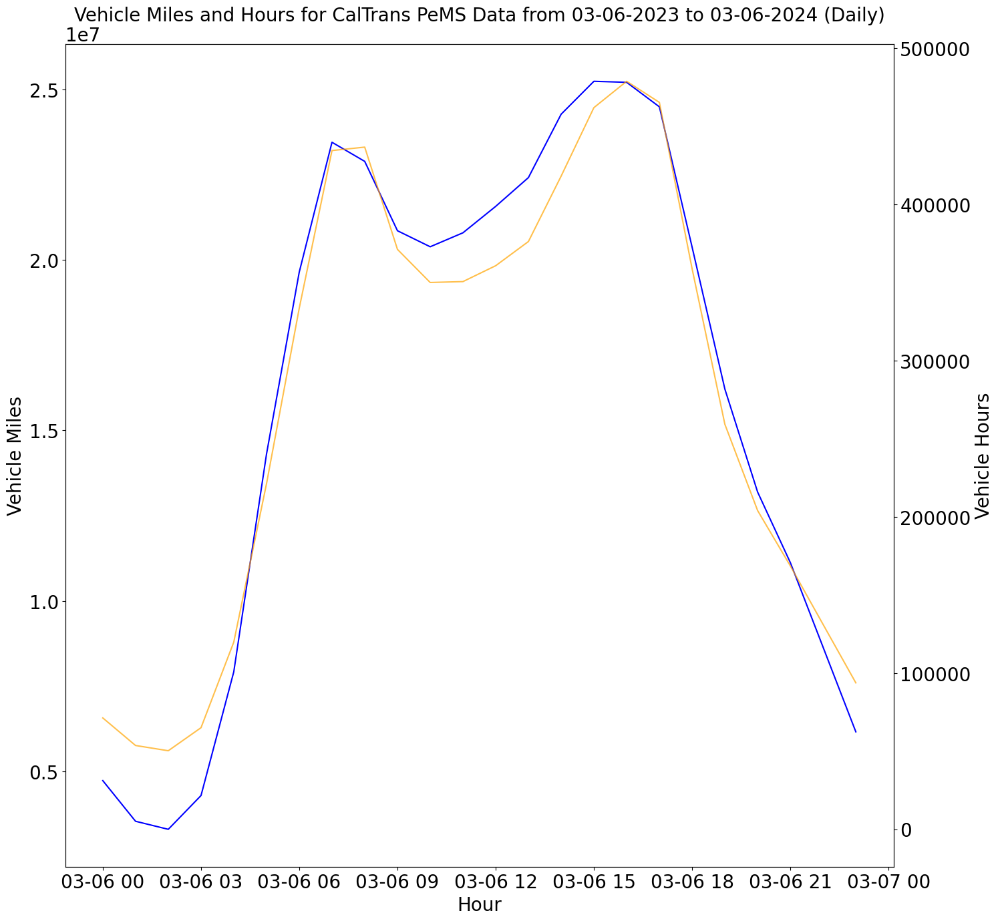

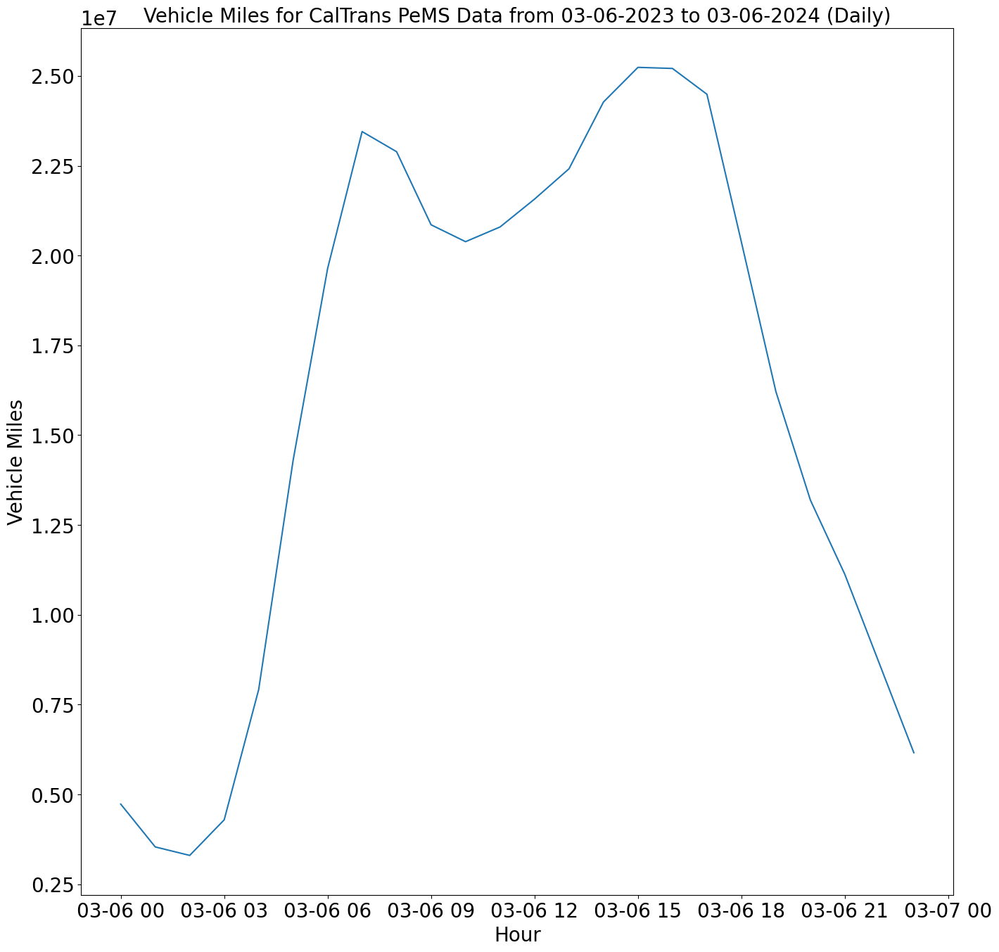

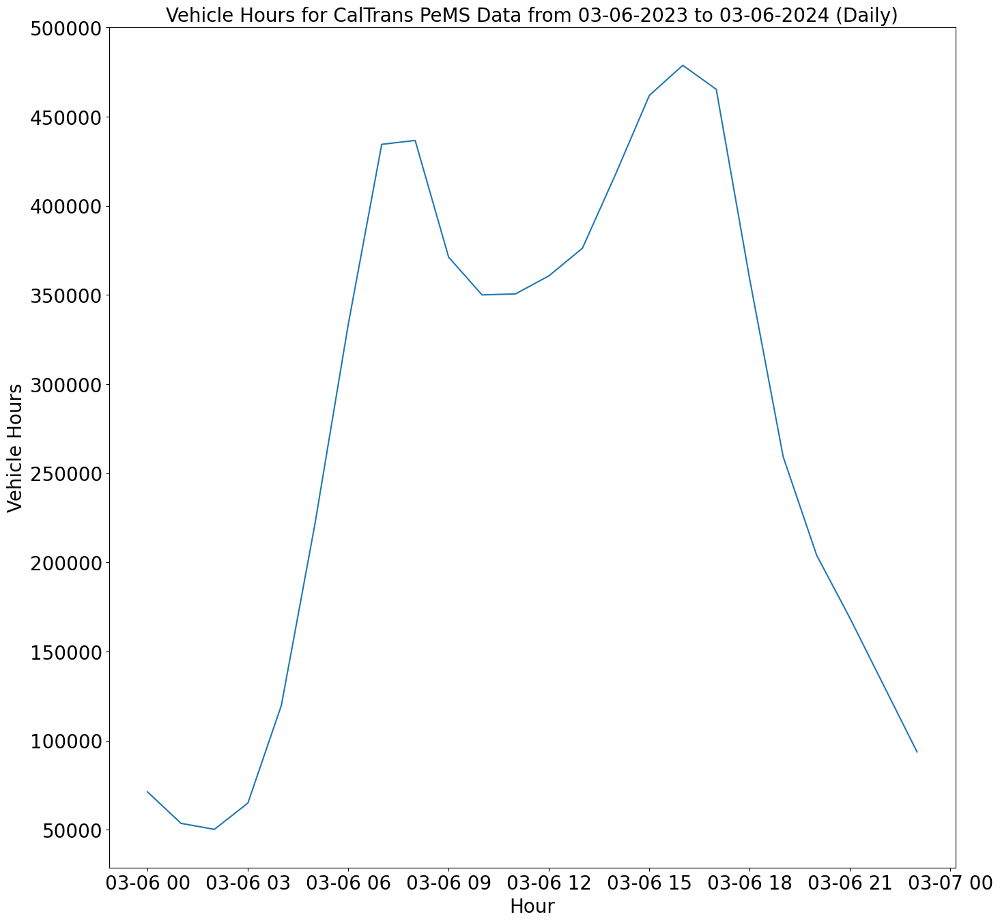

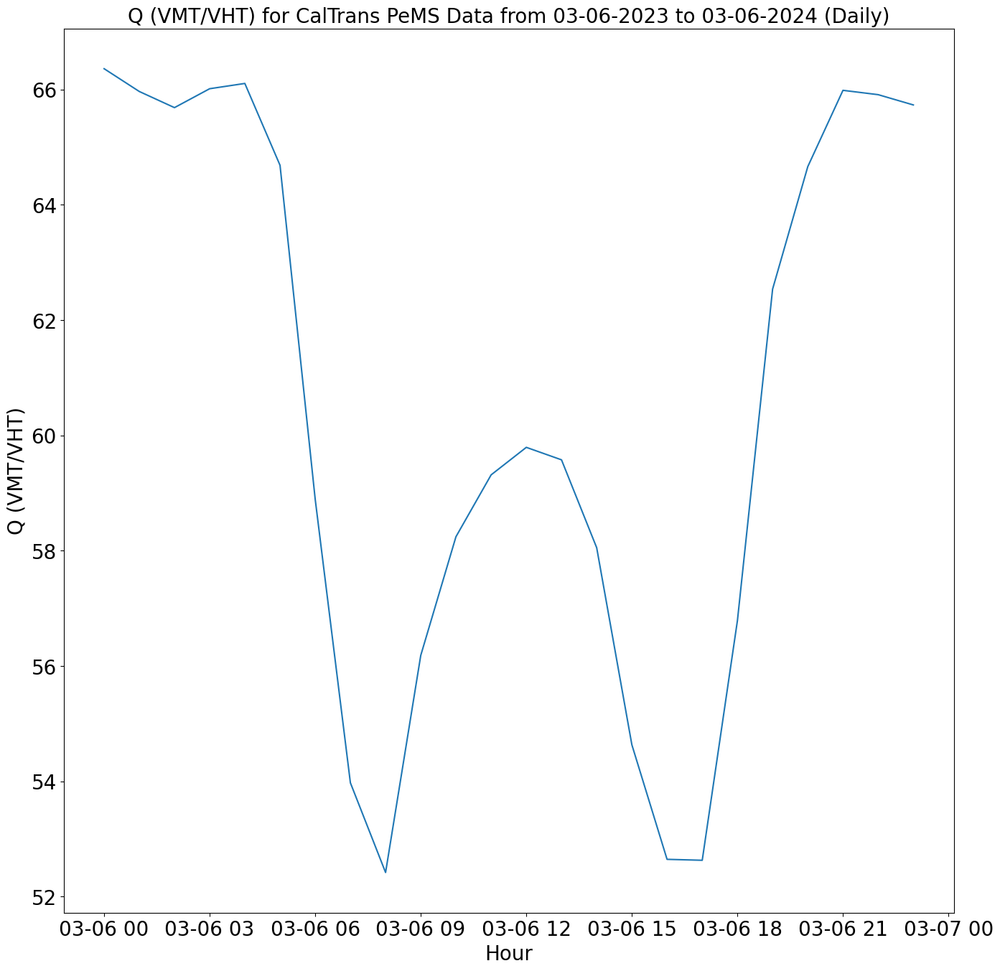

In [ ]:
plot_veh_mi_hrs(df, 0, 24, "Daily", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, 24, "Daily", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, 24, "Daily", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, 24, "Daily", title_name, 'Q (VMT/VHT)')

### Weekly Plots (Seasonality)

In [ ]:
weekly_df = df.query("Hour >= '2023-04-09' \
                       and Hour <= '2023-04-16'")
weekly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-04-09 00:00:00,7338493.3,109208.5,67.197089,431550,57.0
2023-04-09 01:00:00,5093904.2,76290.6,66.769749,431640,57.0
2023-04-09 02:00:00,4049969.8,60785.5,66.627235,431640,57.0
2023-04-09 03:00:00,3223051.7,48650.7,66.248825,431646,57.0
2023-04-09 04:00:00,3293754.2,49713.6,66.254590,431624,57.0
...,...,...,...,...,...
2023-04-15 20:00:00,17747047.8,276707.1,64.136583,431697,57.0
2023-04-15 21:00:00,16665800.0,250957.2,66.408933,431680,56.9
2023-04-15 22:00:00,14581376.4,218670.8,66.681863,431670,56.9


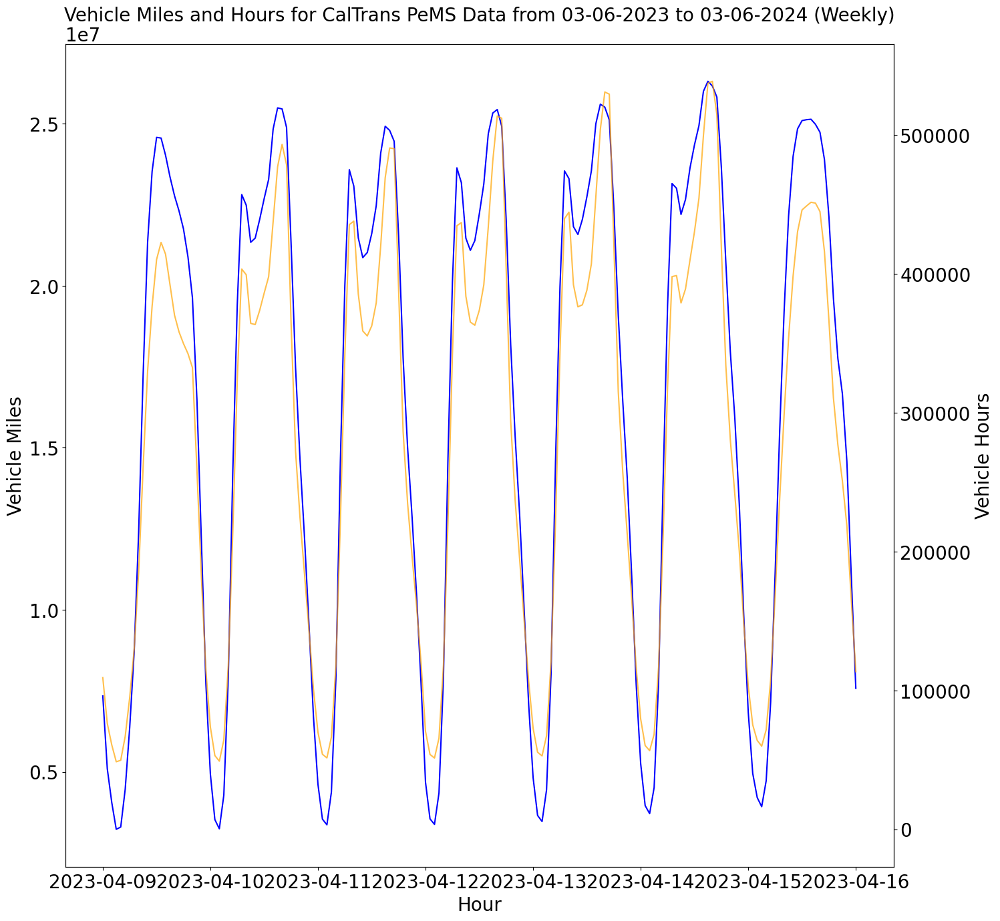

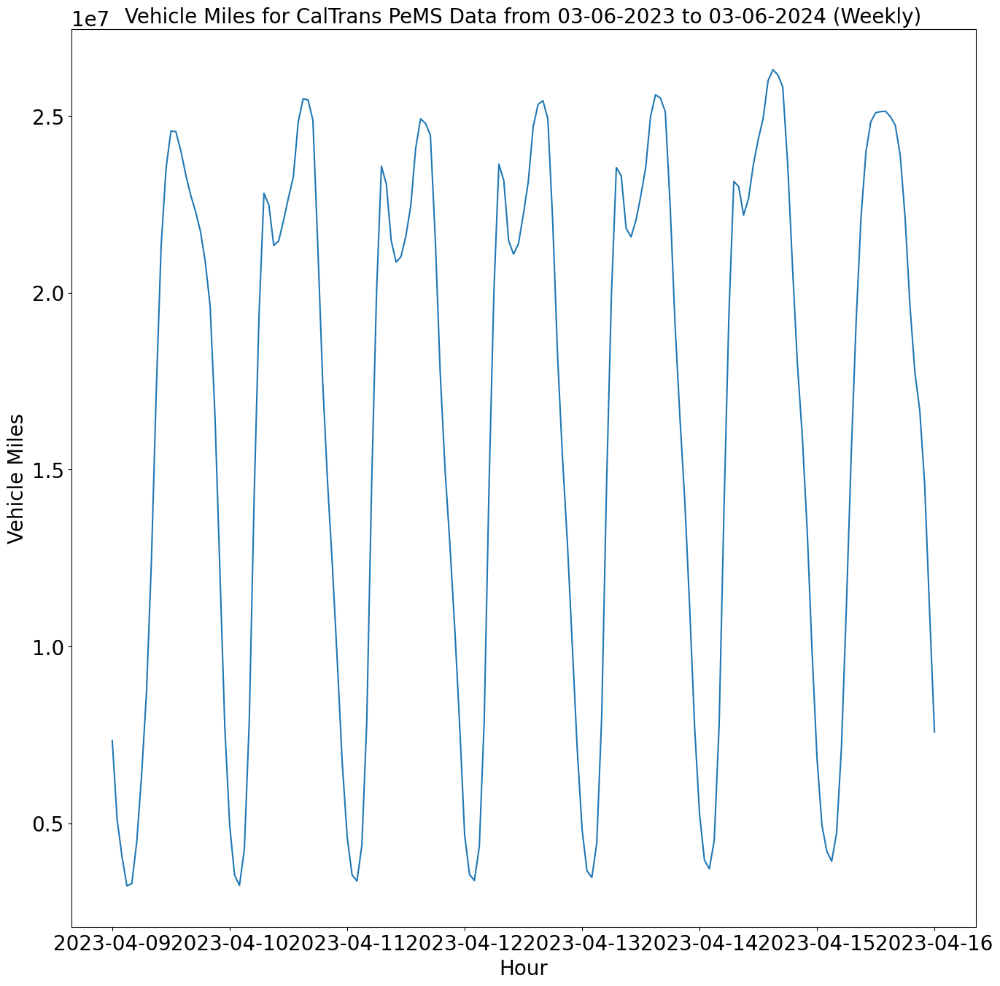

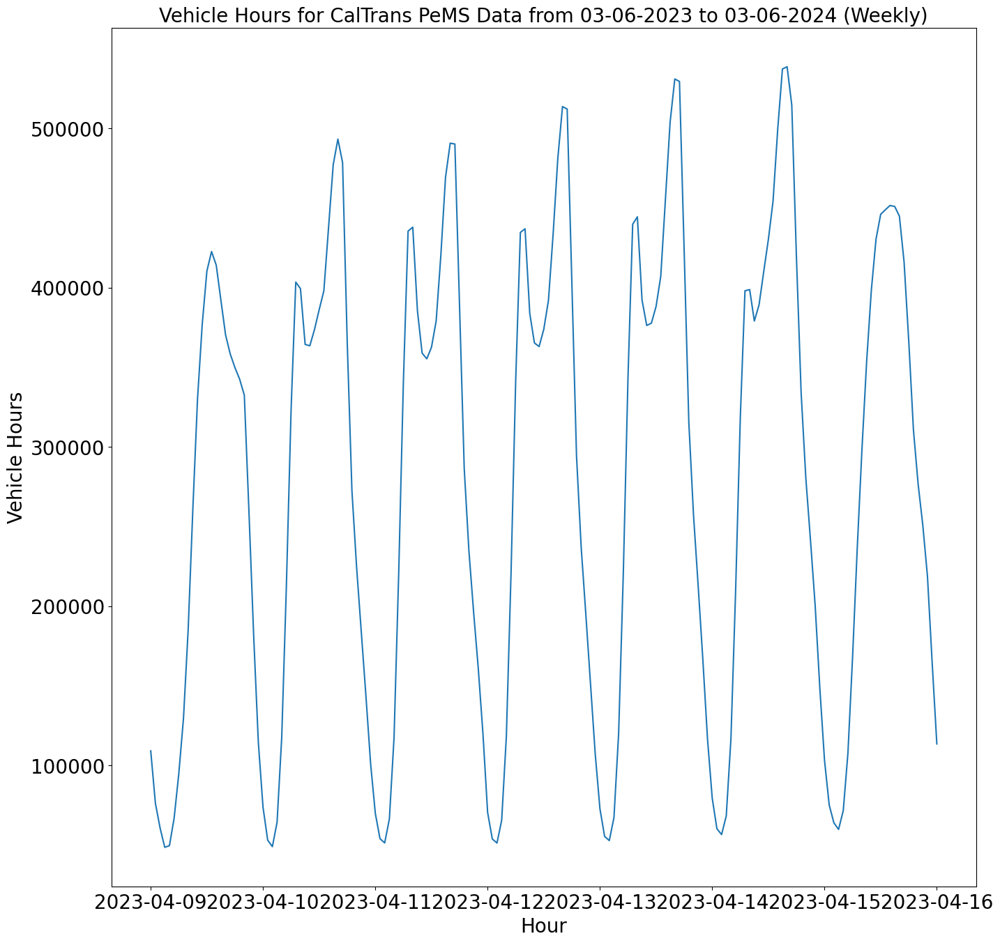

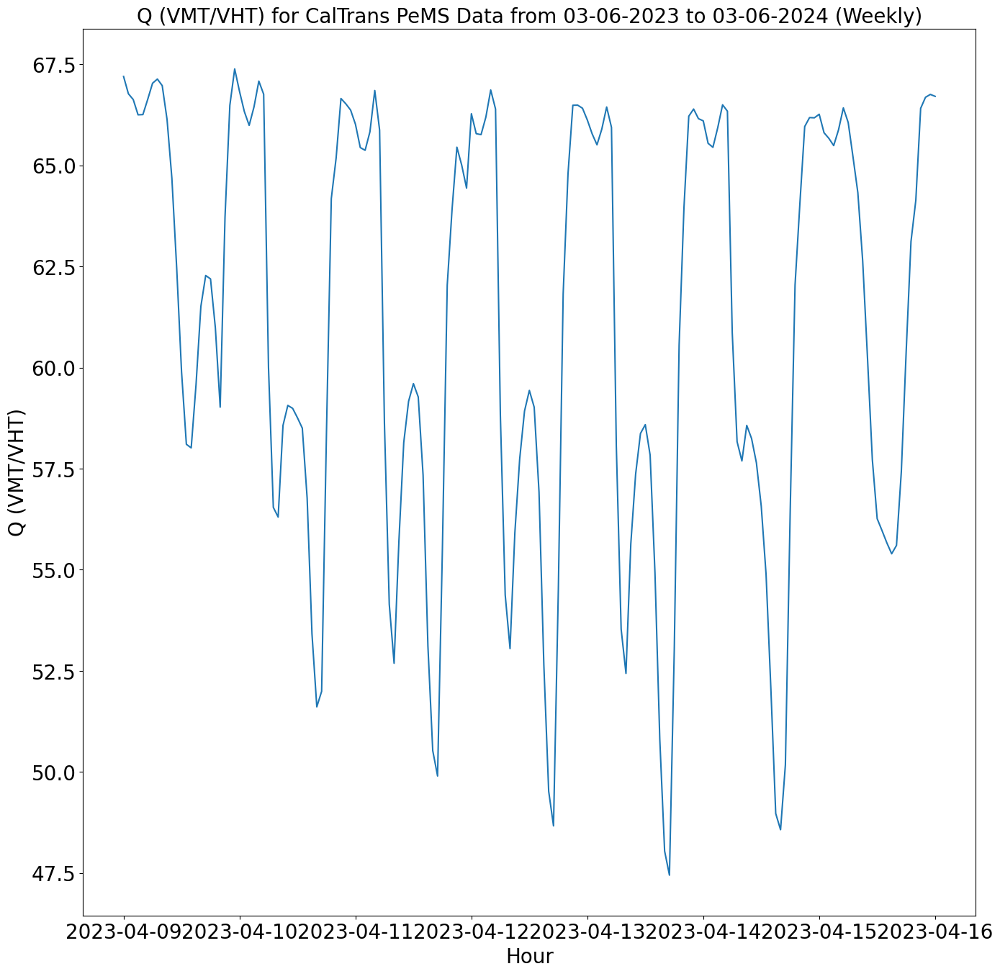

In [ ]:
plot_veh_mi_hrs(weekly_df, 0, weekly_df.shape[0], "Weekly", title_name)
plot_veh_mi_hrs_Q(weekly_df['VMT (Veh-Miles)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(weekly_df['VHT (Veh-Hours)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(weekly_df['Q (VMT/VHT)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Q (VMT/VHT)')

### Monthly Plots (Seasonality)

In [ ]:
monthly_df = df.query("Hour >= '2023-05-01' \
                       and Hour <= '2023-06-01'")

monthly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-05-01 00:00:00,5026912.3,75439.4,66.635104,431709,52.5
2023-05-01 01:00:00,3701062.9,55985.2,66.107880,431704,52.5
2023-05-01 02:00:00,3414046.6,51859.2,65.832998,431698,52.5
2023-05-01 03:00:00,4413611.8,66772.5,66.099244,431704,52.4
2023-05-01 04:00:00,8122783.4,122095.1,66.528332,431719,52.4
...,...,...,...,...,...
2023-05-31 20:00:00,15473197.3,238845.5,64.783290,431647,48.7
2023-05-31 21:00:00,13272015.7,199268.5,66.603681,431741,48.7
2023-05-31 22:00:00,10321713.0,154610.6,66.759414,431748,48.5


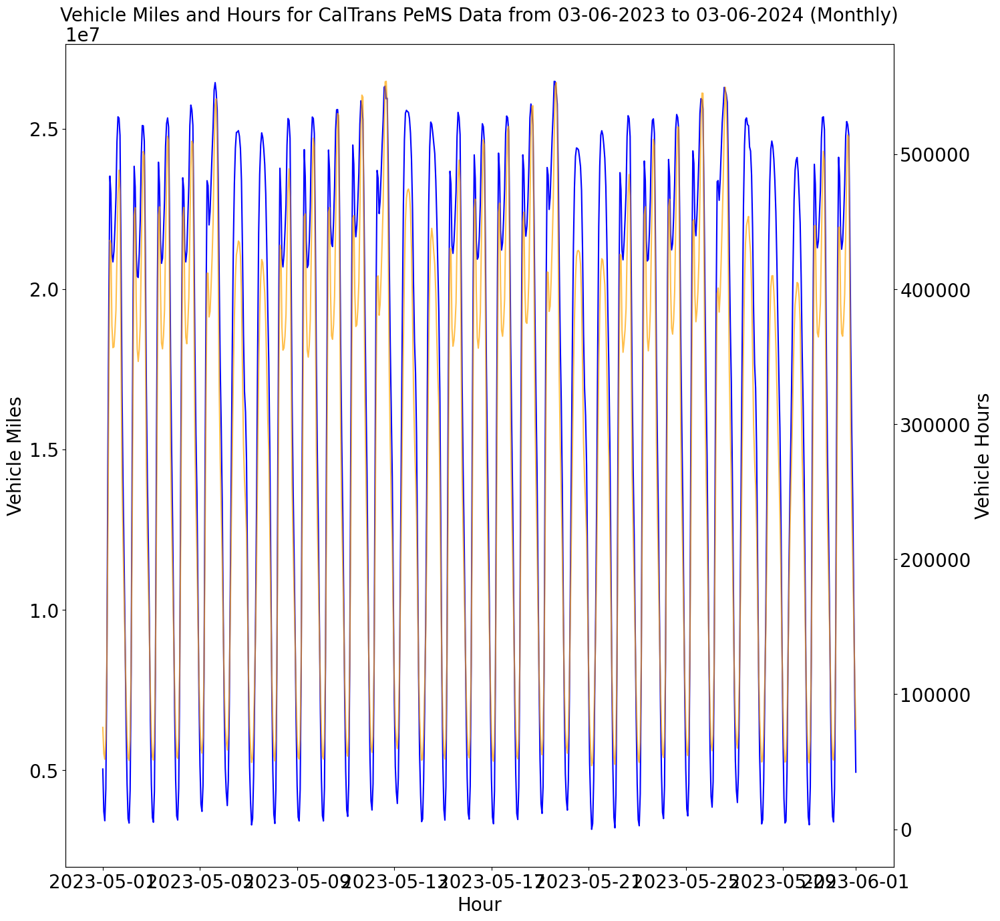

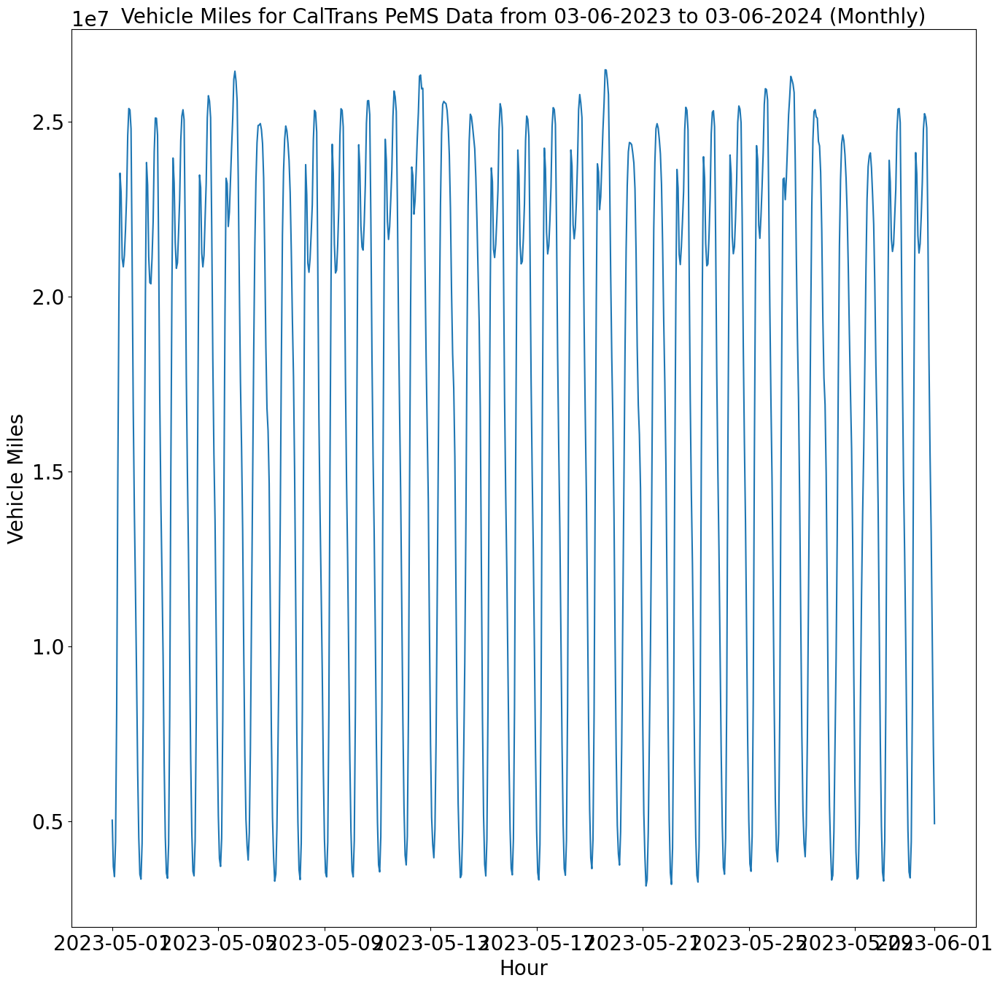

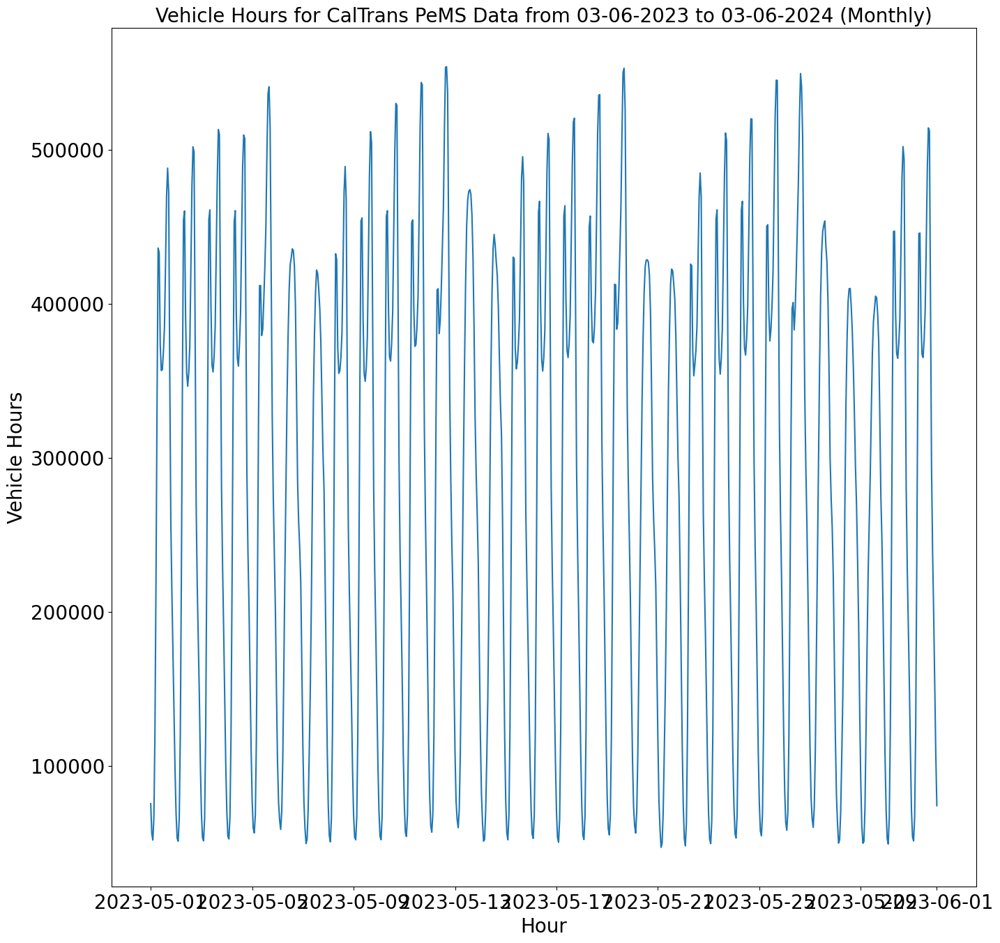

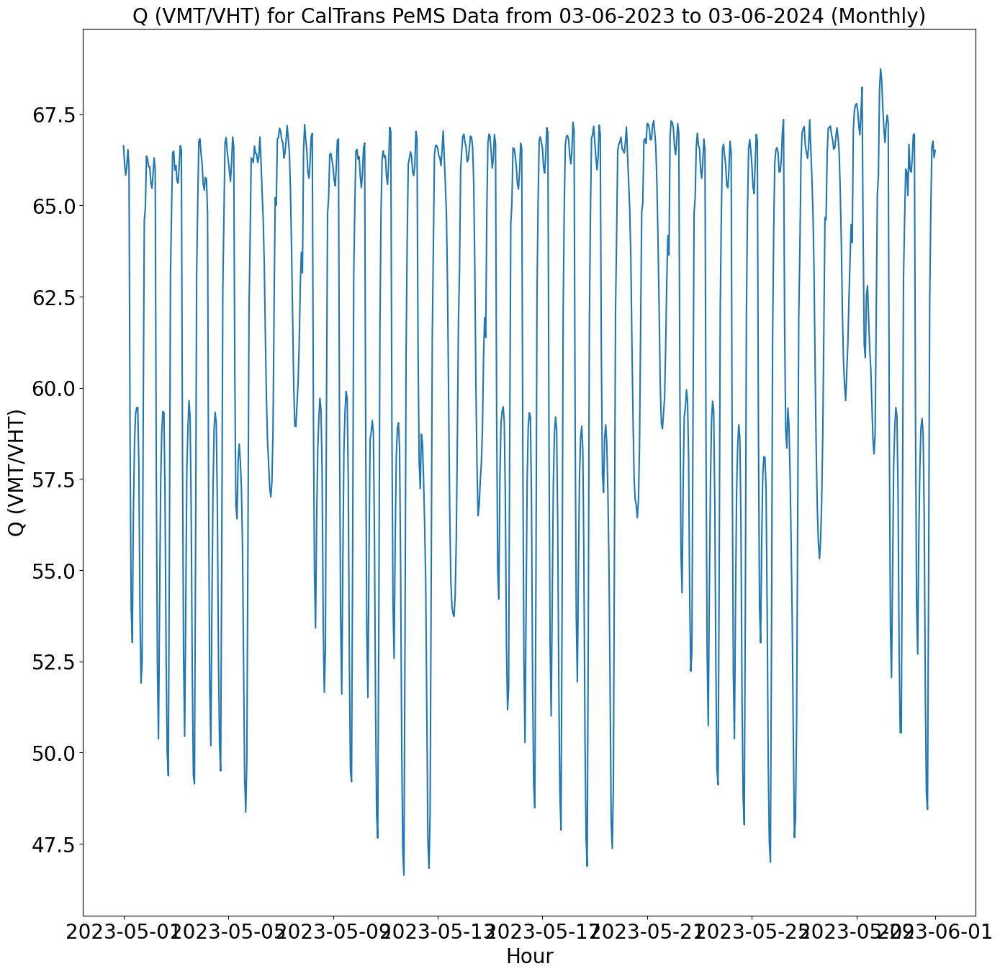

In [ ]:
plot_veh_mi_hrs(monthly_df, 0, monthly_df.shape[0], "Monthly", title_name)
plot_veh_mi_hrs_Q(monthly_df['VMT (Veh-Miles)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(monthly_df['VHT (Veh-Hours)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(monthly_df['Q (VMT/VHT)'], 0, monthly_df.shape[0], "Monthly",
                  title_name, 'Q (VMT/VHT)')

# Normalization Process

In [ ]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_vmt = scaler.fit_transform(df['VMT (Veh-Miles)'].
                                               values.reshape(-1,1))
    df['vmt_norm'] = normalized_data_vmt
    normalized_data_vht = scaler.fit_transform(df['VHT (Veh-Hours)'].
                                               values.reshape(-1,1))
    df['vht_norm'] = normalized_data_vht
    normalized_data_Q = scaler.fit_transform(df['Q (VMT/VHT)'].
                                               values.reshape(-1,1))
    df['Q_norm'] = normalized_data_Q
    return df, scaler

df_norm, scaler = normalize_data(df)
df_norm_mon, scaler = normalize_data(monthly_df)
df_norm_wk, scaler = normalize_data(weekly_df)
df_norm_day, scaler = normalize_data(monthly_df)


In [ ]:
df_norm

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0.

### Yearly Plots (Trend)

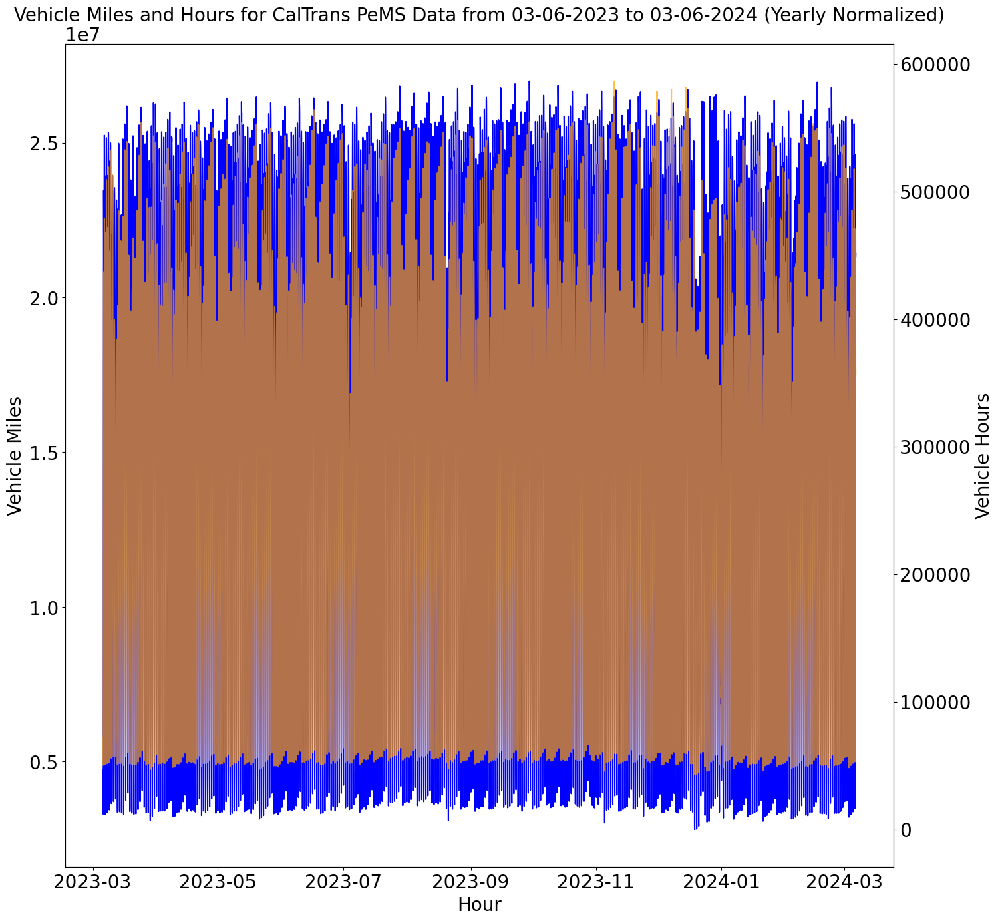

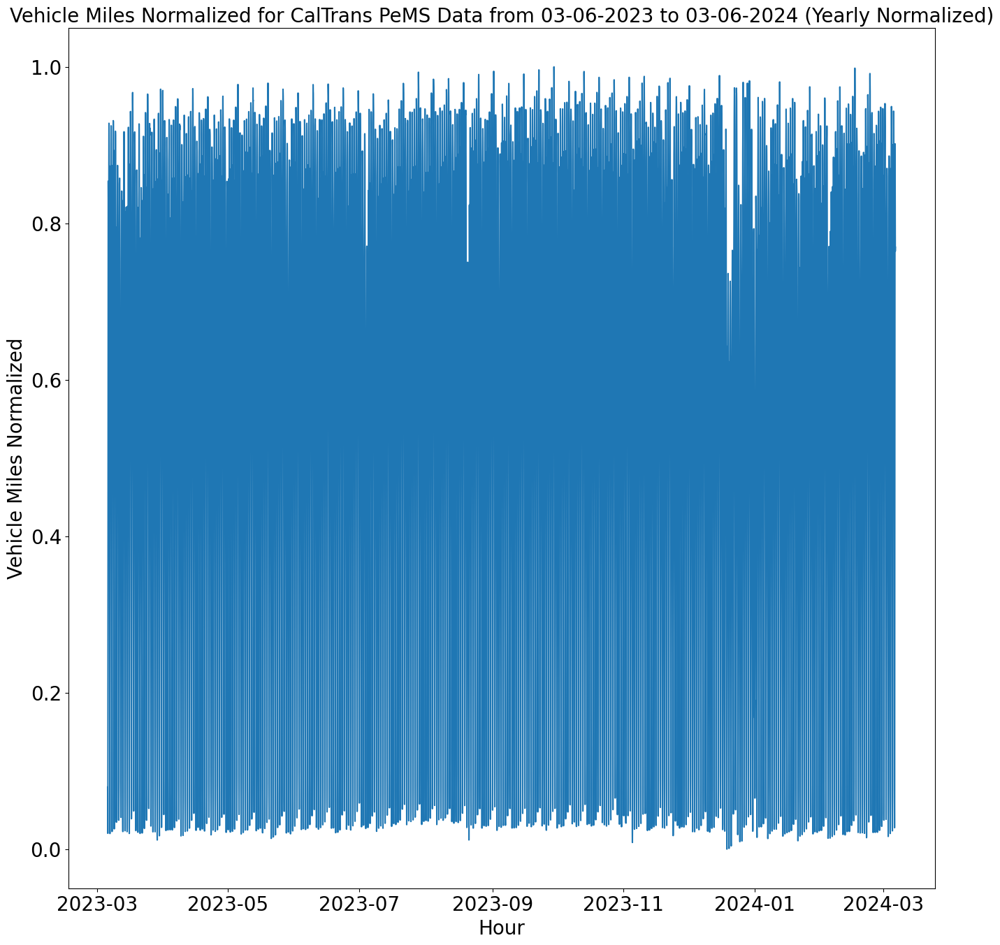

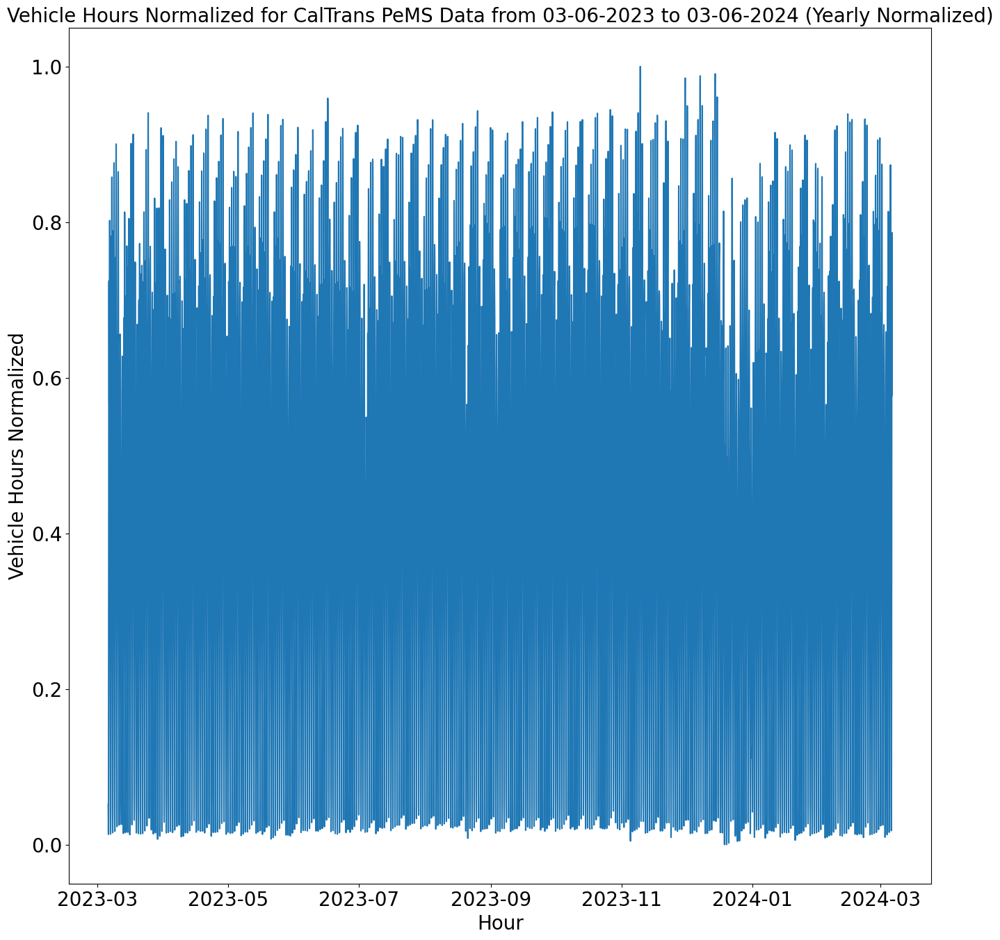

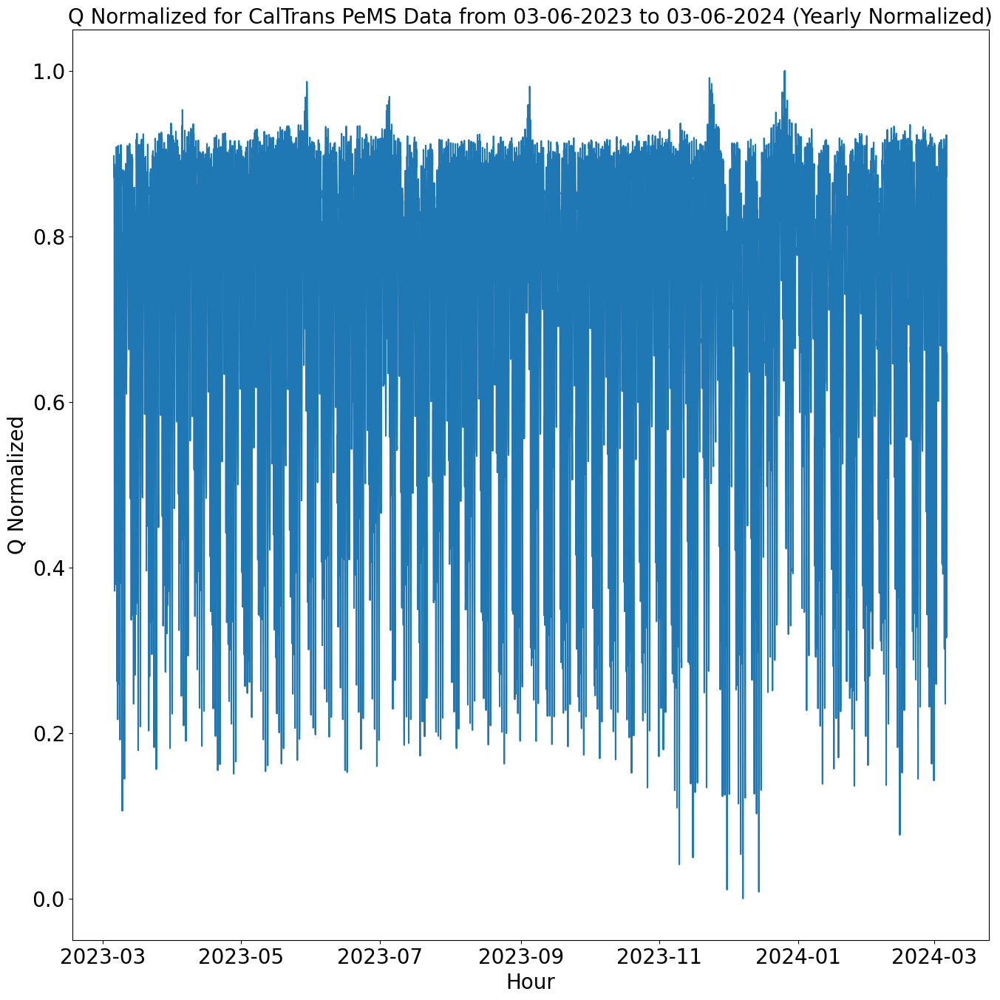

In [ ]:
plot_veh_mi_hrs(df_norm, 0, df_norm.shape[0], 'Yearly Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Q Normalized')

### Daily Plots (Seasonality)

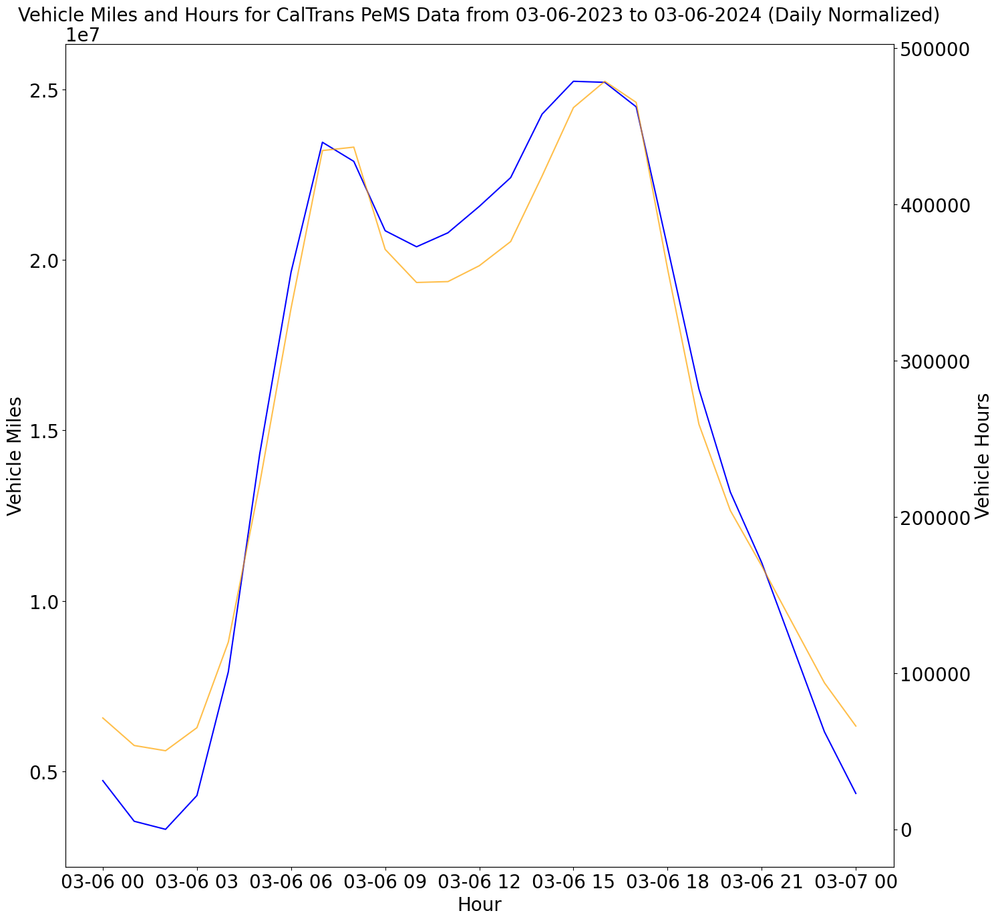

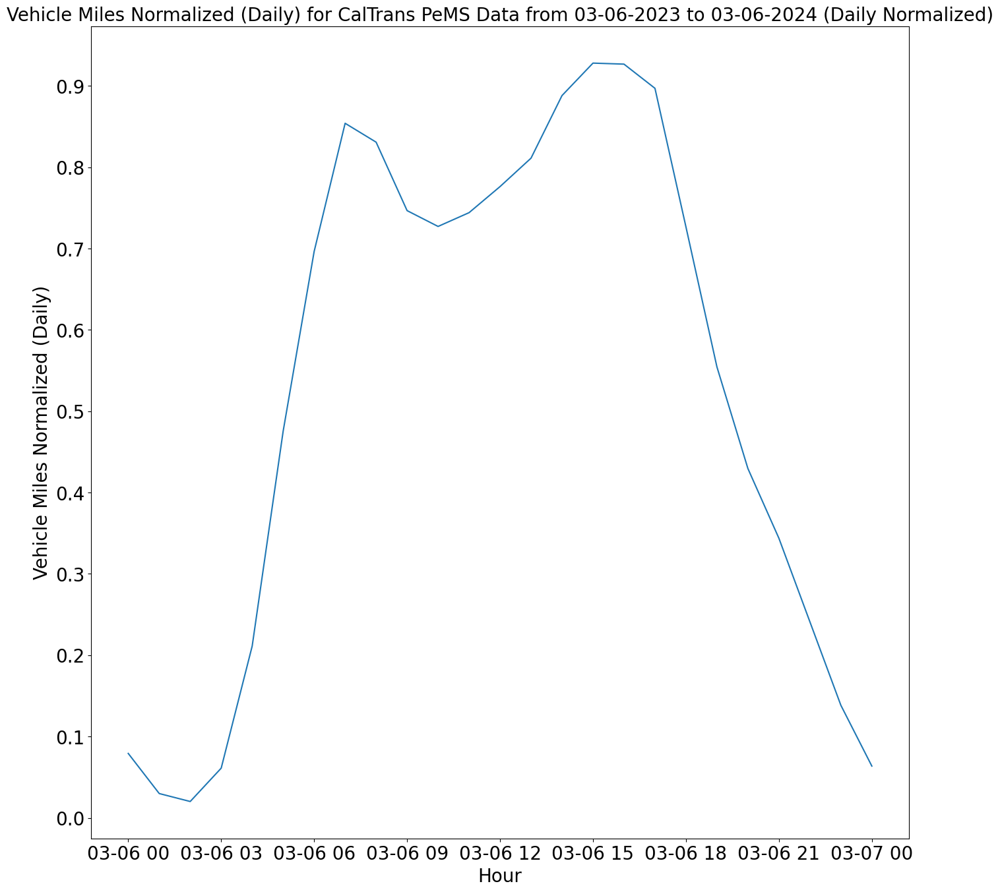

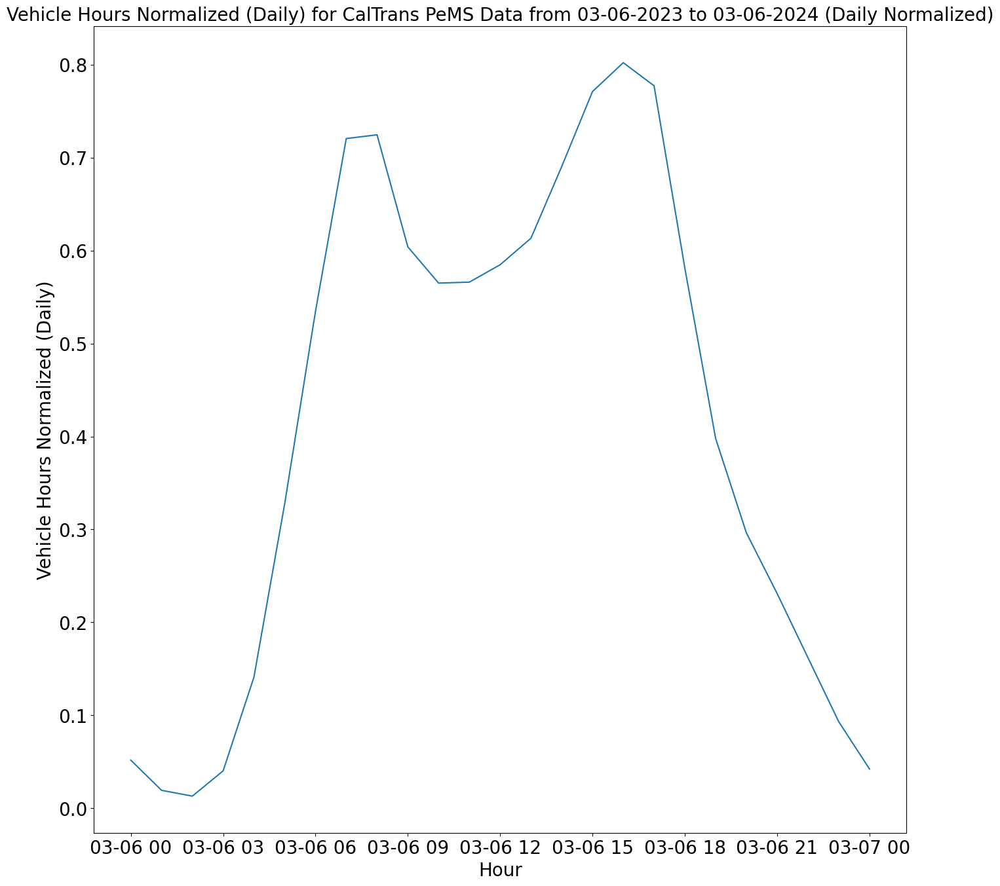

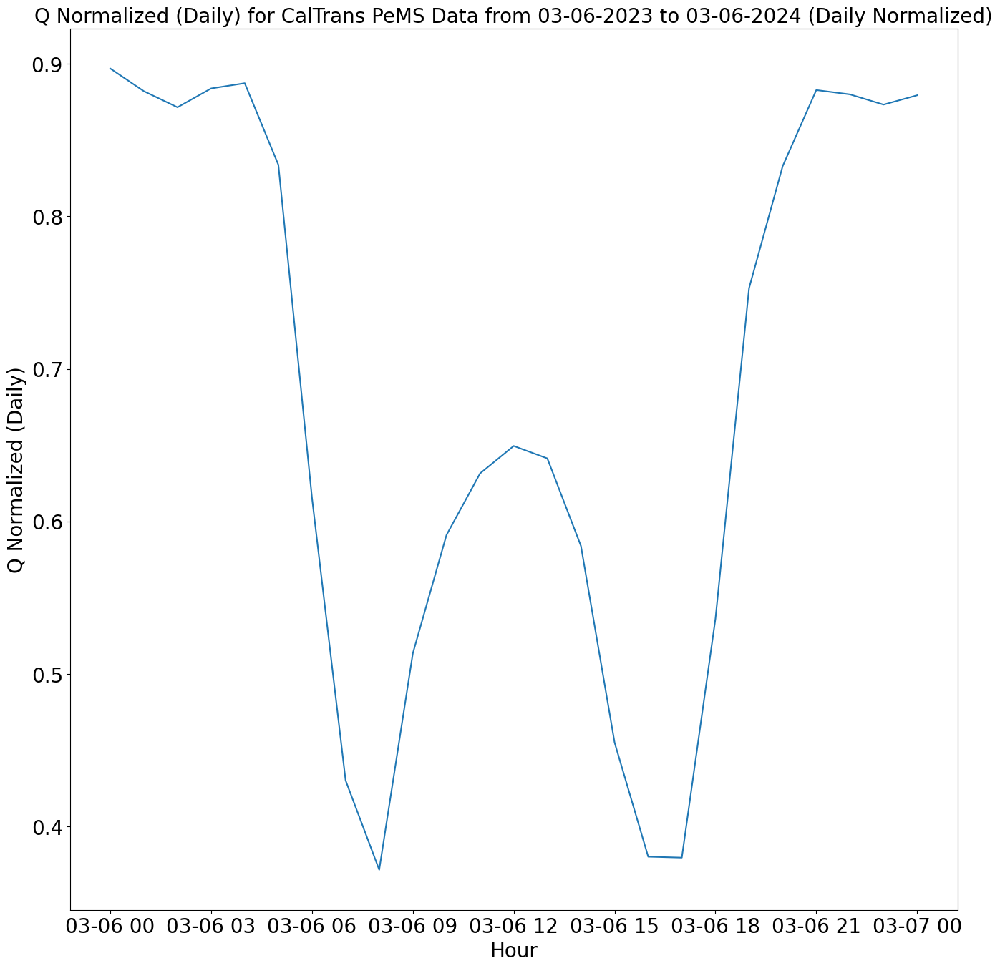

In [ ]:
plot_veh_mi_hrs(df_norm, 0, 25, 'Daily Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Miles Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Hours Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Q Normalized (Daily)')

### Weekly Plots (Seasonality)

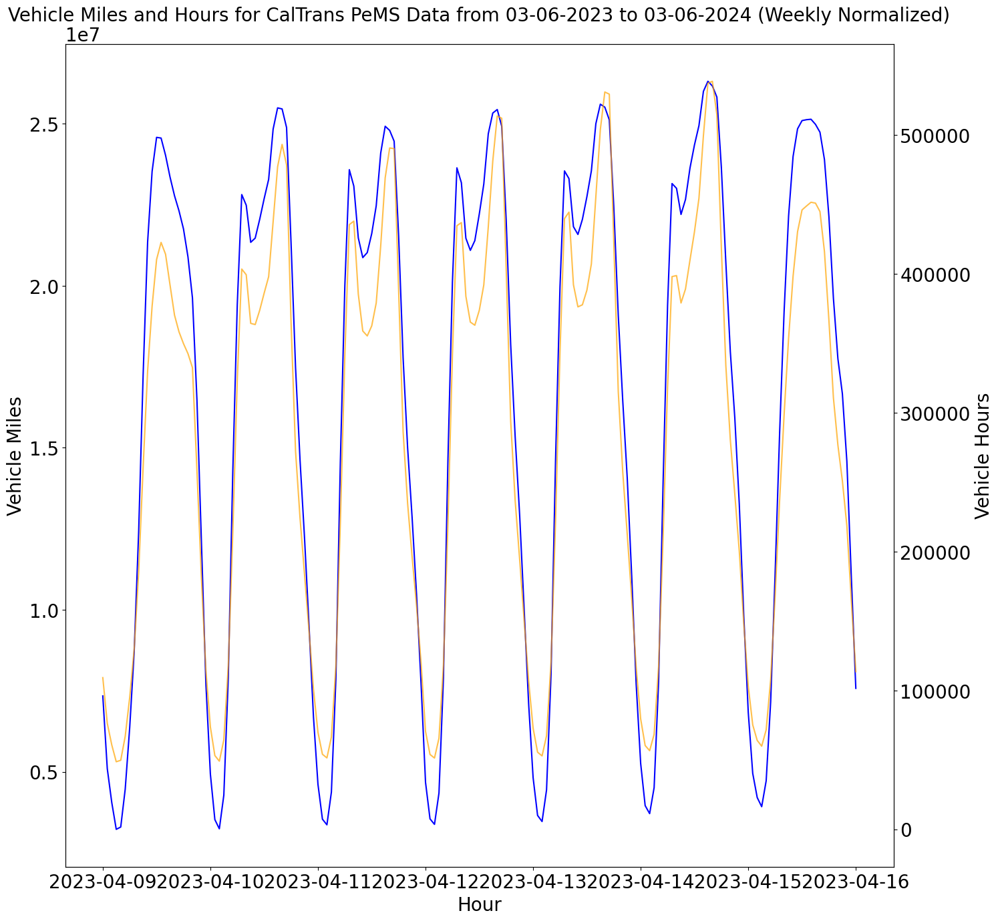

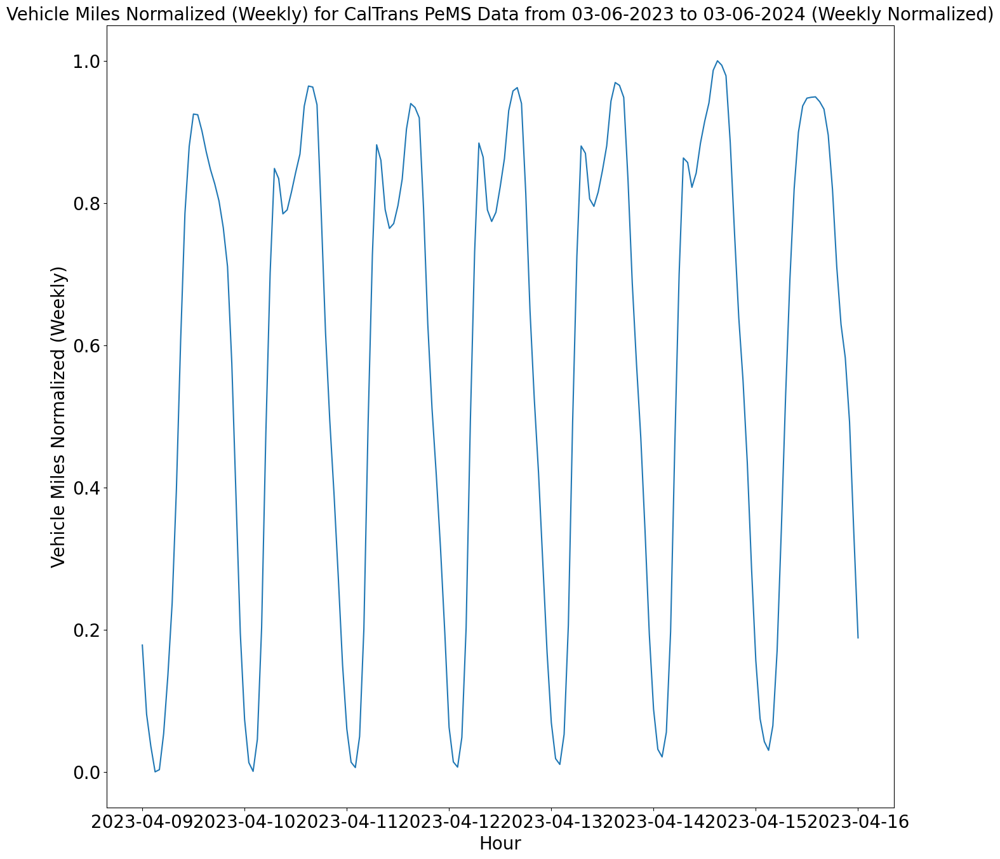

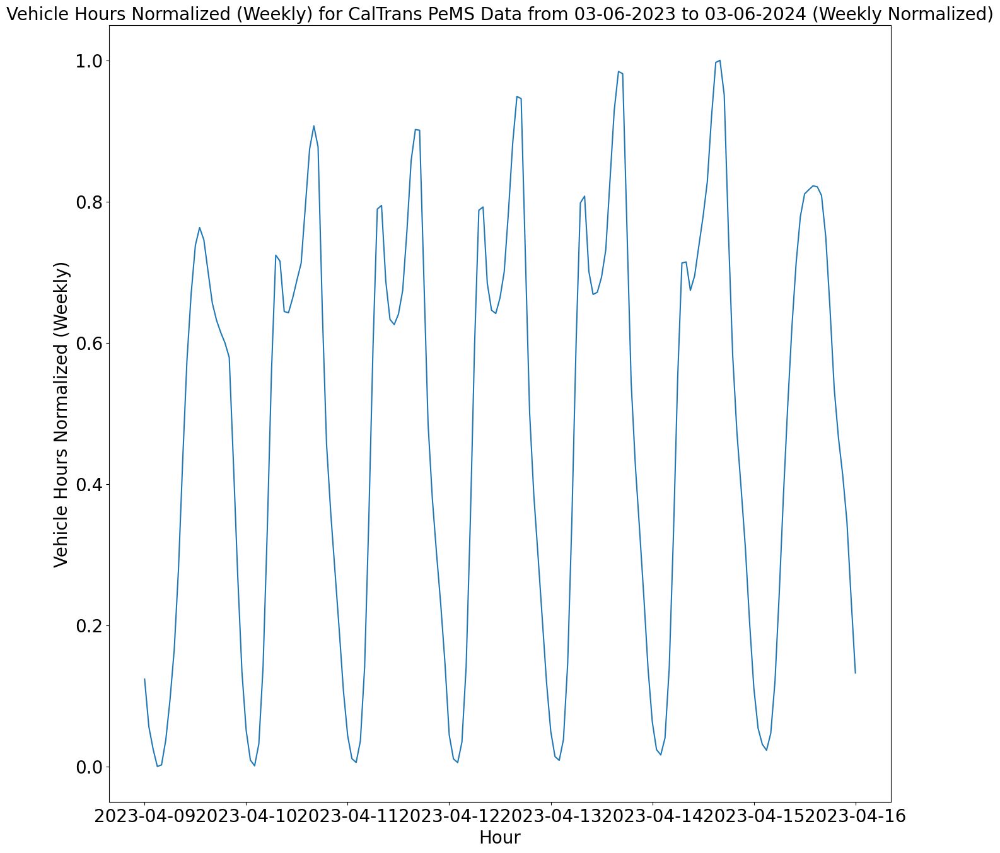

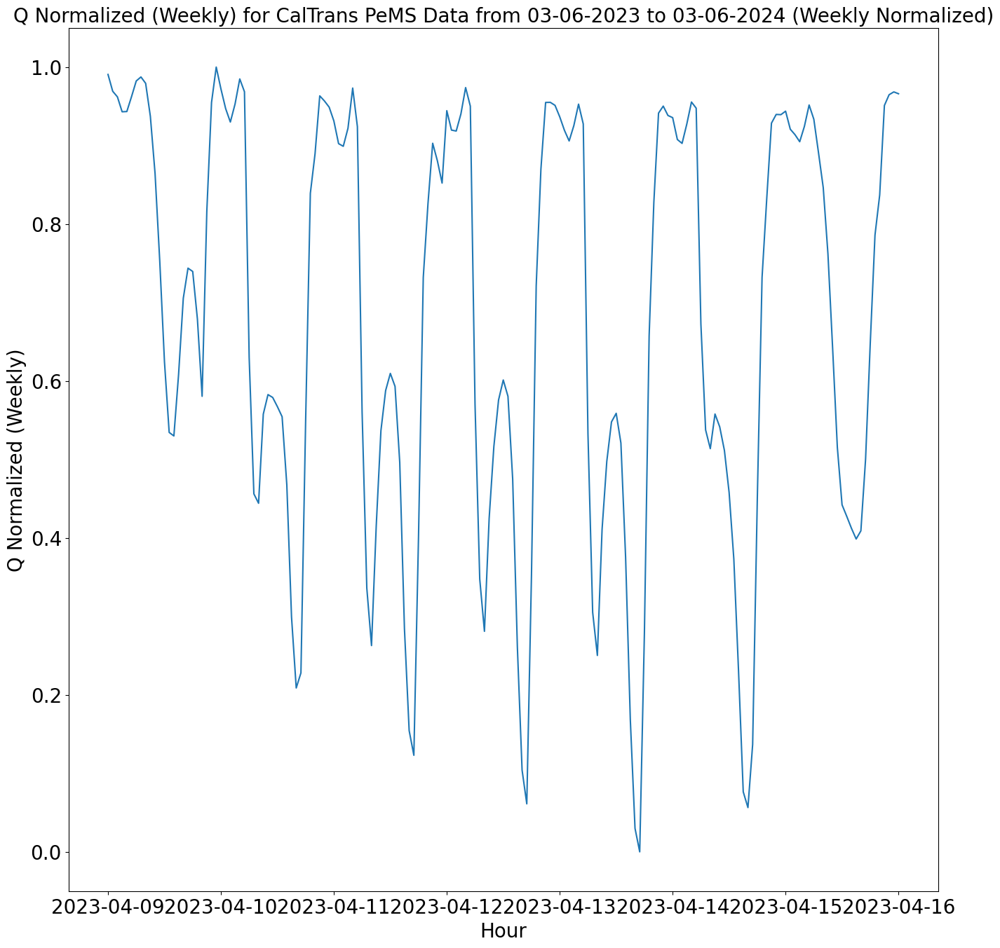

In [ ]:
plot_veh_mi_hrs(df_norm_wk, 0, df_norm_wk.shape[0], 'Weekly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_wk['vmt_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Miles Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['vht_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Hours Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['Q_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name, 'Q Normalized (Weekly)')

### Monthly Plots (Seasonality)

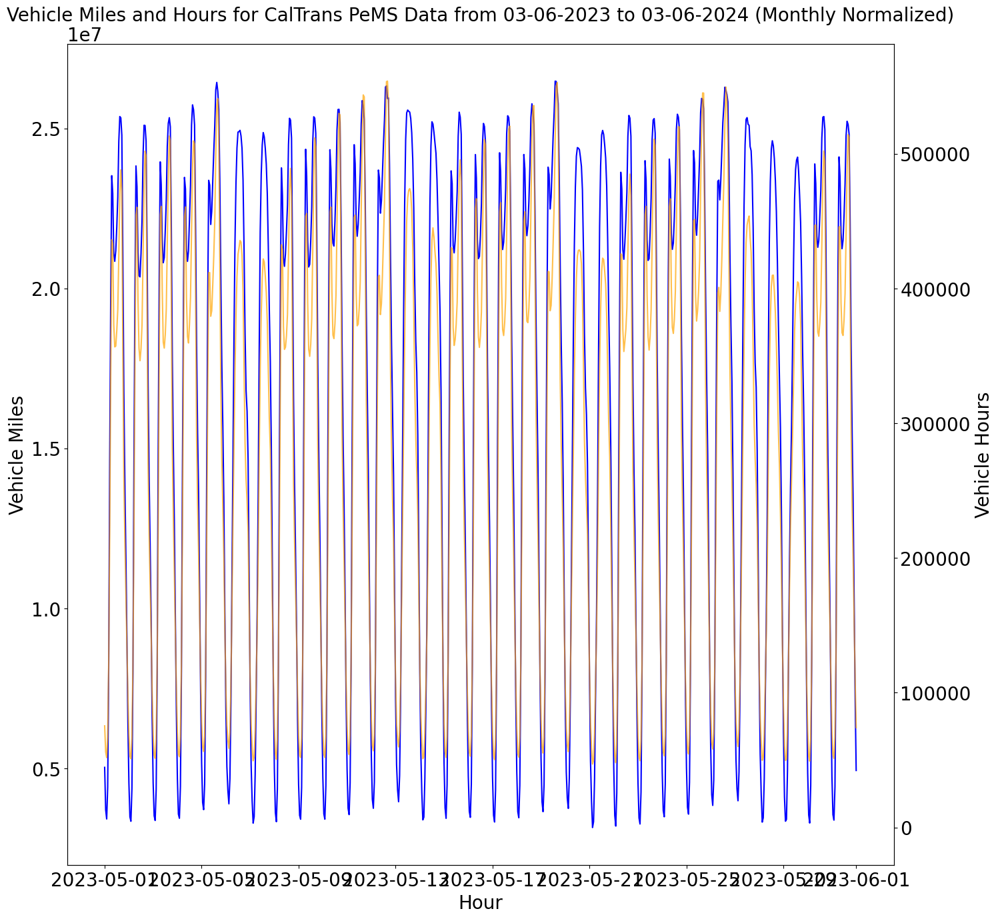

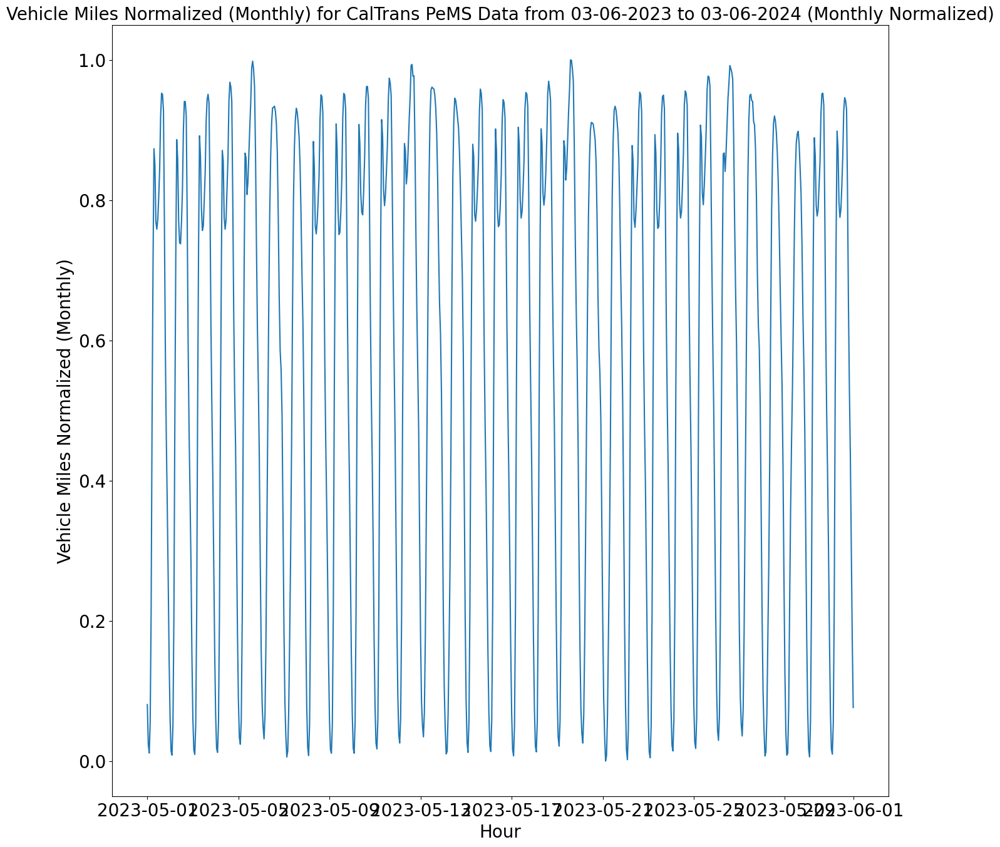

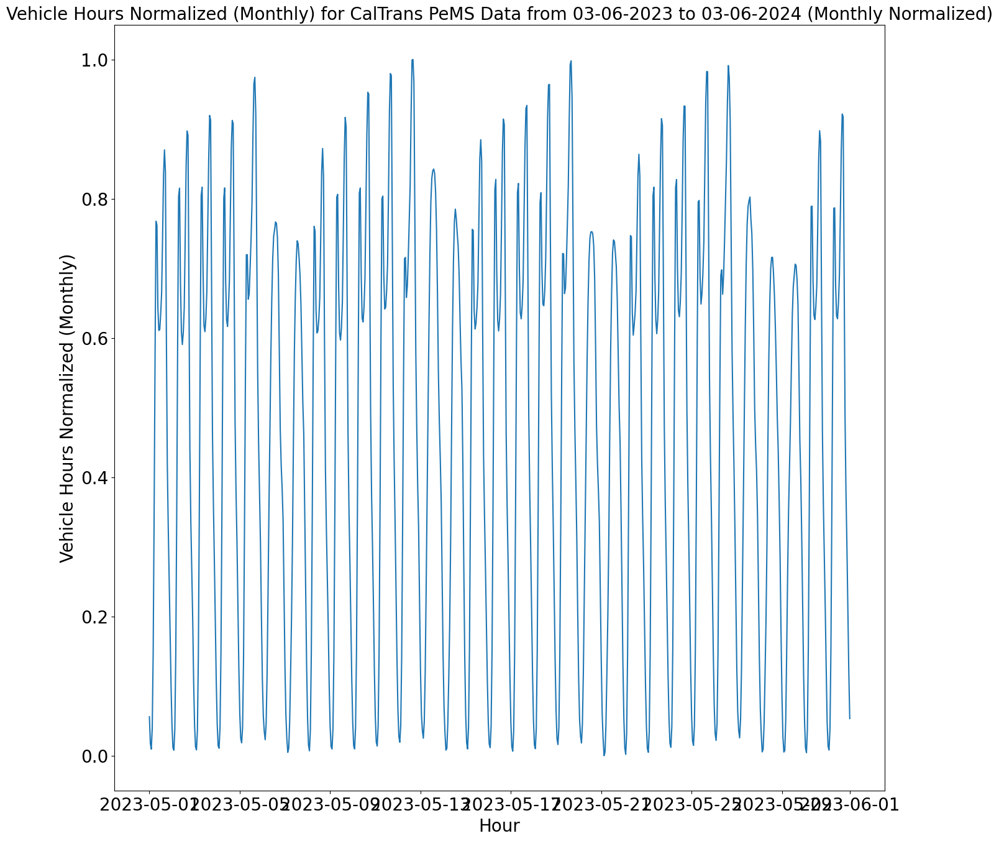

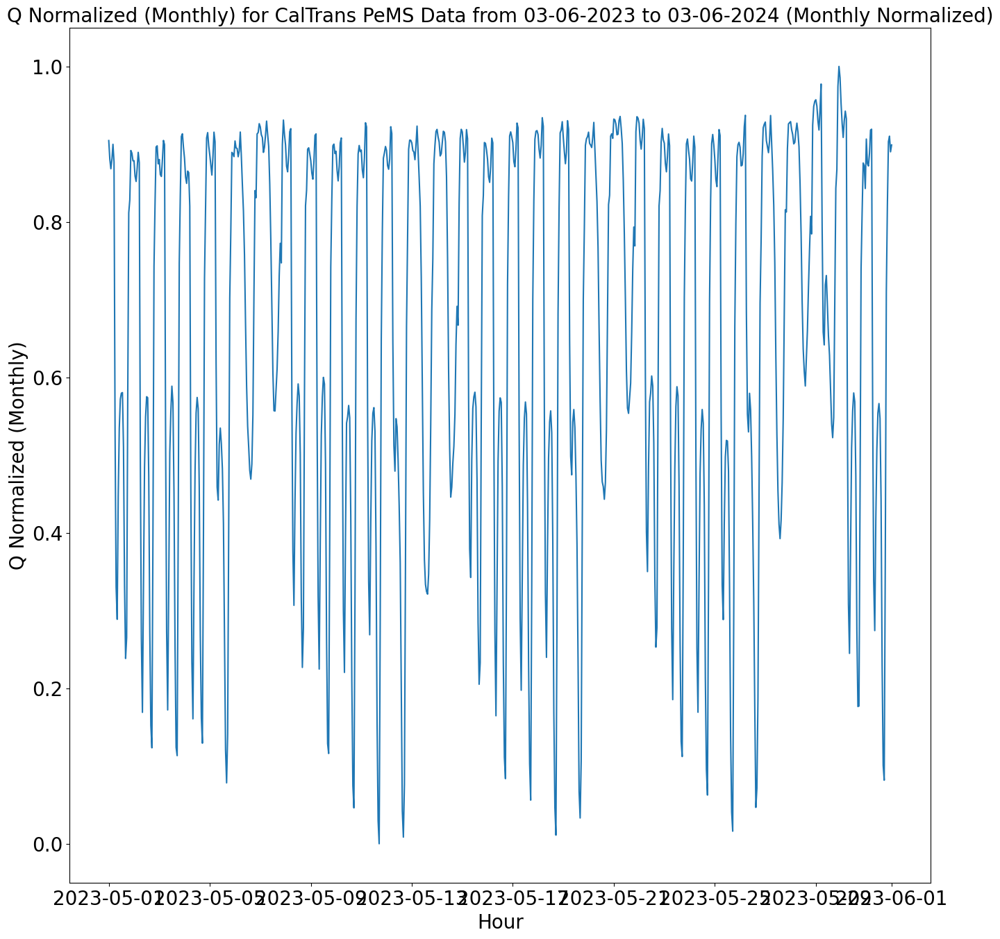

In [ ]:
plot_veh_mi_hrs(df_norm_mon, 0, df_norm_mon.shape[0], 'Monthly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_mon['vmt_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Miles Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['vht_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Hours Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['Q_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Q Normalized (Monthly)')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [ ]:
test_size = 0.2 # Set Split rate to 3:1 (80 % Training 20 % Test).
split_pos = int(df.shape[0]*(1 - test_size))
df = df.reset_index()
df

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
0,2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
1,2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2,2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
3,2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
4,2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...,...
8790,2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
8791,2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
8792,2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477
8793,2024-03-06 10:00:00,21287942.9,362457.5,58.732246,443929,49.3,0.764437,0.587870,0.609496


In [ ]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df.Hour[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df.loc[df_norm.index > split_date].copy()
split_date

'2023-12-24 05:00:00'

## Plot Train/Test Split Graphs.

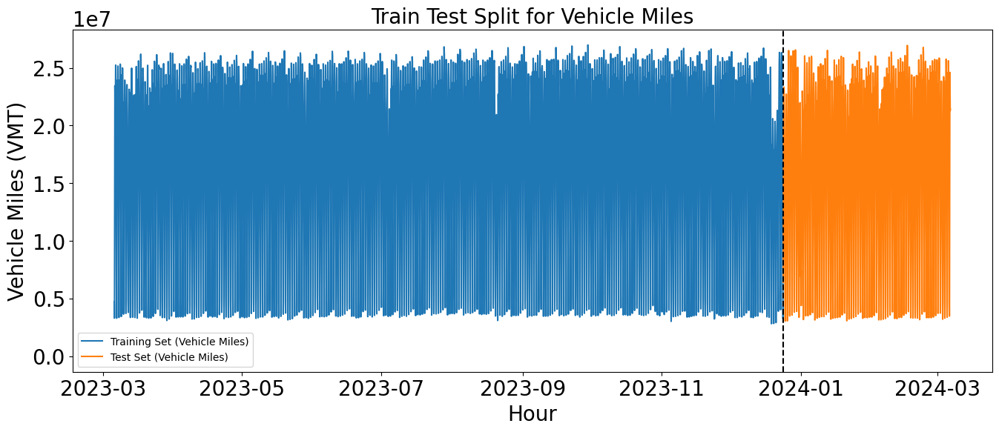

In [ ]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VMT (Veh-Miles)'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Hour'], DOM_test['VMT (Veh-Miles)'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Miles)', 'Test Set (Vehicle Miles)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Vehicle Miles (VMT)", fontsize = 20)
plt.title("Train Test Split for Vehicle Miles", fontsize = 20)
plt.show()

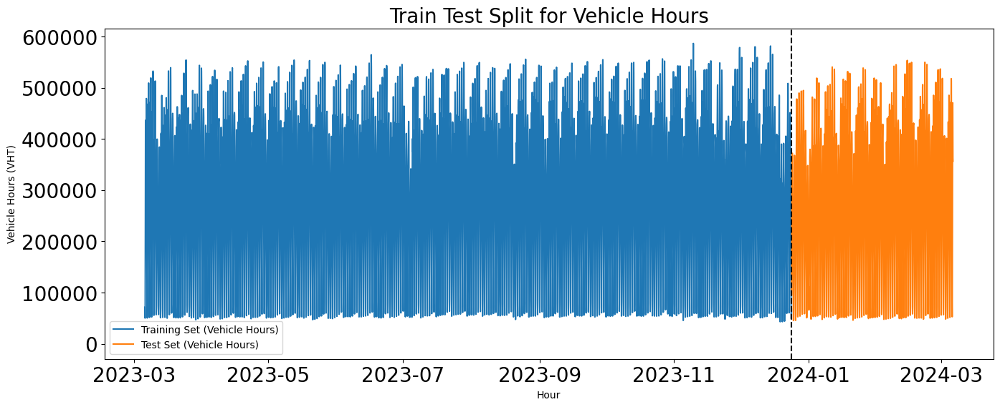

In [ ]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VHT (Veh-Hours)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['VHT (Veh-Hours)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Hours)', 'Test Set (Vehicle Hours)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Vehicle Hours (VHT)")
plt.title("Train Test Split for Vehicle Hours", fontsize = 20)
plt.show()

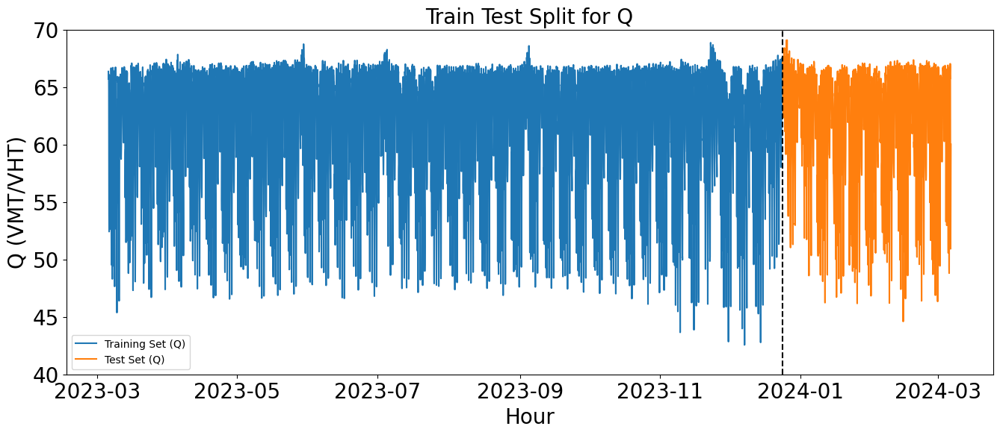

In [ ]:
# Q is the sum of VMT divided by the sum of VHT or space mean
# speeds/harmonic mean of speeds on the freeway.
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['Q (VMT/VHT)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['Q (VMT/VHT)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Q)', 'Test Set (Q)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Q (VMT/VHT)", fontsize = 20)
plt.ylim([40, 70])
plt.title("Train Test Split for Q", fontsize = 20)
plt.show()

In [ ]:
# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342


# Prepare Data for Training the Models.

* With the following function block, let's set our data set as training and test data set in a model appropriate way

In [ ]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data for input into (samples, timesteps = seq_len, features = 1).
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]

* The **seq_len** parameter determines how far back the model will look at historical data, helping the model to capture time dependencies. This will be the timesteps we will use.
* We should note that if **seq_len** is too large, the model can become complex and prone to overlearning. For purposes of this implementation, **seq_len** will be fixed to 20 for all models.

In [ ]:
df_vht = df_norm.copy()
df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', 'VHT (Veh-Hours)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vmt_norm', 'Q_norm'])
#df_vht = df.copy()
#df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', '# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_vmt = df_norm.copy()
df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vht_norm', 'Q_norm'])
#df_vmt = df.copy()
#df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)','# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_Q = df_norm.copy()
df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                            'Q (VMT/VHT)', '# Lane Points', '% Observed',
                            'vmt_norm', 'vht_norm'])

#df_Q = df_norm.copy()
#df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
#                            '# Lane Points', '% Observed', 'vmt_norm',
#                            'vht_norm', 'Q_norm'])

In [ ]:
df_norm2 = df_norm.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                   '# Lane Points', '% Observed',])
df_norm2

,Q (VMT/VHT),vmt_norm,vht_norm,Q_norm
Hour,,,,
2023-03-06 00:00:00,66.359379,0.079266,0.051819,0.896983
2023-03-06 01:00:00,65.964212,0.029970,0.019358,0.882088
2023-03-06 02:00:00,65.684314,0.020192,0.013156,0.871538
2023-03-06 03:00:00,66.012154,0.061179,0.040319,0.883895
2023-03-06 04:00:00,66.103598,0.211209,0.141126,0.887342
...,...,...,...,...
2024-03-06 07:00:00,53.107203,0.901642,0.773489,0.397474
2024-03-06 08:00:00,50.924729,0.874690,0.786497,0.315210
2024-03-06 09:00:00,54.672581,0.799220,0.665724,0.456477


In [ ]:
df_vht

,vht_norm
Hour,
2023-03-06 00:00:00,0.051819
2023-03-06 01:00:00,0.019358
2023-03-06 02:00:00,0.013156
2023-03-06 03:00:00,0.040319
2023-03-06 04:00:00,0.141126
...,...
2024-03-06 07:00:00,0.773489
2024-03-06 08:00:00,0.786497
2024-03-06 09:00:00,0.665724


In [ ]:
df_vmt

,vmt_norm
Hour,
2023-03-06 00:00:00,0.079266
2023-03-06 01:00:00,0.029970
2023-03-06 02:00:00,0.020192
2023-03-06 03:00:00,0.061179
2023-03-06 04:00:00,0.211209
...,...
2024-03-06 07:00:00,0.901642
2024-03-06 08:00:00,0.874690
2024-03-06 09:00:00,0.799220


In [ ]:
df_Q

,Q_norm
Hour,
2023-03-06 00:00:00,0.896983
2023-03-06 01:00:00,0.882088
2023-03-06 02:00:00,0.871538
2023-03-06 03:00:00,0.883895
2023-03-06 04:00:00,0.887342
...,...
2024-03-06 07:00:00,0.397474
2024-03-06 08:00:00,0.315210
2024-03-06 09:00:00,0.456477


In [ ]:
a = int(input("Enter a number (Odd Number for Vehicle Hours,\
Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/\
Harmonic Speed)): "))

feature = ""
selected_df = ""
feature_norm = ""
feature_field = ""

if a % 2 == 0:
    feature = 'Vehicle Miles Traveled'
    selected_df = df_vmt
    feature_norm = 'vmt_norm'
    feature_field = 'VMT (Veh-Miles)'

elif a % 3 == 0:
    feature = 'Efficiency (Q)'
    selected_df = df_Q
    feature_norm = 'Q_norm'
    feature_field = 'Q (VMT/VHT)'

else:
    feature = 'Vehicle Hours Traveled'
    selected_df = df_vht
    feature_norm = 'vht_norm'
    feature_field = 'VHT (Veh-Hours)'

print("You've chosen: {0}/{1}/{2}".format(feature, feature_norm, feature_field))

Enter a number (Odd Number for Vehicle Hours,Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/Harmonic Speed)): 3
You've chosen: Efficiency (Q)/Q_norm/Q (VMT/VHT)


In [ ]:
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)


print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (7036, 20, 1)
y_train.shape =  (7036,)
X_test.shape =  (1739, 20, 1)
y_test.shape =  (1739,)


In [ ]:
X_train

array([[[0.89698319],
        [0.88208833],
        [0.87153823],
        ...,
        [0.3795464 ],
        [0.53618808],
        [0.75291884]],

       [[0.88208833],
        [0.87153823],
        [0.88389539],
        ...,
        [0.53618808],
        [0.75291884],
        [0.83297667]],

       [[0.87153823],
        [0.88389539],
        [0.88734215],
        ...,
        [0.75291884],
        [0.83297667],
        [0.88284357]],

       ...,

       [[0.90815155],
        [0.89846576],
        [0.90487378],
        ...,
        [0.84631315],
        [0.86101689],
        [0.95386939]],

       [[0.89846576],
        [0.90487378],
        [0.91890749],
        ...,
        [0.86101689],
        [0.95386939],
        [0.96329094]],

       [[0.90487378],
        [0.91890749],
        [0.9199068 ],
        ...,
        [0.95386939],
        [0.96329094],
        [0.96826151]]])

In [ ]:
X_test

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [ ]:
y_train

array([0.83297667, 0.88284357, 0.88000964, ..., 0.96329094, 0.96826151,
       0.96781635])

In [ ]:
y_test

array([0.9741406 , 0.95280242, 0.91950719, ..., 0.4564768 , 0.60949634,
       0.65818159])

## Essential Variables.

In [ ]:
epochs = 50
batch_size = 1000
#loss = 'MAE'
loss = 'MSE'
#activation = 'sigmoid'
activation = 'tanh'
#activation = 'relu'

## Training Loss vs. Epochs Plot

Plotting Accuracy and Validation Accuracy vs Epochs. Code taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/.

In [ ]:
def plot_training_loss(model, model_name):
    model.history.keys()
    plt.plot(model.history['loss'])
    plt.title('Training Loss vs. Epochs for {0}'.format(model_name))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

# Single Models

## RNN model

### Create Vanilla RNN Model.

In [ ]:
rnn_model = Sequential()

rnn_model.add(SimpleRNN(32,activation=activation,return_sequences=True,
                        input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.5))

#rnn_model.add(SimpleRNN(32,activation="tanh",return_sequences=True))
#rnn_model.add(Dropout(0.5))

rnn_model.add(SimpleRNN(60,activation=activation,return_sequences=False))
rnn_model.add(Dropout(0.5))

rnn_model.add(Dense(1))

rnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 20, 32)         │         1,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_1 (SimpleRNN)        │ (None, 60)             │         5,580 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 60)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            61 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,729 (26.29 KB)

 Trainable params: 6,729 (26.29 KB)

 Non-trainable params: 0 (0.00 B)

### Train Vanilla RNN Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step - loss: 0.7378
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.4369
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.3147
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.2286
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.1710
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.1394
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.1158
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.1013
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0906
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0807
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0738
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.0670
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0622
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0573
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0542
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

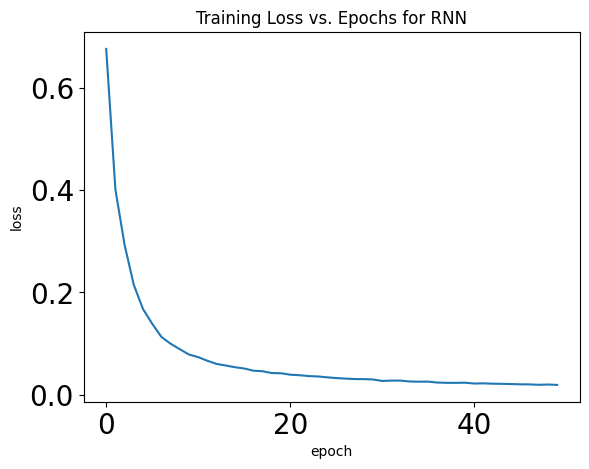

In [ ]:
rnn_model.compile(optimizer="adam",loss=loss)
rnn_epochs = rnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(rnn_epochs, "RNN")

### Evaluate Vanilla RNN Model using MAE, RMSE, and R2.

In [ ]:
print("RNN Predictions for Training Set")
rnn_predictions_train = rnn_model.predict(X_train)
print("RNN Predictions for Testing Set")
rnn_predictions_test = rnn_model.predict(X_test)
rnn_mae = mean_absolute_error(y_test,rnn_predictions_test)
print("MAE of RNN model = ",rnn_mae)
rnn_rmse =  mean_squared_error(y_test,rnn_predictions_test) ** 0.5
print("RMSE of RNN model = ",rnn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
rnn_mape_score = 100*mean_absolute_percentage_error(y_test,rnn_predictions_test)
print("MAPE Score of RNN model = {0} %".format(rnn_mape_score))

RNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of RNN model =  0.04614642967784581
RMSE of RNN model =  0.06600411512199102
MAPE Score of RNN model = 9.955337453863947 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
rnn_predictions_inv_train = scaler.inverse_transform(rnn_predictions_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
rnn_predictions_inv_test = scaler.inverse_transform(rnn_predictions_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
rnn_predictions_inv_train = rnn_predictions_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
rnn_predictions_inv_test = rnn_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': rnn_predictions_inv_train})
results_RNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.800362
1,2023-03-06 01:00:00,66.153566,65.392532
2,2023-03-06 02:00:00,66.090926,65.966560
3,2023-03-06 03:00:00,65.942371,66.189713
4,2023-03-06 04:00:00,66.077982,66.457855
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,65.380173
7032,2023-12-24 01:00:00,67.723487,65.794708
7033,2023-12-24 02:00:00,67.931737,67.454559
7034,2023-12-24 03:00:00,68.041604,67.680565


#### With Testing Dates.

In [ ]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': rnn_predictions_inv_test})
results_RNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,67.268661
1,2023-12-25 02:00:00,67.699903,67.252617
2,2023-12-25 03:00:00,66.963961,67.095367
3,2023-12-25 04:00:00,67.132987,66.665268
4,2023-12-25 05:00:00,67.516792,66.976120
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.791504
1735,2024-03-06 08:00:00,53.606866,55.671413
1736,2024-03-06 09:00:00,56.729354,55.740604
1737,2024-03-06 10:00:00,60.111626,59.018696


### Plotting Predictions for Q/VMT/VHT made by RNN Model.

#### Only Testing Data.

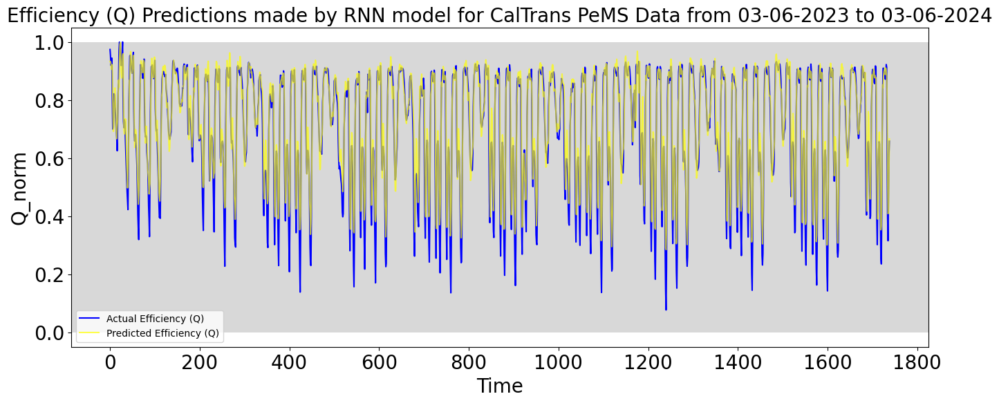

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(rnn_predictions_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

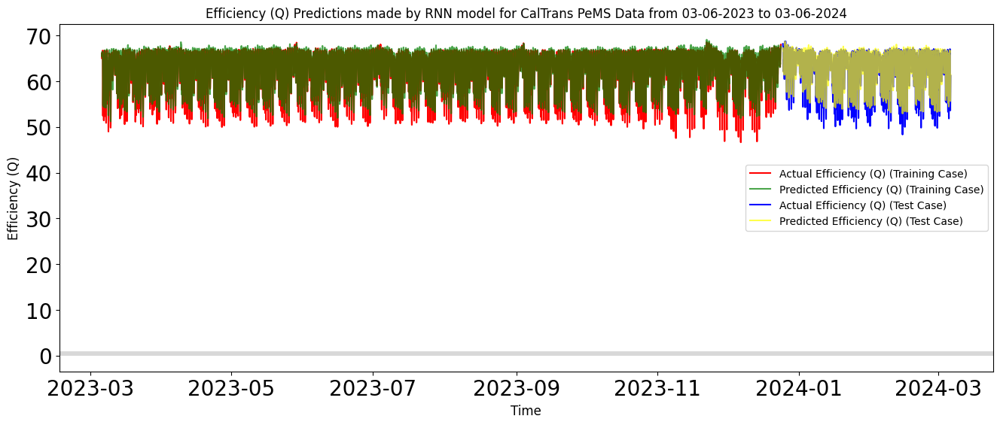

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_RNN_train['Date'], results_RNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_RNN_train['Date'],  results_RNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Predicted'], alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name))
plt.xlabel('Time', fontsize = 12)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for RNN.

In [ ]:
results_RNN = [results_RNN_train, results_RNN_test]
results_RNN = pd.concat(results_RNN)
display(results_RNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.800362
1,2023-03-06 01:00:00,66.153566,65.392532
2,2023-03-06 02:00:00,66.090926,65.966560
3,2023-03-06 03:00:00,65.942371,66.189713
4,2023-03-06 04:00:00,66.077982,66.457855
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.791504
1735,2024-03-06 08:00:00,53.606866,55.671413
1736,2024-03-06 09:00:00,56.729354,55.740604
1737,2024-03-06 10:00:00,60.111626,59.018696


### Plotting Residuals for Actual and Predicted Results for RNN.

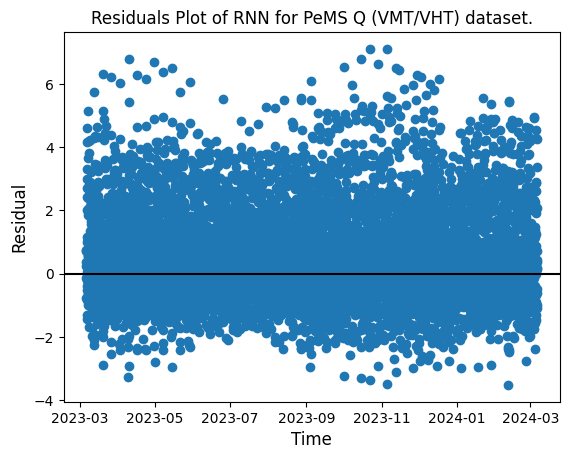

In [ ]:
actual_arr_RNN = np.array(results_RNN['Actual'])
predicted_arr_RNN = np.array(results_RNN['Predicted'])
residuals_RNN = predicted_arr_RNN - actual_arr_RNN
plt.scatter(results_RNN['Date'], residuals_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of RNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

### Energy Consumption

In [ ]:
import time

start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 3.7670135498046875e-05 seconds


In [ ]:
# Create a symbolic input
symbolic_input = tf.keras.Input(shape=(X_train.shape[1], 1))
# estimate model energy
#energy_rnn = keras_spiking.ModelEnergy(rnn_model, example_data=None)
#energy_rnn = keras_spiking.ModelEnergy(rnn_model, example_data=symbolic_input)
#energy_rnn.summary(print_warnings=False)

In [ ]:
#energy_rnn.summary(
#    columns=(
#        "name",
#        "energy cpu",
#        "energy gpu",
#        "synop_energy cpu",
#        "synop_energy gpu",
#        "neuron_energy cpu",
#        "neuron_energy gpu",
#    ),
#    print_warnings=False,
#)

## LSTM model

### Create LSTM Model.

In [ ]:
lstm_model = Sequential()

#lstm_model.add(LSTM(32,activation=activation,return_sequences=True,
#                    input_shape=(X_train.shape[1],1)))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(32,activation=activation,return_sequences=True,
                    input_shape=(100,1)))
lstm_model.add(Dropout(0.5))

#lstm_model.add(LSTM(32,activation="sigmoid",return_sequences=True))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(60,activation=activation,return_sequences=False))
lstm_model.add(Dropout(0.5))

lstm_model.add(Dense(1))

lstm_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 100, 32)        │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 60)             │        22,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 60)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            61 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,733 (104.43 KB)

 Trainable params: 26,733 (104.43 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - loss: 0.2706
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 221ms/step - loss: 0.1110
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0783
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 369ms/step - loss: 0.0714
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 340ms/step - loss: 0.0678
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step - loss: 0.0632
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - loss: 0.0614
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - loss: 0.0603
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 0.0586
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.0578
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 119ms/step - loss: 0.0554
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 122ms/step - loss: 0.0536
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 121ms/step - loss: 0.0535
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 202ms/step - loss: 0.0523
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - loss: 0.0512
Epoch 16/50
8/8 ━━━

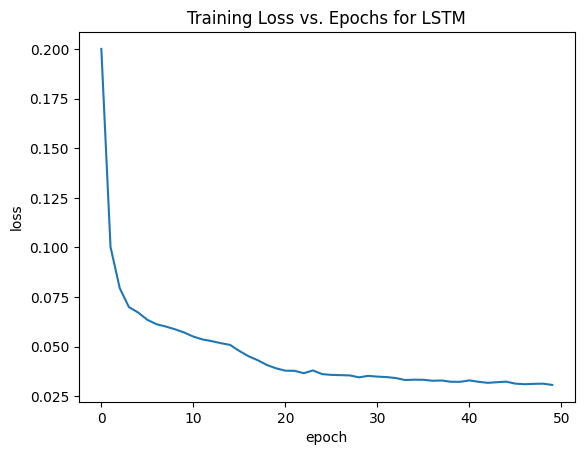

In [ ]:
lstm_model.compile(optimizer="adam",loss=loss)
lstm_epochs = lstm_model.fit(X_train, y_train, epochs=epochs,
                             batch_size=batch_size)
plot_training_loss(lstm_epochs, "LSTM")

### Evaluate LSTM model using MAE, RMSE, and R^2.

In [ ]:
print("LSTM Predictions for Training Set")
lstm_pred_train = lstm_model.predict(X_train)
print("LSTM Predictions for Testing Set")
lstm_pred_test = lstm_model.predict(X_test)
lstm_mae = mean_absolute_error(y_test,lstm_pred_test)
print("MAE of LSTM model = ",lstm_mae)
lstm_rmse =  mean_squared_error(y_test,lstm_pred_test) ** 0.5
print("RMSE of LSTM model = ",lstm_rmse)
lstm_r2_score = r2_score(y_test, lstm_pred_test)
print("R^2 Score of LSTM model = ",lstm_r2_score)
lstm_mape_score = mean_absolute_percentage_error(y_test,lstm_pred_test)
print("MAPE Score of LSTM model = {0} %".format(lstm_mape_score))

LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
MAE of LSTM model =  0.11700332343903054
RMSE of LSTM model =  0.14676146949660873
R^2 Score of LSTM model =  0.4676379538511185
MAPE Score of LSTM model = 0.23880718973007503 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_predictions_inv_train = scaler.inverse_transform(lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_predictions_inv_test = scaler.inverse_transform(lstm_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
lstm_predictions_inv_train = lstm_predictions_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_predictions_inv_test = lstm_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                   'Actual': y_train_inverse,
                                   'Predicted': lstm_predictions_inv_train})
results_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,61.293098
1,2023-03-06 01:00:00,66.153566,62.847706
2,2023-03-06 02:00:00,66.090926,64.369690
3,2023-03-06 03:00:00,65.942371,65.406868
4,2023-03-06 04:00:00,66.077982,65.840317
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,61.520061
7032,2023-12-24 01:00:00,67.723487,62.089596
7033,2023-12-24 02:00:00,67.931737,62.906342
7034,2023-12-24 03:00:00,68.041604,63.608055


#### With Testing Dates.


In [ ]:
results_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                             'Actual': y_test_inverse,
                             'Predicted': lstm_predictions_inv_test})
results_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,64.256134
1,2023-12-25 02:00:00,67.699903,64.234398
2,2023-12-25 03:00:00,66.963961,63.966446
3,2023-12-25 04:00:00,67.132987,63.474304
4,2023-12-25 05:00:00,67.516792,63.004784
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.154987
1735,2024-03-06 08:00:00,53.606866,60.023365
1736,2024-03-06 09:00:00,56.729354,58.103443
1737,2024-03-06 10:00:00,60.111626,57.173443


### Plotting Predictions for Transmitted/Received Bytes made by LSTM Model.

#### Only Test Data.


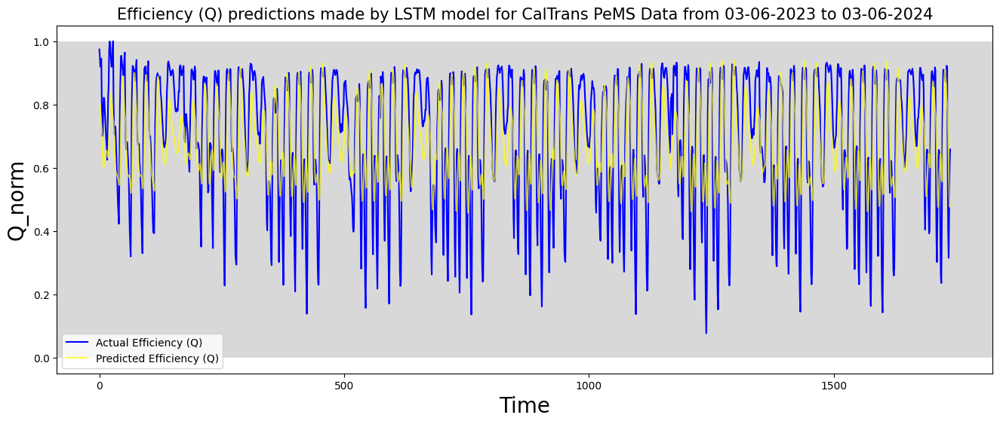

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} predictions made by LSTM model for {1}".
          format(feature, title_name), fontsize = 15)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

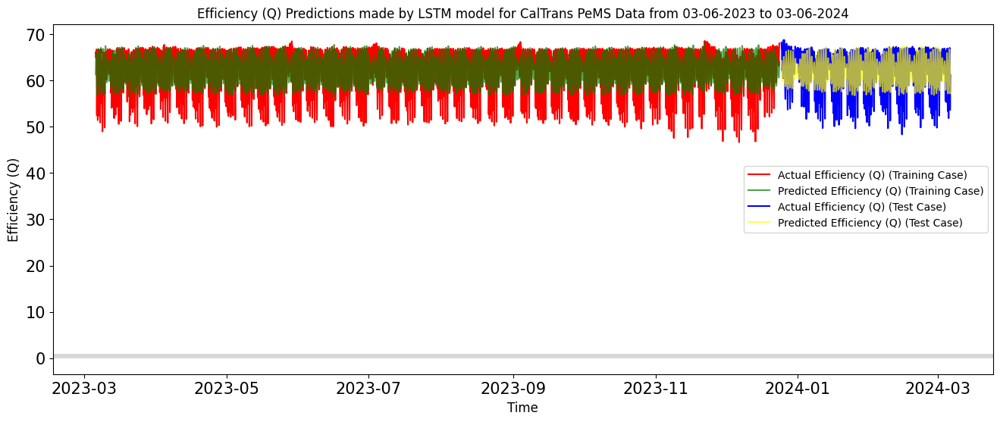

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_train['Date'],  results_LSTM_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM.

In [ ]:
results_LSTM = [results_LSTM_train, results_LSTM_test]
results_LSTM = pd.concat(results_LSTM)
display(results_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,61.293098
1,2023-03-06 01:00:00,66.153566,62.847706
2,2023-03-06 02:00:00,66.090926,64.369690
3,2023-03-06 03:00:00,65.942371,65.406868
4,2023-03-06 04:00:00,66.077982,65.840317
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.154987
1735,2024-03-06 08:00:00,53.606866,60.023365
1736,2024-03-06 09:00:00,56.729354,58.103443
1737,2024-03-06 10:00:00,60.111626,57.173443


### Plotting Residuals for Actual and Predicted Results for LSTM.

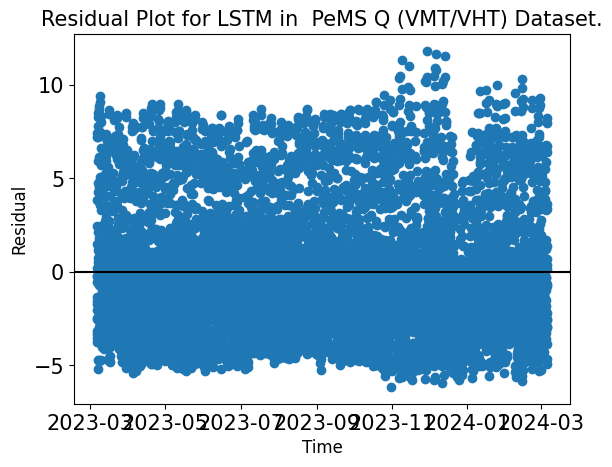

In [ ]:
actual_arr_LSTM = np.array(results_LSTM['Actual'])
predicted_arr_LSTM = np.array(results_LSTM['Predicted'])
residuals_LSTM = predicted_arr_LSTM - actual_arr_LSTM
plt.scatter(results_LSTM['Date'], residuals_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plot for LSTM in  PeMS {} Dataset.".format(feature_field),
          fontsize = 15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the LSTM model, it can be concluded that the LSTM model is a good fit.

### Energy Consumption

In [ ]:
# estimate model energy for lstm
#energy_lstm = keras_spiking.ModelEnergy(lstm_model)
#energy_lstm.summary(print_warnings=False)

In [ ]:
#energy_lstm.summary(
#    columns=(
#        "name",
#        "energy cpu",
#        "energy gpu",
#        "synop_energy cpu",
#        "synop_energy gpu",
#        "neuron_energy cpu",
#        "neuron_energy gpu",
#    ),
#    print_warnings=False,
#)

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 6.318092346191406e-05 seconds


## GRU Model

### Create GRU Model.

In [ ]:
gru_model = Sequential()

gru_model.add(GRU(32,activation=activation,return_sequences=True,
                  input_shape=(X_train.shape[1],1)))
gru_model.add(Dropout(0.5))

#gru_model.add(GRU(32,activation="sigmoid",return_sequences=True))
#gru_model.add(Dropout(0.5))

gru_model.add(GRU(60,activation=activation,return_sequences=False))
gru_model.add(Dropout(0.5))

gru_model.add(Dense(1))

gru_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru (GRU)                       │ (None, 20, 32)         │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 60)             │        16,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 60)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            61 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,341 (79.46 KB)

 Trainable params: 20,341 (79.46 KB)

 Non-trainable params: 0 (0.00 B)

### Train GRU Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 270ms/step - loss: 0.3986
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.0811
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.0780
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 174ms/step - loss: 0.0592
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0560
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 167ms/step - loss: 0.0520
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 306ms/step - loss: 0.0487
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 245ms/step - loss: 0.0475
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 169ms/step - loss: 0.0448
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 167ms/step - loss: 0.0447
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 253ms/step - loss: 0.0434
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 171ms/step - loss: 0.0421
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 276ms/step - loss: 0.0400
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 296ms/step - loss: 0.0403
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 170ms/step - loss: 0.0392
Epoch 16/50
8/8 ━━━

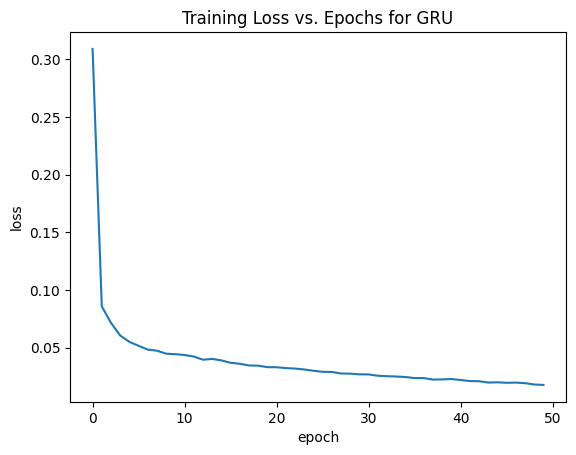

In [ ]:
gru_model.compile(optimizer="adam",loss=loss)
gru_epochs = gru_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(gru_epochs, "GRU")

### Evaluate GRU model using MAE, RMSE, and R^2.

In [ ]:
print("GRU Predictions for Training Set")
gru_pred_train = gru_model.predict(X_train)
print("GRU Predictions for Testing Set")
gru_pred_test = gru_model.predict(X_test)
gru_mae = mean_absolute_error(y_test,gru_pred_test)
print("MAE of GRU model = ",gru_mae)
gru_rmse =  mean_squared_error(y_test,gru_pred_test) ** 0.5
print("RMSE of GRU model = ",gru_rmse)
#gru_r2_score = r2_score(y_test, gru_pred_test)
#print("R^2 Score of GRU model = ",gru_r2_score)
gru_mape_score = 100*mean_absolute_percentage_error(y_test, gru_pred_test)
print("MAPE Score of GRU model = {0} %".format(gru_mape_score))

GRU Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
GRU Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
MAE of GRU model =  0.07572101833701744
RMSE of GRU model =  0.08862970488529709
MAPE Score of GRU model = 13.31436271331445 %


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
gru_pred_inv_train = scaler.inverse_transform(gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
gru_pred_inv_test = scaler.inverse_transform(gru_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
gru_pred_inv_train = gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
gru_pred_inv_test = gru_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                            'Actual': y_train_inverse,
                            'Predicted': gru_pred_inv_train})
results_GRU_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.827774
1,2023-03-06 01:00:00,66.153566,64.903130
2,2023-03-06 02:00:00,66.090926,65.143394
3,2023-03-06 03:00:00,65.942371,64.593872
4,2023-03-06 04:00:00,66.077982,64.254662
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,64.050224
7032,2023-12-24 01:00:00,67.723487,64.104065
7033,2023-12-24 02:00:00,67.931737,65.931366
7034,2023-12-24 03:00:00,68.041604,65.735771


#### With Testing Dates.

In [ ]:
results_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                            'Actual': y_test_inverse,
                            'Predicted': gru_pred_inv_test})
results_GRU_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,65.490501
1,2023-12-25 02:00:00,67.699903,65.598961
2,2023-12-25 03:00:00,66.963961,65.067200
3,2023-12-25 04:00:00,67.132987,64.382828
4,2023-12-25 05:00:00,67.516792,64.729584
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.054764
1735,2024-03-06 08:00:00,53.606866,54.763863
1736,2024-03-06 09:00:00,56.729354,54.245987
1737,2024-03-06 10:00:00,60.111626,57.475101


### Plotting Predictions for Q/VMT/VHT made by GRU Model.

#### Testing Data Only.

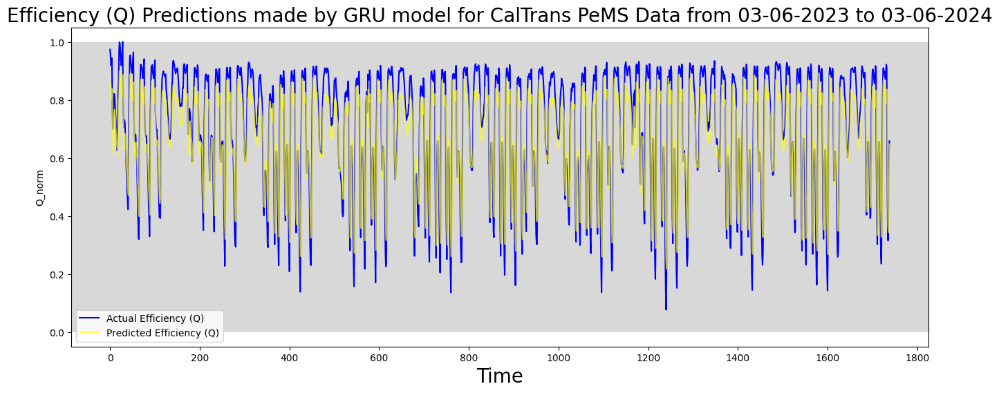

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 10)
plt.legend()
plt.show()

#### Training and Test Data Combined.

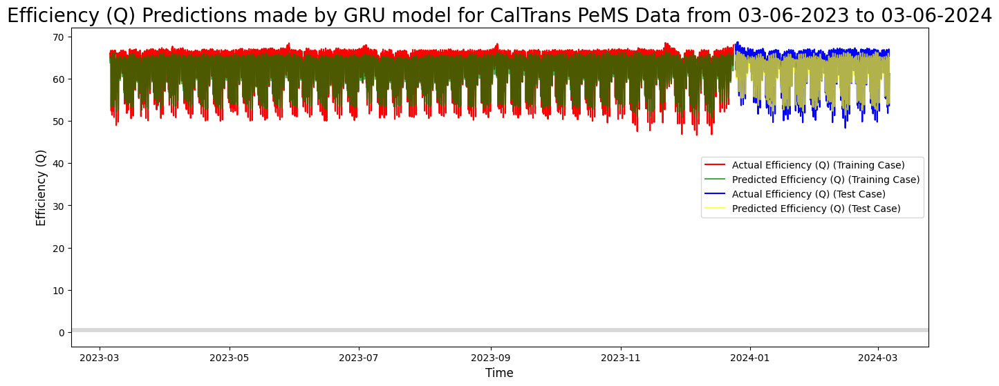

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_GRU_train['Date'], results_GRU_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_GRU_train['Date'],  results_GRU_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for GRU.

In [ ]:
results_GRU = [results_GRU_train, results_GRU_test]
results_GRU = pd.concat(results_GRU)
display(results_GRU)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.827774
1,2023-03-06 01:00:00,66.153566,64.903130
2,2023-03-06 02:00:00,66.090926,65.143394
3,2023-03-06 03:00:00,65.942371,64.593872
4,2023-03-06 04:00:00,66.077982,64.254662
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.054764
1735,2024-03-06 08:00:00,53.606866,54.763863
1736,2024-03-06 09:00:00,56.729354,54.245987
1737,2024-03-06 10:00:00,60.111626,57.475101


### Plotting Residuals for Actual and Predicted Results for GRU.

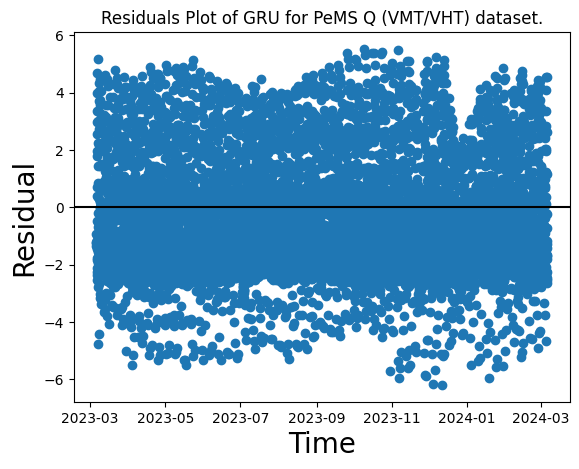

In [ ]:
# Plotting Residuals for Actual and Predicted Results for GRU.
actual_arr_GRU = np.array(results_GRU['Actual'])
predicted_arr_GRU = np.array(results_GRU['Predicted'])
residuals_GRU = predicted_arr_GRU - actual_arr_GRU
plt.scatter(results_GRU['Date'], residuals_GRU)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the GRU model, it can be concluded that the GRU model is a good fit.

### Energy Consumption

In [ ]:
# estimate model energy for gru
#energy_gru = keras_spiking.ModelEnergy(gru_model)
#energy_gru.summary(print_warnings=False)

In [ ]:
#energy_gru.summary(
#    columns=(
#        "name",
#        "energy cpu",
#        "energy gpu",
#        "synop_energy cpu",
#        "synop_energy gpu",
#        "neuron_energy cpu",
#        "neuron_energy gpu",
#    ),
#    print_warnings=False,
#)

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 6.008148193359375e-05 seconds


## CNN (Conv1D) model

### Create CNN Model.

In [ ]:
cnn_model = Sequential()

cnn_model.add(Conv1D(filters=60, kernel_size=2, activation='tanh',
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Flatten())
cnn_model.add(Dense(50, activation='tanh'))
cnn_model.add(Dense(1))
cnn_model.compile(optimizer='adam', loss='mse')
cnn_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 19, 60)         │           180 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 9, 60)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 8, 60)          │         7,260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 4, 60)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 3, 60)          │         7,260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 1, 60)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 60)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 50)             │         3,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,801 (69.54 KB)

 Trainable params: 17,801 (69.54 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 41ms/step - loss: 0.5278
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0825
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0726
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0722
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0618
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0610
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0594
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0562
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0524
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 0.0503
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0466
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0427
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0405
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0386
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0360
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

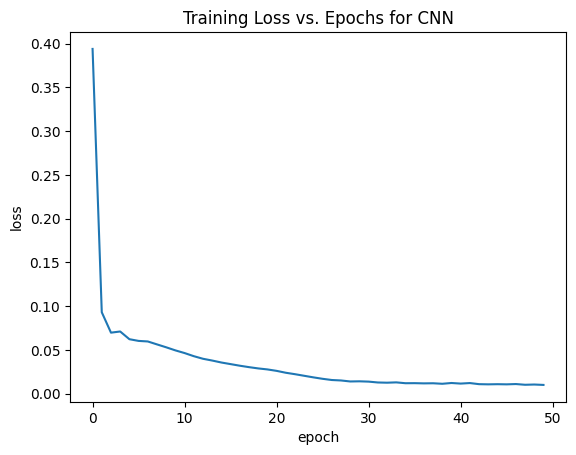

In [ ]:
cnn_model.compile(optimizer="adam",loss=loss)
cnn_epochs = cnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(cnn_epochs, "CNN")

### Evaluate CNN model using MAE, RMSE, and R^2.

In [ ]:
print("CNN Predictions for Training Set")
cnn_pred_train = cnn_model.predict(X_train)
print("CNN Predictions for Testing Set")
cnn_pred_test = cnn_model.predict(X_test)
cnn_mae = mean_absolute_error(y_test,cnn_pred_test)
print("MAE of CNN model = ",cnn_mae)
cnn_rmse =  mean_squared_error(y_test,cnn_pred_test) ** 0.5
print("RMSE of CNN model = ",cnn_rmse)
#cnn_r2_score = r2_score(y_test, cnn_pred_test)
#print("R^2 Score of CNN model = ",cnn_r2_score)
cnn_mape_score = 100*mean_absolute_percentage_error(y_test, cnn_pred_test)
print("MAPE Score of CNN model = {0} %".format(cnn_mape_score))

CNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
CNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN model =  0.08098214515393867
RMSE of CNN model =  0.11029961858657099
MAPE Score of CNN model = 15.66762279764053 %


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_pred_inv_train = scaler.inverse_transform(cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_pred_inv_test = scaler.inverse_transform(cnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_pred_inv_train = cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_pred_inv_test = cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [ ]:
results_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_pred_inv_train})
results_CNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,66.053864
1,2023-03-06 01:00:00,66.153566,67.262154
2,2023-03-06 02:00:00,66.090926,66.710373
3,2023-03-06 03:00:00,65.942371,66.799957
4,2023-03-06 04:00:00,66.077982,67.064102
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,62.628437
7032,2023-12-24 01:00:00,67.723487,63.160652
7033,2023-12-24 02:00:00,67.931737,63.757221
7034,2023-12-24 03:00:00,68.041604,64.559120


#### With Testing Dates.

In [ ]:
results_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_pred_inv_test})
results_CNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,65.464081
1,2023-12-25 02:00:00,67.699903,65.149818
2,2023-12-25 03:00:00,66.963961,64.994026
3,2023-12-25 04:00:00,67.132987,64.883949
4,2023-12-25 05:00:00,67.516792,64.714783
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,59.227436
1735,2024-03-06 08:00:00,53.606866,58.174583
1736,2024-03-06 09:00:00,56.729354,59.704937
1737,2024-03-06 10:00:00,60.111626,60.758465


### Plotting Predictions for Q/VHT/VMT made by CNN Model.

#### Only Testing Data.

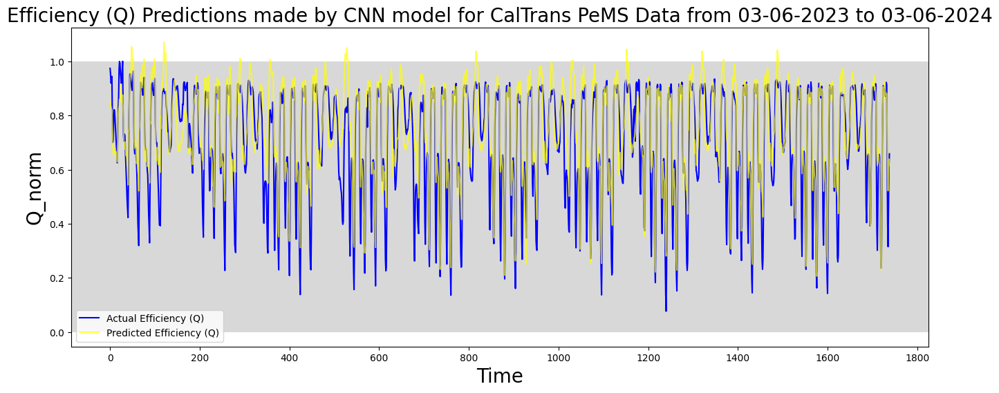

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

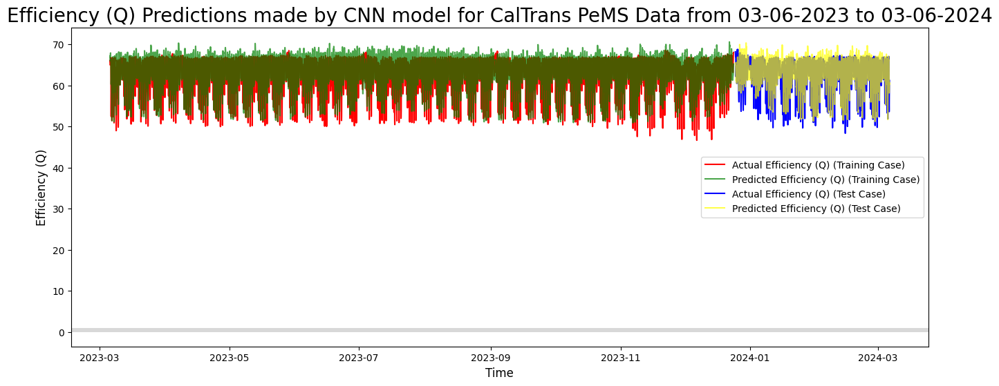

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_train['Date'], results_CNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_train['Date'],  results_CNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN.

In [ ]:
results_CNN = [results_CNN_train, results_CNN_test]
results_CNN = pd.concat(results_CNN)
display(results_CNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,66.053864
1,2023-03-06 01:00:00,66.153566,67.262154
2,2023-03-06 02:00:00,66.090926,66.710373
3,2023-03-06 03:00:00,65.942371,66.799957
4,2023-03-06 04:00:00,66.077982,67.064102
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,59.227436
1735,2024-03-06 08:00:00,53.606866,58.174583
1736,2024-03-06 09:00:00,56.729354,59.704937
1737,2024-03-06 10:00:00,60.111626,60.758465


### Plotting Residuals for Actual and Predicted Results for CNN.

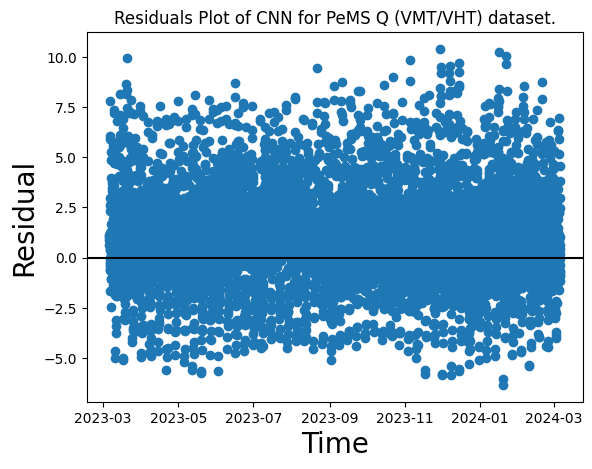

In [ ]:
actual_arr_CNN = np.array(results_CNN['Actual'])
predicted_arr_CNN = np.array(results_CNN['Predicted'])
residuals_CNN = predicted_arr_CNN - actual_arr_CNN
plt.scatter(results_CNN['Date'], residuals_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of CNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN model, it can be concluded that the CNN model is a good fit.

### Energy Consumption

In [ ]:
# estimate model energy for cnn
#energy_cnn = keras_spiking.ModelEnergy(cnn_model)
#energy_cnn.summary(print_warnings=False)

In [ ]:
#energy_cnn.summary(
#    columns=(
#        "name",
#        "energy cpu",
#        "energy gpu",
#        "synop_energy cpu",
#        "synop_energy gpu",
#        "neuron_energy cpu",
#        "neuron_energy gpu",
#    ),
#    print_warnings=False,
#)

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 6.365776062011719e-05 seconds


# Hybrid Models

## CNN-RNN model

### Create CNN-RNN Model.

In [ ]:
cnn_rnn_model = Sequential()

cnn_rnn_model.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

cnn_rnn_model.add(Conv1D(filters=64, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(SimpleRNN(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_rnn_model.add(Dropout(0.5))

#cnn_rnn_model.add(SimpleRNN(64,activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

#cnn_rnn_model.add(SimpleRNN(64, activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

cnn_rnn_model.add(SimpleRNN(96, activation="tanh",return_sequences=False))
cnn_rnn_model.add(Dropout(0.1))

cnn_rnn_model.add(Dense(1))
cnn_rnn_model.compile(optimizer='adam', loss='mse')
cnn_rnn_model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 19, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 8, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_2 (SimpleRNN)        │ (None, 96)             │        15,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            97 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,809 (77.38 KB)

 Trainable params: 19,809 (77.38 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-RNN Model.


Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - loss: 0.3541
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0893
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0494
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0393
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0362
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0325
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0272
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0246
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0218
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0198
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0187
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0174
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0162
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0155
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0148
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

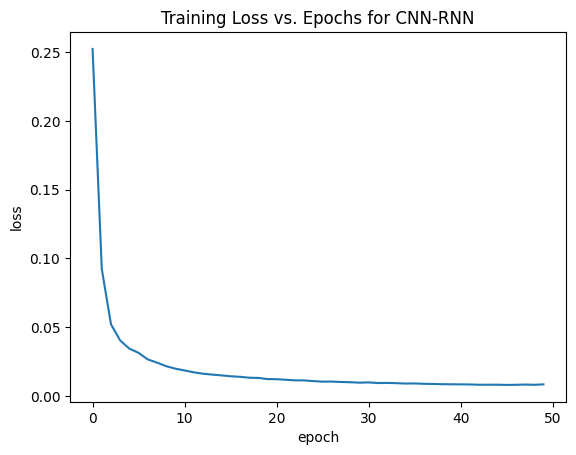

In [ ]:
cnn_rnn_model.compile(optimizer="adam",loss=loss)
cnn_rnn_epochs = cnn_rnn_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_rnn_epochs, "CNN-RNN")

### Evaluate CNN-RNN model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-RNN Predictions for Training Set")
cnn_rnn_pred_train = cnn_rnn_model.predict(X_train)
print("CNN-RNN Predictions for Testing Set")
cnn_rnn_pred_test = cnn_rnn_model.predict(X_test)
cnn_rnn_mae = mean_absolute_error(y_test,cnn_rnn_pred_test)
print("MAE of CNN-RNN model = ",cnn_rnn_mae)
cnn_rnn_rmse =  mean_squared_error(y_test,cnn_rnn_pred_test) ** 0.5
print("RMSE of CNN-RNN model = ",cnn_rnn_rmse)
cnn_rnn_r2_score = r2_score(y_test,cnn_rnn_pred_test)
print("R2 Score of CNN-RNN model = ",cnn_rnn_r2_score)
cnn_rnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_rnn_pred_test)
print("MAPE Score of CNN-RNN model = {0} %".format(cnn_rnn_mape_score))

CNN-RNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
CNN-RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of CNN-RNN model =  0.0600227863810694
RMSE of CNN-RNN model =  0.0807604633462825
R2 Score of CNN-RNN model =  0.8387942285391616
MAPE Score of CNN-RNN model = 10.767323720259855 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_rnn_pred_inv_train = scaler.inverse_transform(cnn_rnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_rnn_pred_inv_test = scaler.inverse_transform(cnn_rnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_rnn_pred_inv_train = cnn_rnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_rnn_pred_inv_test = cnn_rnn_pred_inv_test.flatten()

In [ ]:
int(test_size*df.shape[0]) + 1 - seq_len

1740

### Showing Actual y and Predicted y values as Dataframes.


#### With Training Dates.


In [ ]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_CNN_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': cnn_rnn_pred_inv_train})
results_CNN_RNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.098343
1,2023-03-06 01:00:00,66.153566,65.569885
2,2023-03-06 02:00:00,66.090926,65.406052
3,2023-03-06 03:00:00,65.942371,66.005997
4,2023-03-06 04:00:00,66.077982,65.932823
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,63.830013
7032,2023-12-24 01:00:00,67.723487,64.966911
7033,2023-12-24 02:00:00,67.931737,65.433495
7034,2023-12-24 03:00:00,68.041604,67.218109


#### With Testing Dates.

In [ ]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_CNN_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                     'Actual': y_test_inverse,
                                     'Predicted': cnn_rnn_pred_inv_test})
results_CNN_RNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,67.107246
1,2023-12-25 02:00:00,67.699903,67.693329
2,2023-12-25 03:00:00,66.963961,66.492699
3,2023-12-25 04:00:00,67.132987,66.301544
4,2023-12-25 05:00:00,67.516792,66.382149
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,60.180195
1735,2024-03-06 08:00:00,53.606866,56.708225
1736,2024-03-06 09:00:00,56.729354,57.053421
1737,2024-03-06 10:00:00,60.111626,58.737541


### Plotting Predictions for Q/VMT/VHT made by CNN-RNN Model.


#### Only Testing Data.

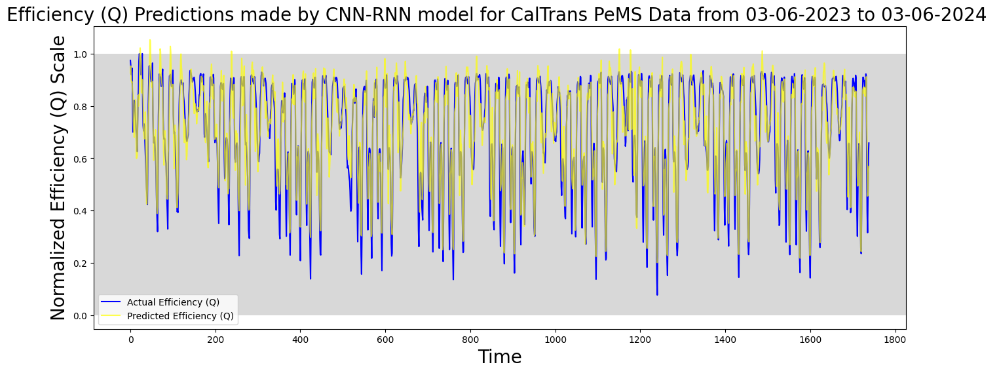

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_rnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1} ".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

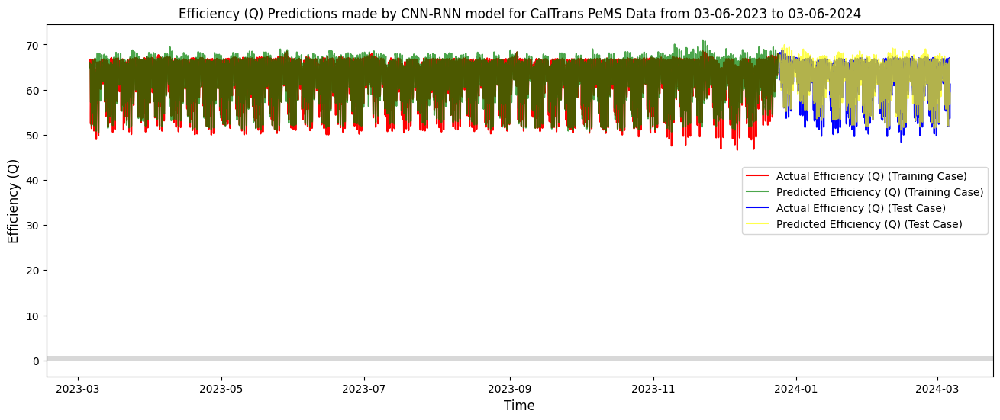

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Actual'],
         color='red',label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Predicted'],
         alpha=0.7, color='green',
          label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1}".
          format(feature, title_name), fontsize = 12)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-RNN.

In [ ]:
results_CNN_RNN = [results_CNN_RNN_train, results_CNN_RNN_test]
results_CNN_RNN = pd.concat(results_CNN_RNN)
display(results_CNN_RNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.098343
1,2023-03-06 01:00:00,66.153566,65.569885
2,2023-03-06 02:00:00,66.090926,65.406052
3,2023-03-06 03:00:00,65.942371,66.005997
4,2023-03-06 04:00:00,66.077982,65.932823
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,60.180195
1735,2024-03-06 08:00:00,53.606866,56.708225
1736,2024-03-06 09:00:00,56.729354,57.053421
1737,2024-03-06 10:00:00,60.111626,58.737541


### Plotting Residuals for Actual and Predicted Results for CNN-RNN.


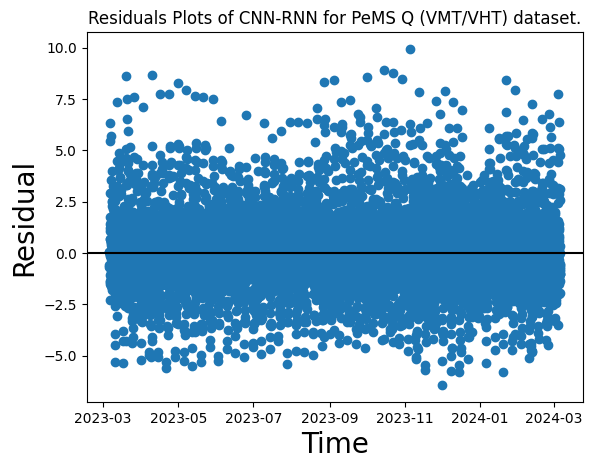

In [ ]:
actual_arr_CNN_RNN = np.array(results_CNN_RNN['Actual'])
predicted_arr_CNN_RNN = np.array(results_CNN_RNN['Predicted'])
residuals_CNN_RNN = predicted_arr_CNN_RNN - actual_arr_CNN_RNN
plt.scatter(results_CNN_RNN['Date'], residuals_CNN_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots of CNN-RNN for PeMS {} dataset.".format(feature_field))
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN-RNN model, it can be concluded that the CNN-RNN model is a good fit.

### Energy Consumption

In [ ]:
# estimate model energy for cnn-rnn model
#energy_cnn_rnn = keras_spiking.ModelEnergy(cnn_rnn_model)
#energy_cnn_rnn.summary(print_warnings=False)

In [ ]:
#energy_cnn_rnn.summary(
#    columns=(
#        "name",
#        "energy cpu",
#        "energy gpu",
#        "synop_energy cpu",
#        "synop_energy gpu",
#        "neuron_energy cpu",
#        "neuron_energy gpu",
#    ),
#    print_warnings=False,
#)

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 5.984306335449219e-05 seconds


## CNN-LSTM model

### Create CNN-LSTM Model.


In [ ]:
cnn_lstm_model = Sequential()

cnn_lstm_model.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

cnn_lstm_model.add(Conv1D(filters=64, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_model.add(Dropout(0.5))

#cnn_lstm_model.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

#cnn_lstm_model.add(LSTM(64, activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

cnn_lstm_model.add(LSTM(32, activation="tanh",return_sequences=False))
cnn_lstm_model.add(Dropout(0.1))

cnn_lstm_model.add(Dense(1))
cnn_lstm_model.compile(optimizer='adam', loss='mse')
cnn_lstm_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_5 (Conv1D)               │ (None, 19, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_6 (Conv1D)               │ (None, 8, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,705 (65.25 KB)

 Trainable params: 16,705 (65.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - loss: 0.2840
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.1044
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0630
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0687
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0578
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0584
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0556
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0537
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0530
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0528
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0512
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0504
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0482
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0468
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0461
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

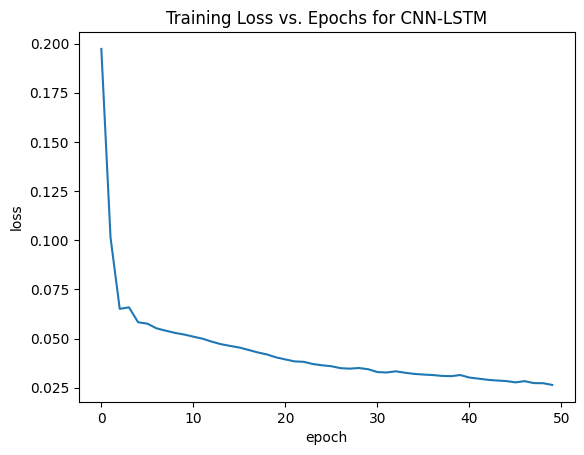

In [ ]:
cnn_lstm_model.compile(optimizer="adam",loss=loss)
cnn_lstm_epochs = cnn_lstm_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train = cnn_lstm_model.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test = cnn_lstm_model.predict(X_test)
cnn_lstm_mae = mean_absolute_error(y_test,cnn_lstm_pred_test)
print("MAE of CNN-LSTM model = ",cnn_lstm_mae)
cnn_lstm_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_rmse)
cnn_lstm_r2_score = r2_score(y_test, cnn_lstm_pred_test)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_r2_score)
cnn_lstm_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-LSTM model =  0.12325384167702863
RMSE of CNN-LSTM model =  0.15340155758186114
R^2 Score of CNN-LSTM model =  0.4183757293058167
MAPE Score of CNN-LSTM model = 24.439308435615573 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train = scaler.inverse_transform(cnn_lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test = scaler.inverse_transform(cnn_lstm_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train = cnn_lstm_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test = cnn_lstm_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.


In [ ]:
results_CNN_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train})
results_CNN_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,60.233833
1,2023-03-06 01:00:00,66.153566,62.268013
2,2023-03-06 02:00:00,66.090926,63.669685
3,2023-03-06 03:00:00,65.942371,66.154305
4,2023-03-06 04:00:00,66.077982,65.834808
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,60.967384
7032,2023-12-24 01:00:00,67.723487,61.633175
7033,2023-12-24 02:00:00,67.931737,62.017502
7034,2023-12-24 03:00:00,68.041604,63.169987


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test})
results_CNN_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,63.982307
1,2023-12-25 02:00:00,67.699903,64.001503
2,2023-12-25 03:00:00,66.963961,63.810413
3,2023-12-25 04:00:00,67.132987,63.406731
4,2023-12-25 05:00:00,67.516792,62.857113
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,63.082691
1735,2024-03-06 08:00:00,53.606866,60.300682
1736,2024-03-06 09:00:00,56.729354,57.594490
1737,2024-03-06 10:00:00,60.111626,56.837402


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM Model.

#### Only Testing Data.

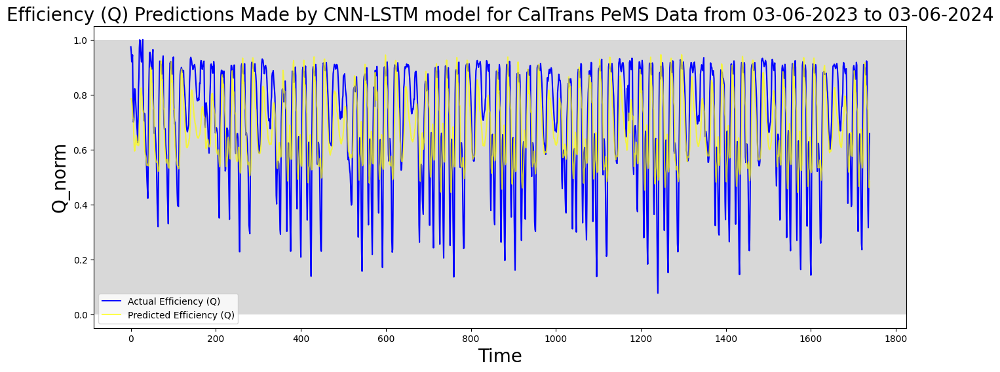

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Comsbined.

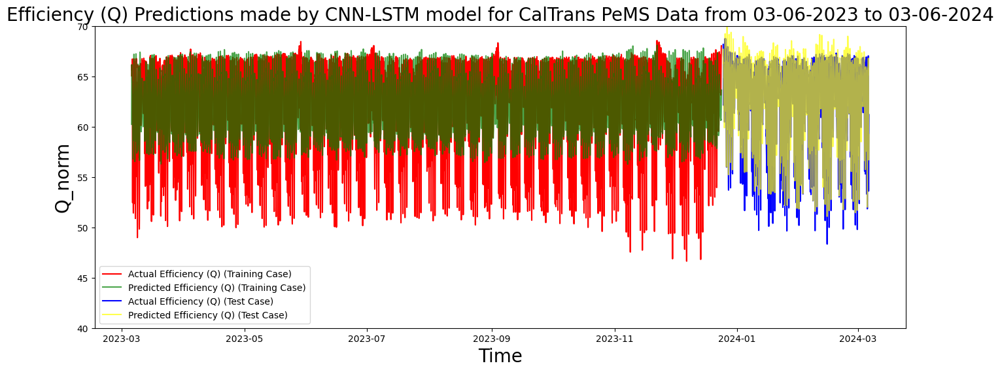

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train['Date'], results_CNN_LSTM_train['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train['Date'],  results_CNN_LSTM_train['Predicted'],
         alpha=0.7, color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM.



In [ ]:
results_CNN_LSTM = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_CNN_LSTM = pd.concat(results_CNN_LSTM)
display(results_CNN_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,60.233833
1,2023-03-06 01:00:00,66.153566,62.268013
2,2023-03-06 02:00:00,66.090926,63.669685
3,2023-03-06 03:00:00,65.942371,66.154305
4,2023-03-06 04:00:00,66.077982,65.834808
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,63.082691
1735,2024-03-06 08:00:00,53.606866,60.300682
1736,2024-03-06 09:00:00,56.729354,57.594490
1737,2024-03-06 10:00:00,60.111626,56.837402


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM.

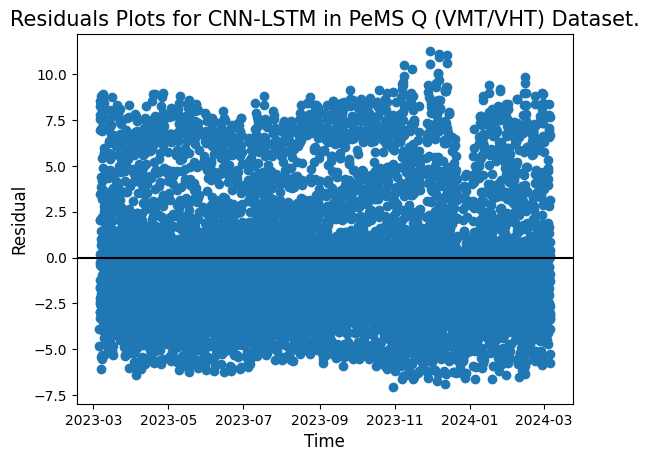

In [ ]:
actual_arr_CNN_LSTM = np.array(results_CNN_LSTM['Actual'])
predicted_arr_CNN_LSTM = np.array(results_CNN_LSTM['Predicted'])
residuals_CNN_LSTM = predicted_arr_CNN_LSTM - actual_arr_CNN_LSTM
plt.scatter(results_CNN_LSTM['Date'], residuals_CNN_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} Dataset.".
          format(feature_field), fontsize=15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the CNN-LSTM model, it can be concluded that the CNN-LSTM model is a good fit.

### Energy Consumption

In [ ]:
'''# estimate model energy for cnn-lstm model
energy_cnn_lstm = keras_spiking.ModelEnergy(cnn_lstm_model)
energy_cnn_lstm.summary(print_warnings=False)'''

'# estimate model energy for cnn-lstm model\nenergy_cnn_lstm = keras_spiking.ModelEnergy(cnn_lstm_model)\nenergy_cnn_lstm.summary(print_warnings=False)'

In [ ]:
'''energy_cnn_lstm.summary(
    columns=(
        "name",
        "energy cpu",
        "energy gpu",
        "synop_energy cpu",
        "synop_energy gpu",
        "neuron_energy cpu",
        "neuron_energy gpu",
    ),
    print_warnings=False,
)'''

'energy_cnn_lstm.summary(\n    columns=(\n        "name",\n        "energy cpu",\n        "energy gpu",\n        "synop_energy cpu",\n        "synop_energy gpu",\n        "neuron_energy cpu",\n        "neuron_energy gpu",\n    ),\n    print_warnings=False,\n)'

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 4.601478576660156e-05 seconds


## CNN-LSTM Model Version 2

This version was taken from https://www.nature.com/articles/s41598-023-41314-y#Sec3



### Create CNN-LSTM Model Version 2.

In [ ]:
cnn_lstm_v2 = Sequential()

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                        input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                        input_shape=(100, X_train.shape[2])))
cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(100, X_train.shape[2])))
#cnn_lstm_v2.add(TimeDistributed(MaxPooling2D(pool_size=2)))
#cnn_lstm_v2.add(TimeDistributed(Flatten()))


#cnn_lstm_v2.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_v2.add(Dropout(0.5))

#cnn_lstm_v2.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=False))
#cnn_lstm_v2.add(Dropout(0.1))

cnn_lstm_v2.add(Dense(1))
cnn_lstm_v2.compile(optimizer='adam', loss='mse')
#cnn_lstm_v2.build(input_shape=(batch_size, seq_len, X_train.shape[1], X_train.shape[2], 1)) # Replace None with your batch size if known

cnn_lstm_v2.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_7 (Conv1D)               │ (None, 99, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 49, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_8 (Conv1D)               │ (None, 48, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 48, 32)         │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,849 (73.63 KB)

 Trainable params: 18,849 (73.63 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model V2.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - loss: 0.3502
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0783
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0751
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0597
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0547
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0534
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - loss: 0.0509
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0501
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0499
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.0481
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.0480
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step - loss: 0.0467
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.0455
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0451
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0450
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

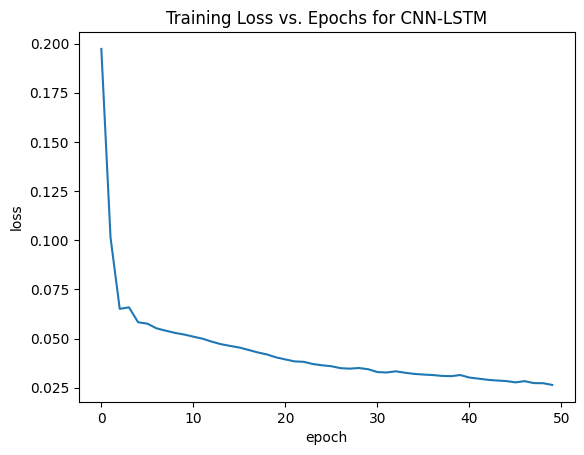

In [ ]:
cnn_lstm_v2.compile(optimizer="adam",loss=loss)
cnn_lstm_v2_epochs = cnn_lstm_v2.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V2 model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v2 = cnn_lstm_v2.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v2 = cnn_lstm_v2.predict(X_test)
cnn_lstm_v2_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v2)
print("MAE of CNN-LSTM model = ",cnn_lstm_v2_mae)
cnn_lstm_v2_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v2) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v2_rmse)
cnn_lstm_v2_r2_score = r2_score(y_test, cnn_lstm_pred_test_v2)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v2_r2_score)
cnn_lstm_v2_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v2)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v2_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of CNN-LSTM model =  0.09876077865014439
RMSE of CNN-LSTM model =  0.1366322362302107
R^2 Score of CNN-LSTM model =  0.5385875218080981
MAPE Score of CNN-LSTM model = 21.910326480142004 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v2 = scaler.inverse_transform(cnn_lstm_pred_train_v2)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v2 = scaler.inverse_transform(cnn_lstm_pred_test_v2)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v2 = cnn_lstm_pred_inv_train_v2.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v2 = cnn_lstm_pred_inv_test_v2.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_CNN_LSTM_train_v2 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v2})
results_CNN_LSTM_train_v2

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.638554
1,2023-03-06 01:00:00,66.153566,66.223404
2,2023-03-06 02:00:00,66.090926,67.527527
3,2023-03-06 03:00:00,65.942371,67.591301
4,2023-03-06 04:00:00,66.077982,66.629181
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,62.588348
7032,2023-12-24 01:00:00,67.723487,63.285049
7033,2023-12-24 02:00:00,67.931737,63.724525
7034,2023-12-24 03:00:00,68.041604,64.772957


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v2 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v2})
results_CNN_LSTM_test_v2

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,65.464165
1,2023-12-25 02:00:00,67.699903,65.481720
2,2023-12-25 03:00:00,66.963961,65.376572
3,2023-12-25 04:00:00,67.132987,64.962639
4,2023-12-25 05:00:00,67.516792,64.233482
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,64.133499
1735,2024-03-06 08:00:00,53.606866,61.098248
1736,2024-03-06 09:00:00,56.729354,58.710121
1737,2024-03-06 10:00:00,60.111626,57.822910


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V2 Model.

#### Only Testing Data

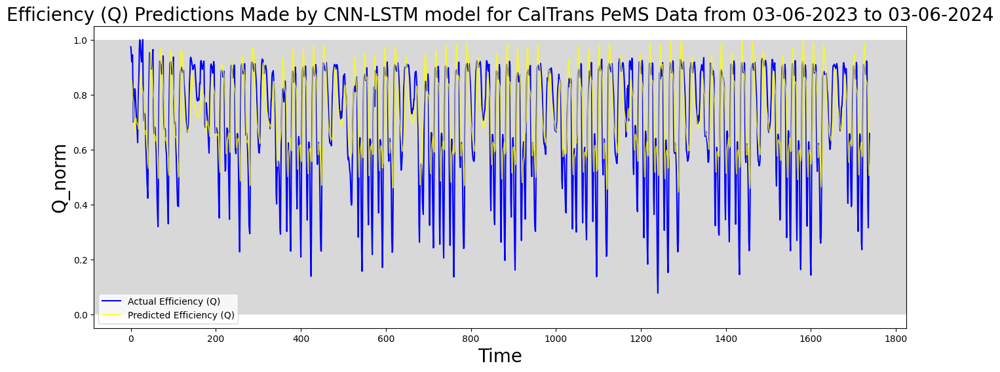

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v2, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Combined.

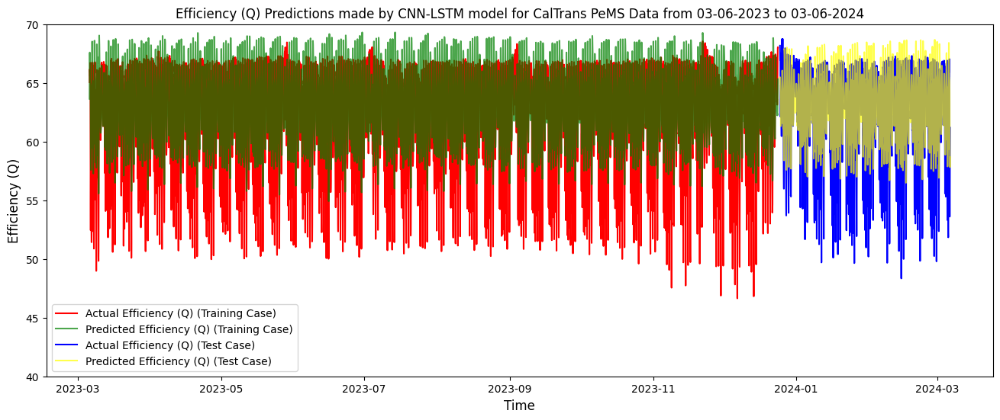

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v2['Date'], results_CNN_LSTM_train_v2['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v2['Date'],
         results_CNN_LSTM_train_v2['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v2.

In [ ]:
results_CNN_LSTM_v2 = [results_CNN_LSTM_train_v2, results_CNN_LSTM_test_v2]
results_CNN_LSTM_v2 = pd.concat(results_CNN_LSTM_v2)
display(results_CNN_LSTM_v2)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,63.638554
1,2023-03-06 01:00:00,66.153566,66.223404
2,2023-03-06 02:00:00,66.090926,67.527527
3,2023-03-06 03:00:00,65.942371,67.591301
4,2023-03-06 04:00:00,66.077982,66.629181
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,64.133499
1735,2024-03-06 08:00:00,53.606866,61.098248
1736,2024-03-06 09:00:00,56.729354,58.710121
1737,2024-03-06 10:00:00,60.111626,57.822910


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v2.

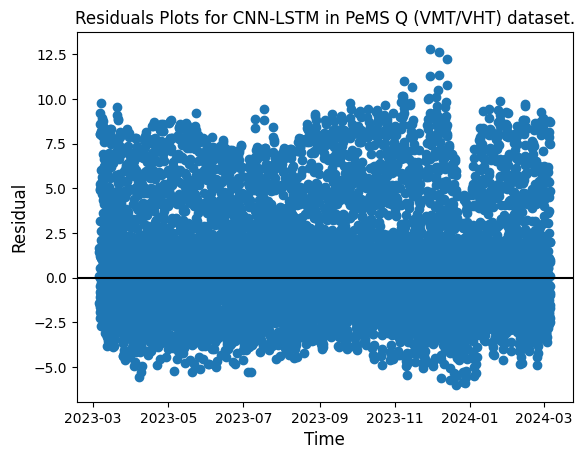

In [ ]:
actual_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Actual'])
predicted_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Predicted'])
residuals_CNN_LSTM_v2 = predicted_arr_CNN_LSTM_v2 - actual_arr_CNN_LSTM_v2
plt.scatter(results_CNN_LSTM_v2['Date'], residuals_CNN_LSTM_v2)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

## CNN-LSTM v3 Implementation
This implementation was taken from https://github.com/Pradnya1208/Time-series-forecasting-using-Deep-Learning/blob/main/deep_learning_for_time_series_forecasting.ipynb

### Creating CNN-LSTM model Version 3.

In [ ]:
# For this implementation, this will require a reshaping of the input shape.
# The input shape will be  [samples, subsequences = 2, timesteps = seq_len,
# features = 1].
X_train_v3 = X_train.reshape(X_train.shape[0], 1, seq_len, X_train.shape[2])
X_test_v3 = X_test.reshape(X_test.shape[0], 1, seq_len, X_test.shape[2])

In [ ]:
cnn_lstm_v3 = Sequential()

# Reshape the input to have 3 dimensions within the TimeDistributed layer
cnn_lstm_v3.add(TimeDistributed(Conv1D(filters=64, kernel_size=1,
                                       activation='relu',
                                       input_shape=(None,
                                                    X_train_v3.shape[2],
                                                    X_train_v3.shape[3]))))
cnn_lstm_v3.add(TimeDistributed(MaxPooling1D(pool_size=2)))
cnn_lstm_v3.add(TimeDistributed(Flatten()))
cnn_lstm_v3.add(LSTM(50, activation='relu'))
cnn_lstm_v3.add(Dense(1))
cnn_lstm_v3.compile(loss='mse', optimizer='adam')
#cnn_lstm_v3.build(input_shape=(None,X_train_v3.shape[2], X_train_v3.shape[3]))
#cnn_lstm_v3.summary()

### Train CNN-LSTM Model V3.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 0.3887
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0805
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0829
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0565
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0558
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.0471
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0432
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0406
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0378
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0355
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0332
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0310
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0290
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0275
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0256
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

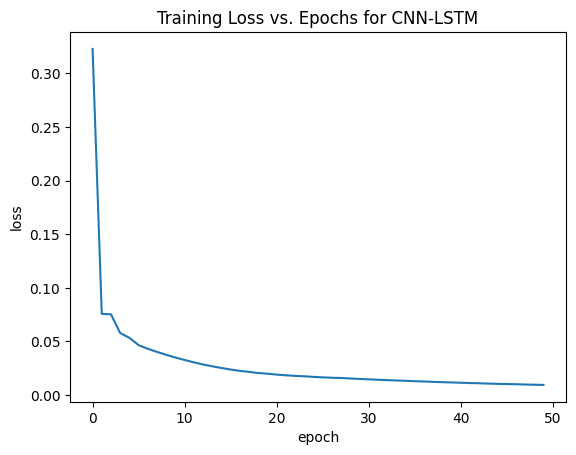

In [ ]:
cnn_lstm_v3.compile(optimizer="adam",loss=loss)
cnn_lstm_v3_epochs = cnn_lstm_v3.fit(X_train_v3, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_v3_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V3 model using MAE, RMSE, and R^2.

In [ ]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v3 = cnn_lstm_v3.predict(X_train_v3)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v3 = cnn_lstm_v3.predict(X_test_v3)
cnn_lstm_v3_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v3)
print("MAE of CNN-LSTM model = ",cnn_lstm_v3_mae)
cnn_lstm_v3_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v3) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v3_rmse)
cnn_lstm_v3_r2_score = r2_score(y_test, cnn_lstm_pred_test_v3)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v3_r2_score)
cnn_lstm_v3_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v3)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v3_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-LSTM model =  0.07076390021449078
RMSE of CNN-LSTM model =  0.09353409454536034
R^2 Score of CNN-LSTM model =  0.7837665511493672
MAPE Score of CNN-LSTM model = 14.354346084249048 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v3 = scaler.inverse_transform(cnn_lstm_pred_train_v3)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v3 = scaler.inverse_transform(cnn_lstm_pred_test_v3)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v3 = cnn_lstm_pred_inv_train_v3.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v3 = cnn_lstm_pred_inv_test_v3.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_CNN_LSTM_train_v3 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v3})
results_CNN_LSTM_train_v3

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.952370
1,2023-03-06 01:00:00,66.153566,66.401344
2,2023-03-06 02:00:00,66.090926,65.935944
3,2023-03-06 03:00:00,65.942371,64.083206
4,2023-03-06 04:00:00,66.077982,63.887188
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,63.952148
7032,2023-12-24 01:00:00,67.723487,64.461288
7033,2023-12-24 02:00:00,67.931737,66.786057
7034,2023-12-24 03:00:00,68.041604,67.290306


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v3 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v3})
results_CNN_LSTM_test_v3

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,67.498947
1,2023-12-25 02:00:00,67.699903,67.568520
2,2023-12-25 03:00:00,66.963961,67.294189
3,2023-12-25 04:00:00,67.132987,66.903481
4,2023-12-25 05:00:00,67.516792,65.946983
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.075829
1735,2024-03-06 08:00:00,53.606866,57.121330
1736,2024-03-06 09:00:00,56.729354,55.182220
1737,2024-03-06 10:00:00,60.111626,56.851158


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V3 Model.

#### Only Testing Data

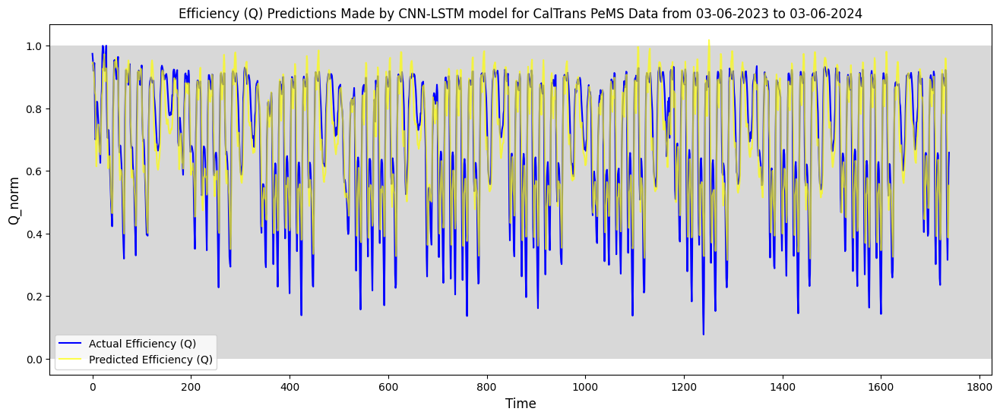

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v3, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

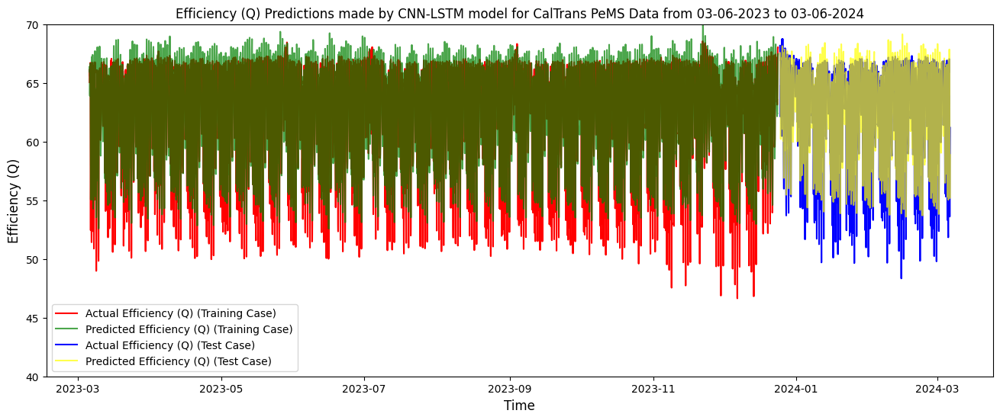

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v3['Date'], results_CNN_LSTM_train_v3['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v3['Date'],
         results_CNN_LSTM_train_v3['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'], results_CNN_LSTM_test_v3['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'],
         results_CNN_LSTM_test_v3['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}"\
          .format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v3.

In [ ]:
results_CNN_LSTM_v3 = [results_CNN_LSTM_train_v3, results_CNN_LSTM_test_v3]
results_CNN_LSTM_v3 = pd.concat(results_CNN_LSTM_v3)
display(results_CNN_LSTM_v3)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,65.952370
1,2023-03-06 01:00:00,66.153566,66.401344
2,2023-03-06 02:00:00,66.090926,65.935944
3,2023-03-06 03:00:00,65.942371,64.083206
4,2023-03-06 04:00:00,66.077982,63.887188
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.075829
1735,2024-03-06 08:00:00,53.606866,57.121330
1736,2024-03-06 09:00:00,56.729354,55.182220
1737,2024-03-06 10:00:00,60.111626,56.851158


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v3.

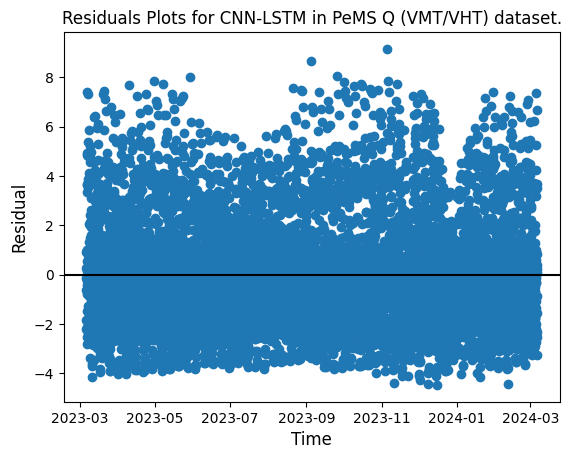

In [ ]:
actual_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Actual'])
predicted_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Predicted'])
residuals_CNN_LSTM_v3 = predicted_arr_CNN_LSTM_v3 - actual_arr_CNN_LSTM_v3
plt.scatter(results_CNN_LSTM_v3['Date'], residuals_CNN_LSTM_v3)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

## LSTM-CNN implementation

### Create and Train LSTM-CNN Model

This implementation was taken from Aditi, & Nagda, Mayank & Eswaran, Poovammal. (2019). Image
 Classification using a Hybrid LSTM-CNN Deep Neural Network. In
ternational Journal of Engineering and Advanced Technology. 8. 1342 1348. 10.35940/ijeat.F8602.088619.

In [ ]:
lstm_cnn_model = Sequential()
lstm_cnn_model.add(LSTM(32, activation="tanh",return_sequences=True,
                        input_shape=(seq_len, X_train.shape[2])))
lstm_cnn_model.add(Dropout(0.5))
lstm_cnn_model.add(Conv1D(filters=32, kernel_size=2, activation='relu'))
lstm_cnn_model.add(MaxPooling1D(pool_size=2))
# Flatten the output before the Dense layer to ensure a single output value
lstm_cnn_model.add(Flatten()) # This line is added
lstm_cnn_model.add(Dense(1))
lstm_cnn_model.compile(optimizer='adam', loss='mse')
lstm_cnn_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                   │ (None, 20, 32)         │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_10 (Conv1D)              │ (None, 19, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_9 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,721 (26.25 KB)

 Trainable params: 6,721 (26.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM-CNN Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - loss: 0.1662
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 0.0934 
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0705 
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 0.0696 
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0655
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0625
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0601
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0587
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0577
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0554
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - loss: 0.0538
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0520
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0499
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - loss: 0.0489
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.0467
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━

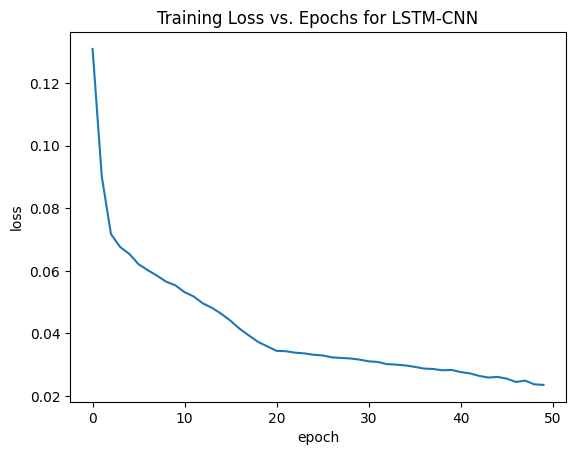

In [ ]:
lstm_cnn_model.compile(optimizer="adam",loss=loss)
lstm_cnn_model_epochs = lstm_cnn_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(lstm_cnn_model_epochs, "LSTM-CNN")

### Evaluate LSTM-CNN model using MAE, RMSE, and MAPE.

In [ ]:
print("LSTM-CNN Predictions for Training Set")
lstm_cnn_pred_train = lstm_cnn_model.predict(X_train)
print("LSTM-CNN Predictions for Testing Set")
lstm_cnn_pred_test = lstm_cnn_model.predict(X_test)
lstm_cnn_mae = mean_absolute_error(y_test,lstm_cnn_pred_test)
print("MAE of LSTM-CNN model = ",lstm_cnn_mae)
lstm_cnn_rmse =  mean_squared_error(y_test,lstm_cnn_pred_test) ** 0.5
print("RMSE of LSTM-CNN model = ",lstm_cnn_rmse)
lstm_cnn_r2_score = r2_score(y_test, lstm_cnn_pred_test)
print("R^2 Score of LSTM-CNN model = ",lstm_cnn_r2_score)
lstm_cnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         lstm_cnn_pred_test)
print("MAPE Score of LSTM-CNN model = {0} %".format(lstm_cnn_mape_score))

LSTM-CNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
LSTM-CNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of LSTM-CNN model =  0.18396865796617193
RMSE of LSTM-CNN model =  0.20612855200395155
R^2 Score of LSTM-CNN model =  -0.05016922523825751
MAPE Score of LSTM-CNN model = 27.391591654595466 %


### Reverse Transform Scaler to Convert to Real Values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_cnn_pred_inv_train = scaler.inverse_transform(lstm_cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_cnn_pred_inv_test = scaler.inverse_transform(lstm_cnn_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
lstm_cnn_pred_inv_train = lstm_cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_cnn_pred_inv_test = lstm_cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [ ]:
results_LSTM_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': lstm_cnn_pred_inv_train})
results_LSTM_CNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,59.811050
1,2023-03-06 01:00:00,66.153566,61.363556
2,2023-03-06 02:00:00,66.090926,62.241245
3,2023-03-06 03:00:00,65.942371,62.171627
4,2023-03-06 04:00:00,66.077982,61.468880
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,58.465767
7032,2023-12-24 01:00:00,67.723487,58.479111
7033,2023-12-24 02:00:00,67.931737,58.797165
7034,2023-12-24 03:00:00,68.041604,59.450623


In [ ]:
# Now let's see our actual y and predicted y values as dataframes
results_LSTM_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': lstm_cnn_pred_inv_test})
results_LSTM_CNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,61.110371
1,2023-12-25 02:00:00,67.699903,61.678654
2,2023-12-25 03:00:00,66.963961,62.044247
3,2023-12-25 04:00:00,67.132987,62.177917
4,2023-12-25 05:00:00,67.516792,61.987404
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.836643
1735,2024-03-06 08:00:00,53.606866,57.885338
1736,2024-03-06 09:00:00,56.729354,56.925854
1737,2024-03-06 10:00:00,60.111626,56.272911


### Plotting Predictions for VHT/VMT/Q made by LSTM-CNN Model.

#### Only Testing Data.

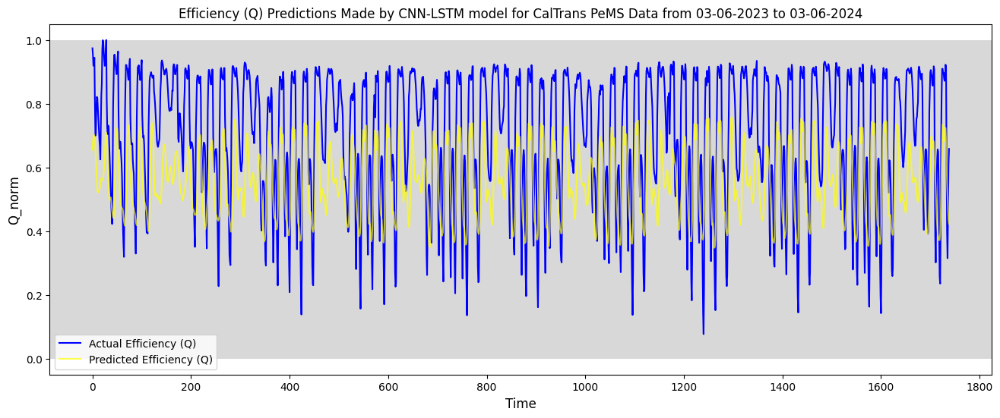

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_cnn_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

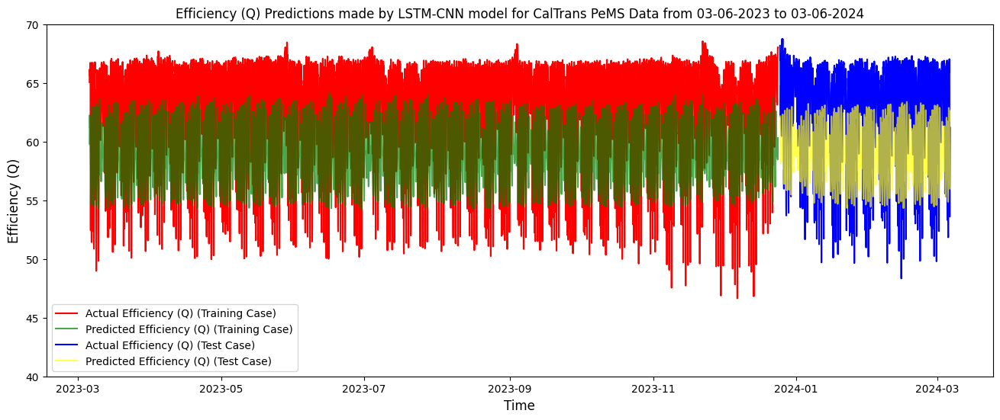

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_CNN_train['Date'], results_LSTM_CNN_train['Actual'], color='red',
         label=f'Actual {feature} (Training Case)')
plt.plot(results_LSTM_CNN_train['Date'],  results_LSTM_CNN_train['Predicted'], alpha=0.7,
         color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Actual'], color='blue',
         label=f'Actual {feature} (Test Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM-CNN model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM-CNN.

In [ ]:
results_LSTM_CNN = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_LSTM_CNN = pd.concat(results_LSTM_CNN)
display(results_LSTM_CNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,60.233833
1,2023-03-06 01:00:00,66.153566,62.268013
2,2023-03-06 02:00:00,66.090926,63.669685
3,2023-03-06 03:00:00,65.942371,66.154305
4,2023-03-06 04:00:00,66.077982,65.834808
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,63.082691
1735,2024-03-06 08:00:00,53.606866,60.300682
1736,2024-03-06 09:00:00,56.729354,57.594490
1737,2024-03-06 10:00:00,60.111626,56.837402


### Plotting Residuals for Actual and Predicted Results for LSTM-CNN.

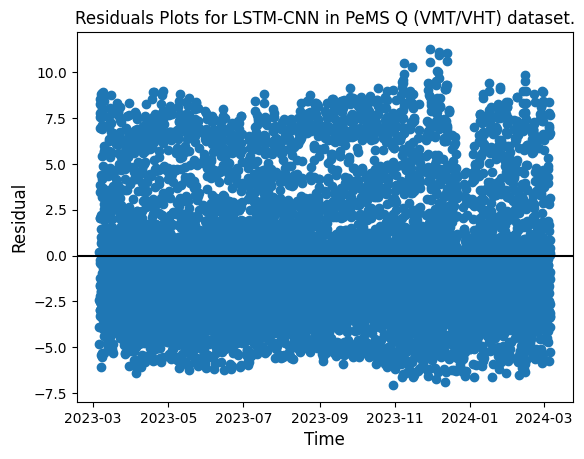

In [ ]:
actual_arr_LSTM_CNN = np.array(results_LSTM_CNN['Actual'])
predicted_arr_LSTM_CNN = np.array(results_LSTM_CNN['Predicted'])
residuals_LSTM_CNN = predicted_arr_LSTM_CNN - actual_arr_LSTM_CNN
plt.scatter(results_LSTM_CNN['Date'], residuals_LSTM_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for LSTM-CNN in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

## CNN-GRU model

### Create CNN-GRU Model.

In [ ]:
cnn_gru_model = Sequential()

cnn_gru_model.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

cnn_gru_model.add(Conv1D(filters=64, kernel_size=2, activation='tanh',
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(Conv1D(filters=60, kernel_size=2, activation='tanh',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(GRU(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_gru_model.add(Dropout(0.5))

#cnn_gru_model.add(GRU(64,activation="tanh",return_sequences=True))
#cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(GRU(64,activation="tanh",return_sequences=False))
cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(Dense(1))
cnn_gru_model.compile(optimizer='adam', loss='mse')
cnn_gru_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_11 (Conv1D)              │ (None, 19, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_12 (Conv1D)              │ (None, 8, 64)          │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_11 (MaxPooling1D) │ (None, 4, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_2 (GRU)                     │ (None, 64)             │        24,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,281 (114.38 KB)

 Trainable params: 29,281 (114.38 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-GRU Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.4276
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.1676
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.1212
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0954
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0905
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0870
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - loss: 0.0837
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - loss: 0.0787
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0735
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - loss: 0.0705
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 0.0678
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - loss: 0.0667
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0648
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0627
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0609
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

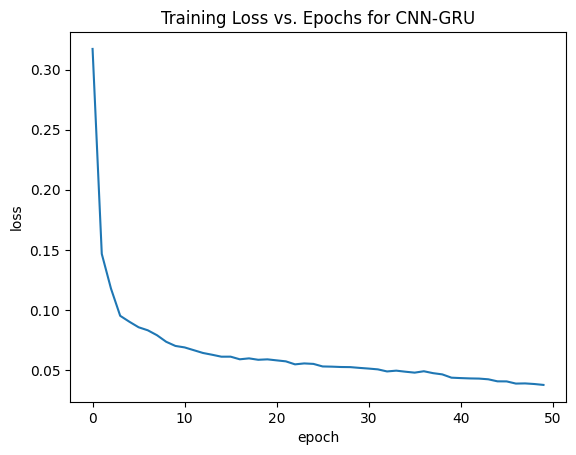

In [ ]:
cnn_gru_model.compile(optimizer="adam",loss=loss)
cnn_gru_epochs = cnn_gru_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_gru_epochs, "CNN-GRU")

### Evaluate CNN-GRU model using MAE, RMSE, and R^2.

In [ ]:
cnn_gru_pred_train = cnn_gru_model.predict(X_train)
print("RNN Predictions for Testing Set")
cnn_gru_pred_test = cnn_gru_model.predict(X_test)
cnn_gru_mae = mean_absolute_error(y_test,cnn_gru_pred_test)
print("MAE of CNN-GRU model = ",cnn_gru_mae)
cnn_gru_rmse =  mean_squared_error(y_test,cnn_gru_pred_test) ** 0.5
print("RMSE of CNN-GRU model = ",cnn_gru_rmse)
cnn_gru_r2_score = r2_score(y_test, cnn_gru_pred_test)
print("R^2 Score of CNN-GRU model = ",cnn_gru_r2_score)
cnn_gru_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_gru_pred_test)
print("MAPE Score of CNN-GRU model = {0} %".format(cnn_gru_mape_score))

220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-GRU model =  0.09267859622344442
RMSE of CNN-GRU model =  0.11970587189958276
R^2 Score of CNN-GRU model =  0.6458282715846797
MAPE Score of CNN-GRU model = 18.89756772520625 %


### Reverse transform scaler to convert to real values.

In [ ]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_gru_pred_inv_train = scaler.inverse_transform(cnn_gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_gru_pred_inv_test = scaler.inverse_transform(cnn_gru_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_gru_pred_inv_train = cnn_gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_gru_pred_inv_test = cnn_gru_pred_inv_test.flatten()

### Showing Actual and Predicted y values as Dataframes.

In [ ]:
results_CNN_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                                'Actual': y_train_inverse,
                                'Predicted': cnn_gru_pred_inv_train})
results_CNN_GRU_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,62.061832
1,2023-03-06 01:00:00,66.153566,64.397491
2,2023-03-06 02:00:00,66.090926,64.629601
3,2023-03-06 03:00:00,65.942371,66.526093
4,2023-03-06 04:00:00,66.077982,65.928841
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,62.100060
7032,2023-12-24 01:00:00,67.723487,62.889030
7033,2023-12-24 02:00:00,67.931737,63.290371
7034,2023-12-24 03:00:00,68.041604,64.664505


In [ ]:
results_CNN_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                                'Actual': y_test_inverse,
                                'Predicted': cnn_gru_pred_inv_test})
results_CNN_GRU_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,65.314911
1,2023-12-25 02:00:00,67.699903,65.511253
2,2023-12-25 03:00:00,66.963961,64.695572
3,2023-12-25 04:00:00,67.132987,64.381706
4,2023-12-25 05:00:00,67.516792,64.077202
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.457745
1735,2024-03-06 08:00:00,53.606866,59.068016
1736,2024-03-06 09:00:00,56.729354,56.957310
1737,2024-03-06 10:00:00,60.111626,57.652603


### Plotting Predictions for VMT/VHT/Q made by CNN-GRU Model.

#### Only Testing Data

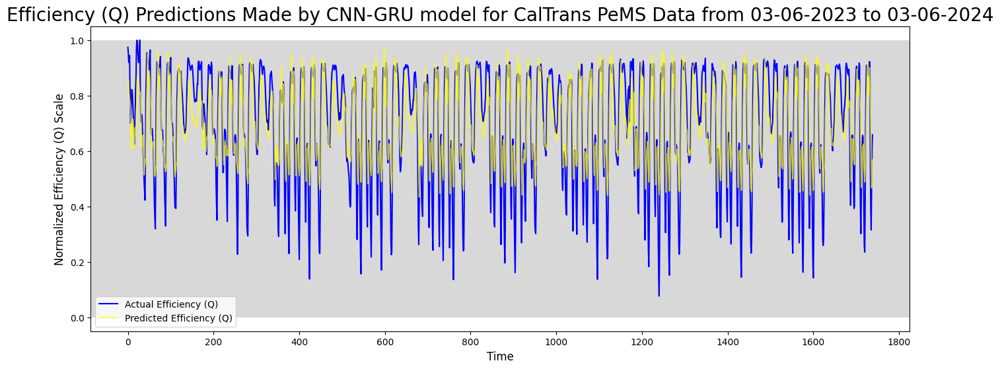

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

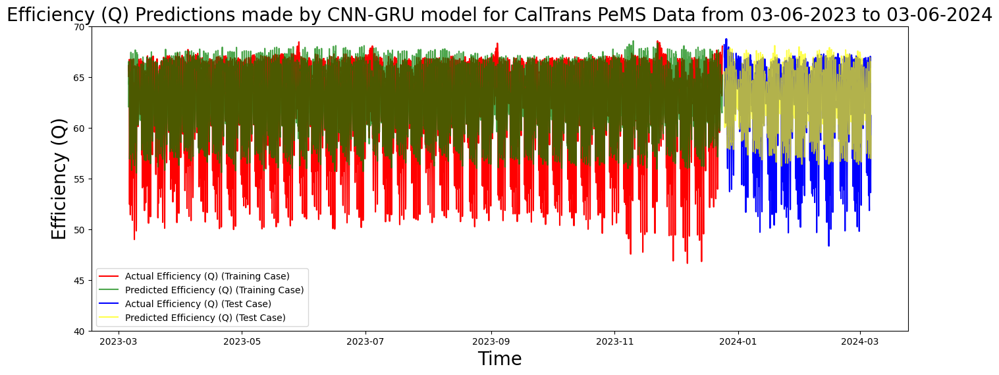

In [ ]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Actual'],
         color='red', label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Predicted'],
         alpha=0.7, color='green',
         label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-GRU.

In [ ]:
results_CNN_GRU = [results_CNN_GRU_train, results_CNN_GRU_test]
results_CNN_GRU = pd.concat(results_CNN_GRU)
display(results_CNN_GRU)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,62.061832
1,2023-03-06 01:00:00,66.153566,64.397491
2,2023-03-06 02:00:00,66.090926,64.629601
3,2023-03-06 03:00:00,65.942371,66.526093
4,2023-03-06 04:00:00,66.077982,65.928841
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.457745
1735,2024-03-06 08:00:00,53.606866,59.068016
1736,2024-03-06 09:00:00,56.729354,56.957310
1737,2024-03-06 10:00:00,60.111626,57.652603


### Plotting Residuals for Actual and Predicted Results for CNN-GRU.

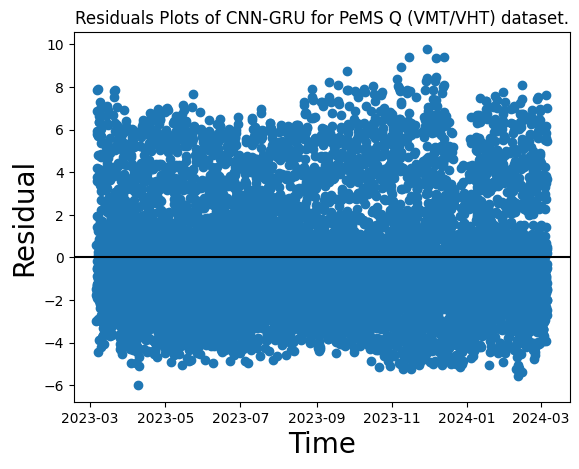

In [ ]:
actual_arr_CNN_GRU = np.array(results_CNN_GRU['Actual'])
predicted_arr_CNN_GRU = np.array(results_CNN_GRU['Predicted'])
residuals_CNN_GRU = predicted_arr_CNN_GRU - actual_arr_CNN_GRU
plt.scatter(results_CNN_GRU['Date'], residuals_CNN_GRU)
plt.title("Residuals Plots of CNN-GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.axhline(y=0, color = 'black')
plt.show()

From the residual plots for the CNN-GRU model, it can be concluded that the CNN-GRU model is a good fit.

### Energy Consumption

In [ ]:
'''# estimate model energy for cnn-gru model
energy_cnn_gru = keras_spiking.ModelEnergy(cnn_gru_model)
energy_cnn_gru.summary(print_warnings=False)'''

'# estimate model energy for cnn-gru model\nenergy_cnn_gru = keras_spiking.ModelEnergy(cnn_gru_model)\nenergy_cnn_gru.summary(print_warnings=False)'

In [ ]:
'''energy_cnn_gru.summary(
    columns=(
        "name",
        "energy cpu",
        "energy gpu",
        "synop_energy cpu",
        "synop_energy gpu",
        "neuron_energy cpu",
        "neuron_energy gpu",
    ),
    print_warnings=False,
)'''

'energy_cnn_gru.summary(\n    columns=(\n        "name",\n        "energy cpu",\n        "energy gpu",\n        "synop_energy cpu",\n        "synop_energy gpu",\n        "neuron_energy cpu",\n        "neuron_energy gpu",\n    ),\n    print_warnings=False,\n)'

In [ ]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 6.0558319091796875e-05 seconds


# Compare Predictions

* For both models, we see that the predicted values are close to the actual values, which means that the models perform well in predicting the sequence.

## Training

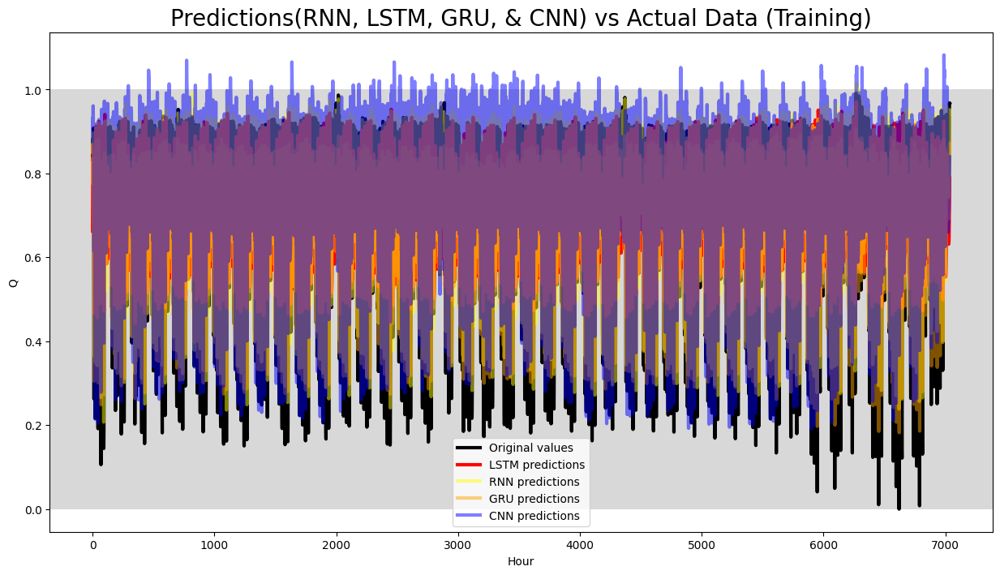

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_train, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_train, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_train, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
plt.plot(cnn_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing

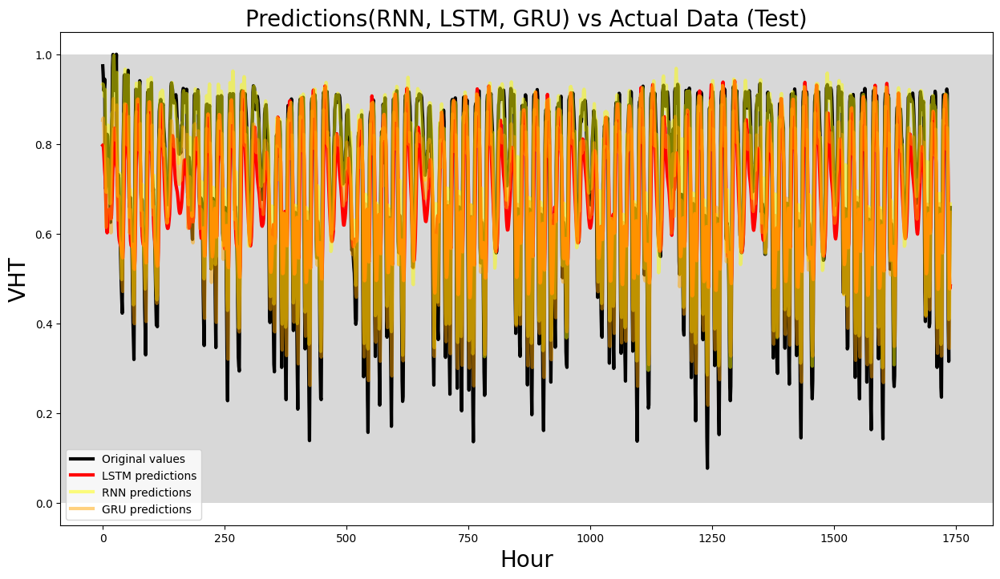

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_test, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_test, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_test, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
#plt.plot(cnn_pred_test, alpha=0.5, c="blue", linewidth=3,
#         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour', fontsize = 20)
#plt.ylabel('Q', fontsize = 20)
plt.ylabel('VHT', fontsize = 20)
#plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Test)",
#          fontsize=20)
plt.title("Predictions(RNN, LSTM, GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

## Training (Hybrid Models)

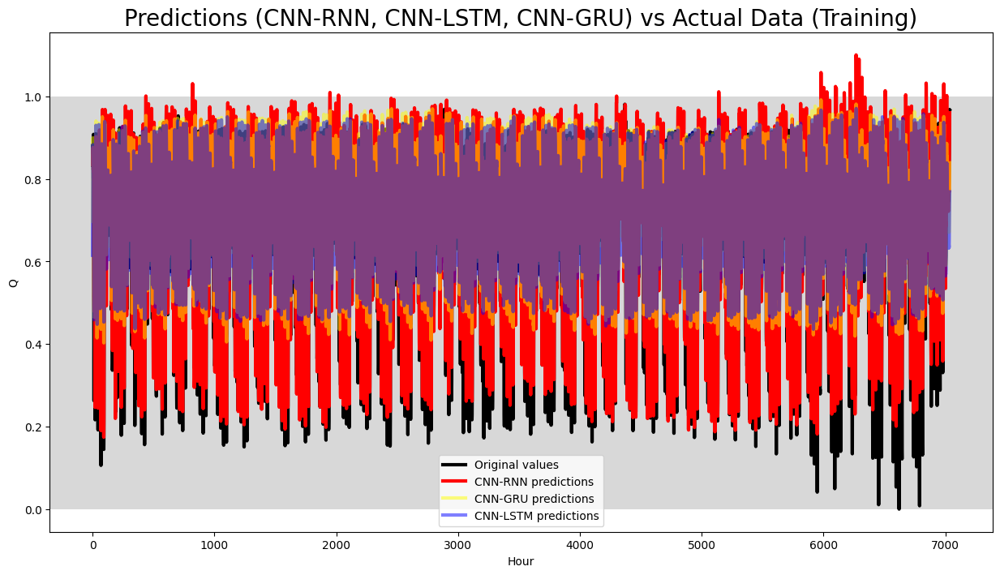

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_train, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_train, alpha=0.5, c="yellow", linewidth=3,
         label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions (CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing (Hybrid Models)

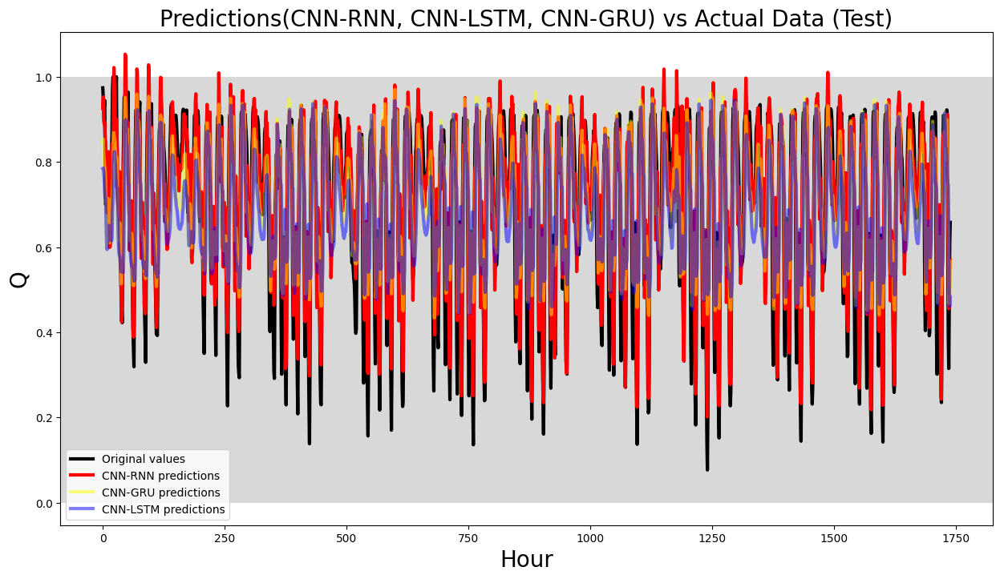

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_test, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_test, alpha=0.5, c="yellow", linewidth=3, label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_test, alpha=0.5, c="blue", linewidth=3, label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour',fontsize=20)
plt.ylabel('Q', fontsize=20)
plt.title("Predictions(CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

# Forecasting Future Data for all models

## Essential Functions.

In [ ]:
# this section for unknown future.
future=20
#future=seq_len
forecast_RNN = []
forecast_LSTM = []
forecast_GRU = []
forecast_CNN = []
forecast_CNN_RNN = []
forecast_CNN_LSTM = []
forecast_CNN_GRU = []
Xin = X_test[:,:,:]
Xin

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [ ]:
def insert_end(Xin, new_input, timestep):
    for i in range(timestep-1):
        Xin[:,i,:] = Xin[:,i+1,:]
    Xin[:,timestep-1,:] = new_input
    return Xin

def forecast_data(Xin, model_type, forecast, future_num):
    time=[]
    data_pts = 24*future_num
    for j in range(data_pts):
      out = model_type.predict(Xin, batch_size=1000)
      forecast.append(out[j, 0])
      Xin = insert_end(Xin, out[j, 0], future_num)
      time_current = pd.to_datetime(df_norm.index[-1])+timedelta(hours=j)
      if (j % 100 == 0):
        print("j = {0}".format(j))
        print("forecast: {0}".format(forecast))
        print("time_current: ",  time_current)
      time.append(time_current)


    forcasted_output=np.asanyarray(forecast)
    forcasted_output=forcasted_output.reshape(-1,1)
    forcasted_output = scaler.inverse_transform(forcasted_output)
    forcasted_output = pd.DataFrame(forcasted_output)
    date = pd.DataFrame(time)
    forecast_result = pd.concat([date, forcasted_output],axis=1)
    forecast_result.columns = "Date","Forecasted"

    return forecast_result

In [ ]:
# Plotting Predictions for VMT/VHT/Q for each model.
def plot_forecast(forecast_set, model_name, mode, min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title('{0} Forecast for {1} using {2}'.
              format(feature_field, mode, model_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    #plt.ylabel(feature_field, fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.rc('xtick', labelsize=15)
    plt.rc('ytick', labelsize=15)
    plt.legend()
    plt.show()

In [ ]:
# Plotting Predictions for VMT/VHT/Q for Training, Testing, and Future Data.
def plot_with_forecast(train_set, test_set, forecast_set, model_name, mode,
                       min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(train_set['Date'], train_set['Actual'], color='red',
             label='Actual {0} (Training Case)'.format(feature))
    plt.plot(train_set['Date'], train_set['Predicted'], alpha=0.7,
             color='green',
             label='Predicted {0} (Training Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Actual'], color='blue',
            label='Actual {0} (Test Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Predicted'], alpha=0.7, color='yellow',
             label='Predicted {0} (Test Case)'.format(feature))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title("{0} Predictions and Forecasts made by {1} model for {2}".
              format(feature_field, model_name, title_name), fontsize=15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.legend()
    plt.show()

## Forecasting Future Data for RNN.

In [ ]:
forecast_result_rnn = forecast_data(Xin, rnn_model, forecast_RNN, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
j = 0
forecast: [np.float32(0.93329215)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2/2 ━━━━━━━━

In [ ]:
forecast_result_rnn

,Date,Forecasted
0,2024-03-06 11:00:00,67.268654
1,2024-03-06 12:00:00,66.767822
2,2024-03-06 13:00:00,66.729263
3,2024-03-06 14:00:00,66.074890
4,2024-03-06 15:00:00,65.221359
...,...,...
475,2024-03-26 06:00:00,64.848679
476,2024-03-26 07:00:00,64.848648
477,2024-03-26 08:00:00,64.848587
478,2024-03-26 09:00:00,64.848518


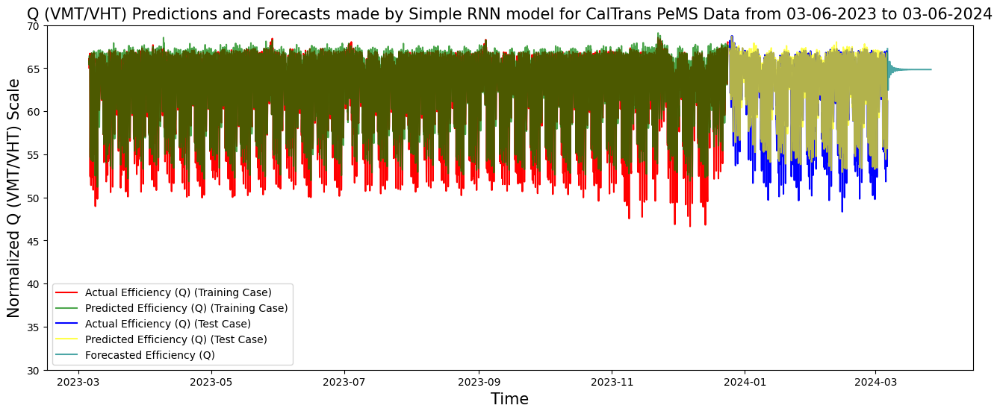

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_RNN_train, results_RNN_test, forecast_result_rnn,
                   'Simple RNN', title_name)

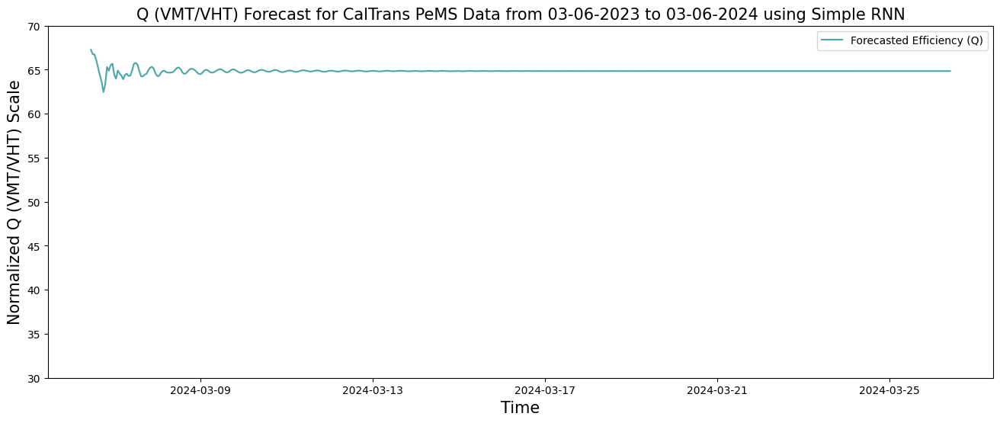

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_rnn, 'Simple RNN', title_name)

## Forecasting Future Data for LSTM.

In [ ]:
forecast_result_lstm = forecast_data(Xin, lstm_model, forecast_LSTM, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
j = 0
forecast: [np.float32(0.70215786)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
2/2 ━━━━━━

In [ ]:
forecast_result_lstm

,Date,Forecasted
0,2024-03-06 11:00:00,62.159775
1,2024-03-06 12:00:00,61.716000
2,2024-03-06 13:00:00,61.215019
3,2024-03-06 14:00:00,60.760986
4,2024-03-06 15:00:00,60.404461
...,...,...
475,2024-03-26 06:00:00,62.017265
476,2024-03-26 07:00:00,62.017265
477,2024-03-26 08:00:00,62.017265
478,2024-03-26 09:00:00,62.017265


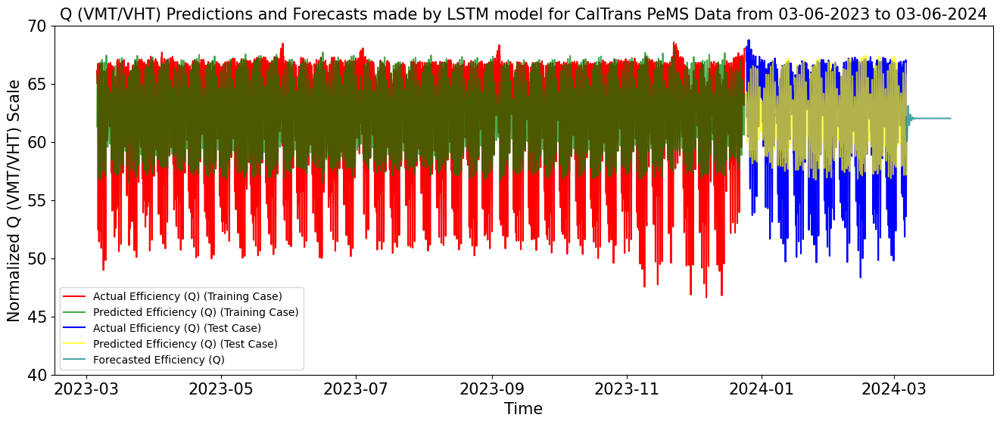

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_LSTM_train, results_LSTM_test, forecast_result_lstm,
                   'LSTM', title_name, min=40, max=70)

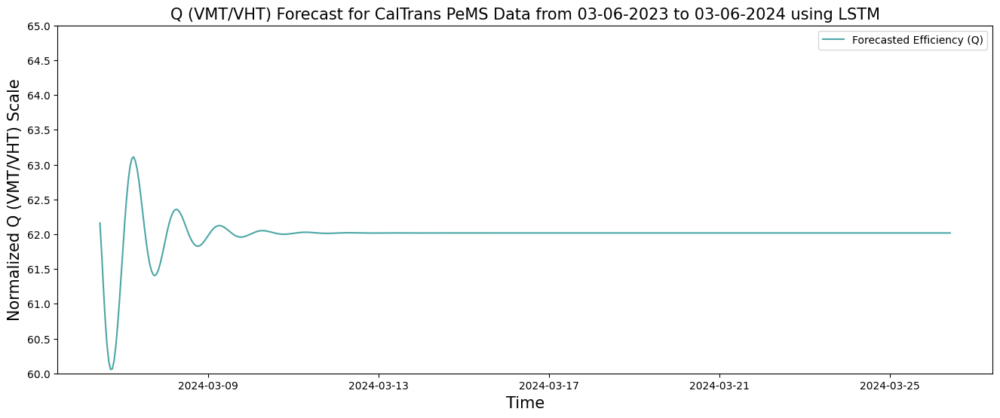

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_lstm, 'LSTM', title_name, min=60, max=65)

## Forecasting Future Data for GRU.

In [ ]:
forecast_result_gru = forecast_data(Xin, gru_model, forecast_GRU, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
j = 0
forecast: [np.float32(0.6689824)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
2/2 ━━━━━━━━

In [ ]:
forecast_result_gru

,Date,Forecasted
0,2024-03-06 11:00:00,61.426479
1,2024-03-06 12:00:00,60.881538
2,2024-03-06 13:00:00,60.436325
3,2024-03-06 14:00:00,60.146786
4,2024-03-06 15:00:00,60.001511
...,...,...
475,2024-03-26 06:00:00,60.392948
476,2024-03-26 07:00:00,60.392948
477,2024-03-26 08:00:00,60.392948
478,2024-03-26 09:00:00,60.392948


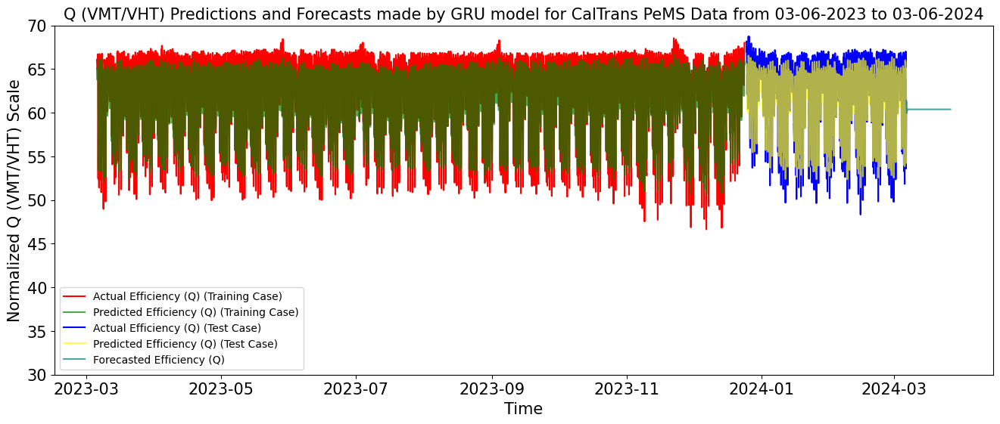

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_GRU_train, results_GRU_test, forecast_result_gru,
                   'GRU', title_name)

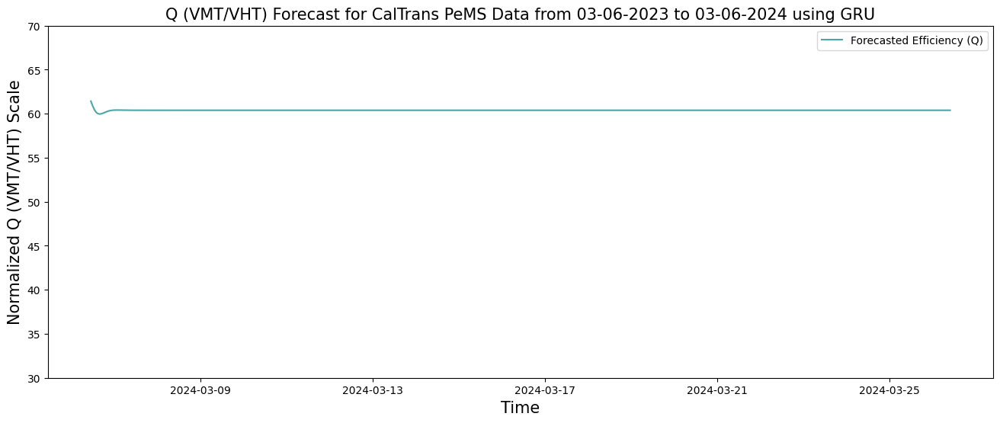

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_gru, 'GRU', title_name)

## Forecasting Future Data for CNN.

In [ ]:
forecast_result_cnn = forecast_data(Xin, cnn_model, forecast_CNN, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
j = 0
forecast: [np.float32(0.8906809)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━

In [ ]:
forecast_result_cnn

,Date,Forecasted
0,2024-03-06 11:00:00,66.326797
1,2024-03-06 12:00:00,66.326797
2,2024-03-06 13:00:00,66.326797
3,2024-03-06 14:00:00,66.326797
4,2024-03-06 15:00:00,66.326797
...,...,...
475,2024-03-26 06:00:00,67.228088
476,2024-03-26 07:00:00,66.569786
477,2024-03-26 08:00:00,65.950668
478,2024-03-26 09:00:00,64.268913


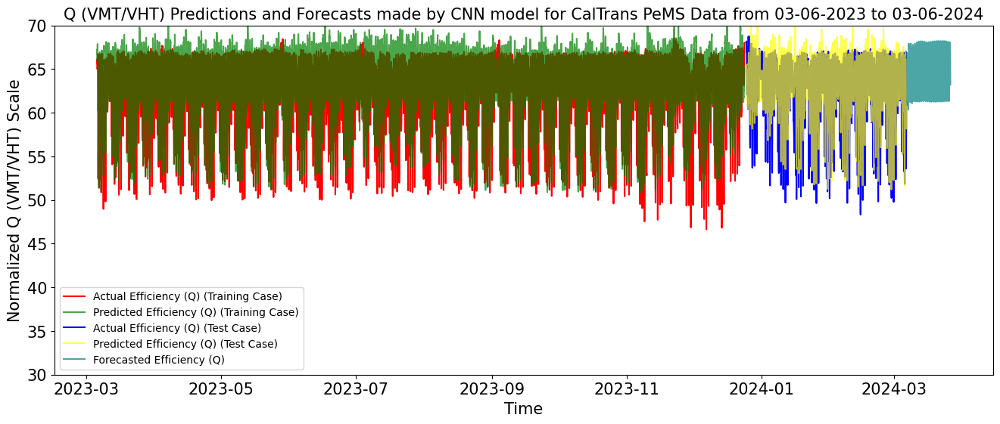

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_CNN_train, results_CNN_test, forecast_result_cnn,
                   'CNN', title_name)

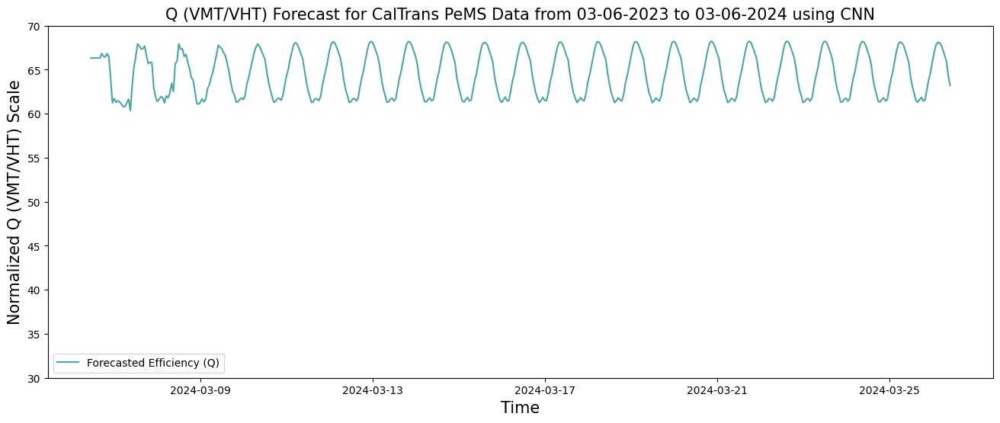

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_cnn, 'CNN', title_name)

## Forecasting Future Data for CNN-RNN.

In [ ]:
forecast_result_cnn_rnn = forecast_data(Xin, cnn_rnn_model, forecast_CNN_RNN, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
j = 0
forecast: [np.float32(0.74867326)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━

In [ ]:
forecast_result_cnn_rnn

,Date,Forecasted
0,2024-03-06 11:00:00,63.187931
1,2024-03-06 12:00:00,62.405170
2,2024-03-06 13:00:00,62.039215
3,2024-03-06 14:00:00,61.785931
4,2024-03-06 15:00:00,61.245979
...,...,...
475,2024-03-26 06:00:00,69.111481
476,2024-03-26 07:00:00,71.537804
477,2024-03-26 08:00:00,59.886547
478,2024-03-26 09:00:00,72.350410


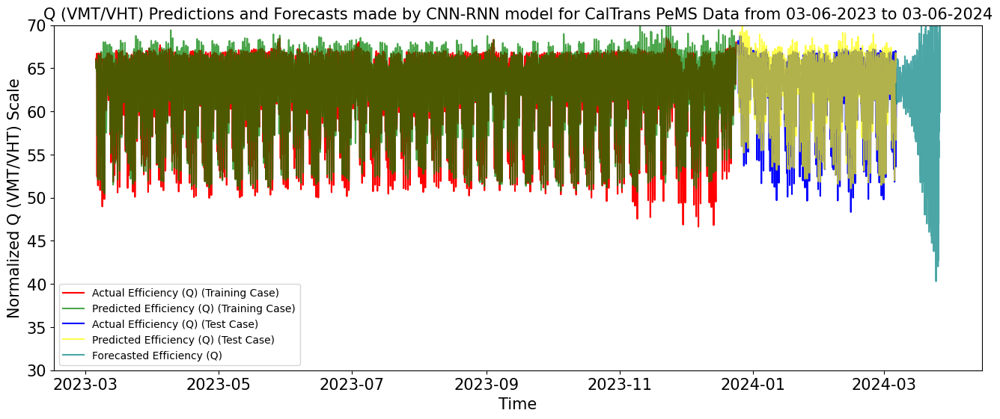

In [ ]:
plot_with_forecast(results_CNN_RNN_train, results_CNN_RNN_test,
                   forecast_result_cnn_rnn, 'CNN-RNN', title_name)

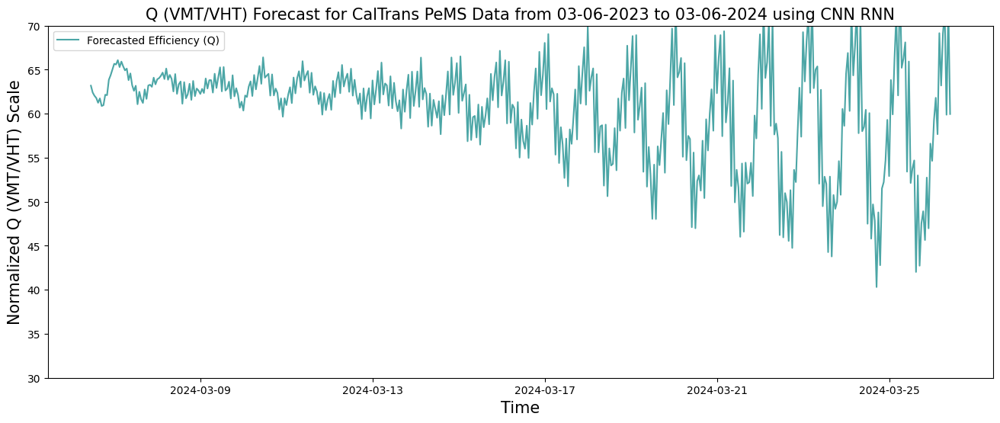

In [ ]:
plot_forecast(forecast_result_cnn_rnn, 'CNN RNN', title_name)

## Forecasting Future Data for CNN-LSTM.

In [ ]:
forecast_result_cnn_lstm = forecast_data(Xin, cnn_lstm_model, forecast_CNN_LSTM, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
j = 0
forecast: [np.float32(0.78244877)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━

In [ ]:
forecast_result_cnn_lstm

,Date,Forecasted
0,2024-03-06 11:00:00,63.934483
1,2024-03-06 12:00:00,60.613472
2,2024-03-06 13:00:00,58.881756
3,2024-03-06 14:00:00,59.456150
4,2024-03-06 15:00:00,57.224049
...,...,...
475,2024-03-26 06:00:00,61.949902
476,2024-03-26 07:00:00,61.949902
477,2024-03-26 08:00:00,61.949902
478,2024-03-26 09:00:00,61.949902


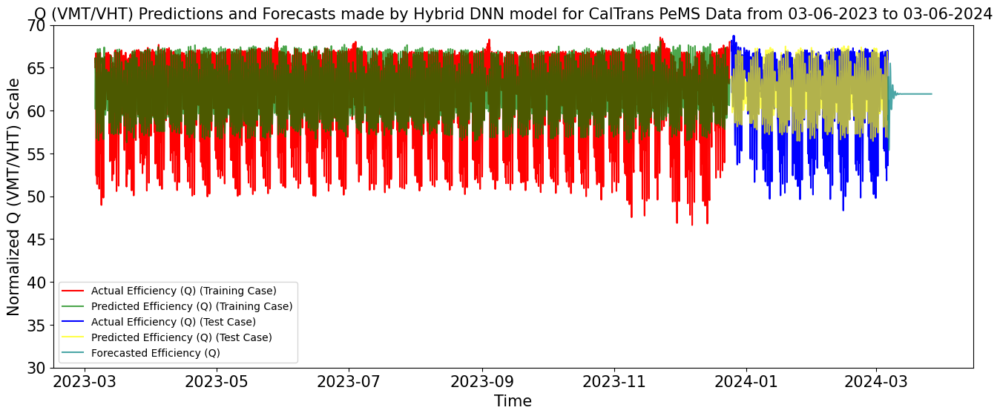

In [ ]:
plot_with_forecast(results_CNN_LSTM_train, results_CNN_LSTM_test,
                   forecast_result_cnn_lstm, 'Hybrid DNN', title_name, min=30,
                   max=70)

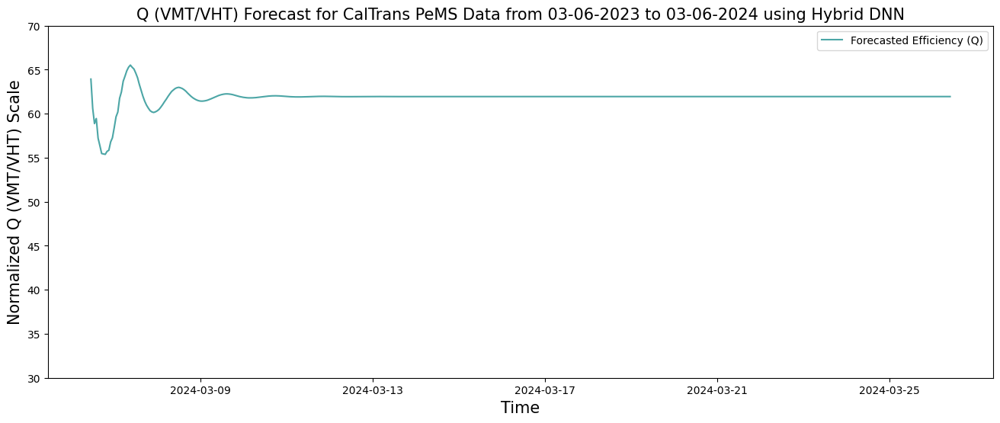

In [ ]:
plot_forecast(forecast_result_cnn_lstm, 'Hybrid DNN', title_name)

## Forecasting Future Data for CNN-GRU.

In [ ]:
forecast_result_cnn_gru = forecast_data(Xin, cnn_gru_model, forecast_CNN_GRU,
                                        future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
j = 0
forecast: [np.float32(0.7032138)]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━

In [ ]:
forecast_result_cnn_gru

,Date,Forecasted
0,2024-03-06 11:00:00,62.183113
1,2024-03-06 12:00:00,62.183109
2,2024-03-06 13:00:00,62.356609
3,2024-03-06 14:00:00,62.390331
4,2024-03-06 15:00:00,62.445591
...,...,...
475,2024-03-26 06:00:00,62.250103
476,2024-03-26 07:00:00,62.250103
477,2024-03-26 08:00:00,62.250103
478,2024-03-26 09:00:00,62.250103


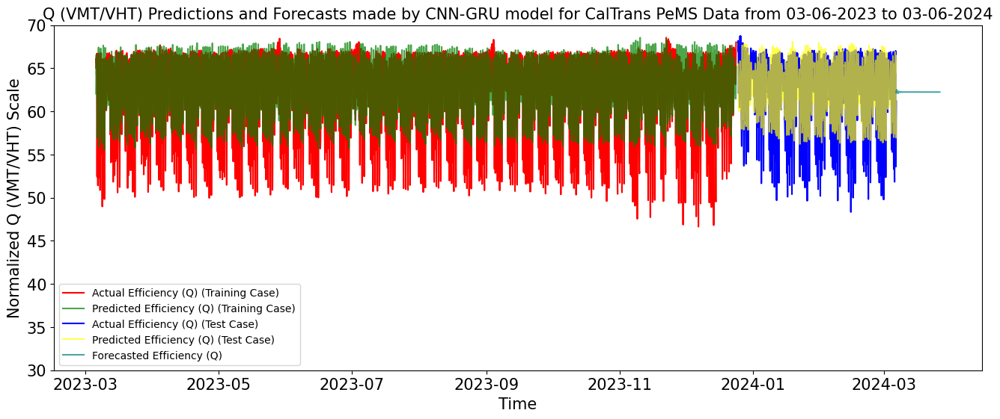

In [ ]:
plot_with_forecast(results_CNN_GRU_train, results_CNN_GRU_test,
                   forecast_result_cnn_gru, 'CNN-GRU', title_name)

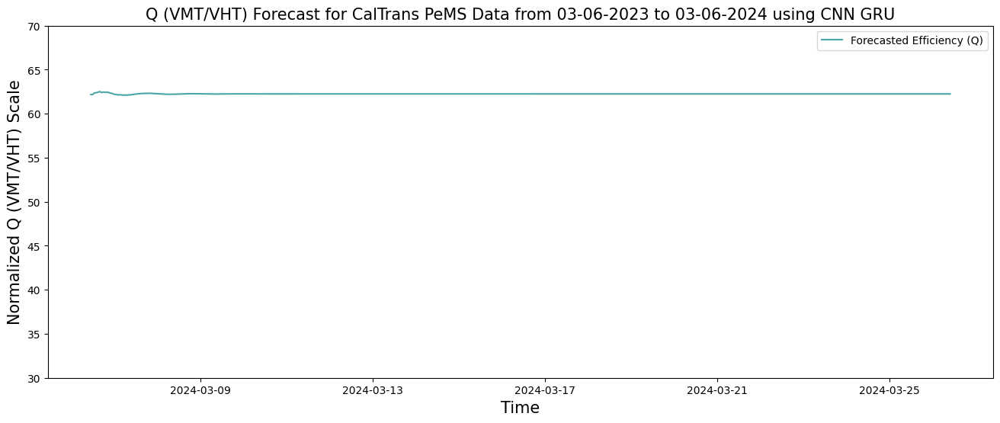

In [ ]:
plot_forecast(forecast_result_cnn_gru, 'CNN GRU', title_name)

# Creating a pickle file for all classifier models.

## Mount model_pkl folder.

In [ ]:
os.chdir('/content/drive/My Drive/VT/Research/TSC_datasets/model_pkl')

## Send model to pkl file.

In [ ]:
# Creating a pickle file for all classifier models
filename_cnn_rnn = 'TSC_apdatasets-prediction-cnn-rnn-model_vehicle_hours.pkl'
pickle.dump(cnn_rnn_model, open(filename_cnn_rnn, 'wb'))

filename_cnn_lstm = 'TSC_apdatasets-prediction-cnn-lstm-model_vehicle_hours.pkl'
pickle.dump(cnn_lstm_model, open(filename_cnn_lstm, 'wb'))

filename_cnn_gru = 'TSC_apdatasets-prediction-cnn-gru-model_vehicle_hours.pkl'
pickle.dump(cnn_gru_model, open(filename_cnn_gru, 'wb'))

filename_rnn = 'TSC_apdatasets-prediction-rnn-model_vehicle_hours.pkl'
pickle.dump(rnn_model, open(filename_rnn, 'wb'))

filename_lstm = 'TSC_apdatasets-prediction-lstm-model_vehicle_hours.pkl'
pickle.dump(lstm_model, open(filename_lstm, 'wb'))

filename_cnn = 'TSC_apdatasets-prediction-cnn-model_vehicle_hours.pkl'
pickle.dump(cnn_model, open(filename_cnn, 'wb'))

In [ ]:
!pip install nbconvert
!apt-get-qq install texlive texlive-xetex texlive-latex-extra pandoc
#!pip install--quiet pypandoc

/bin/bash: line 1: apt-get-qq: command not found


In [ ]:
#!jupyter nbconvert --to latex /content/drive/My Drive/VT/Research/TSC_datasets/TSC_Program_Implementation/PeMS Dataset/TSC_pems_models_DNN.ipynb
!jupyter nbconvert--to PDF "/content/drive/My Drive/VT/Research/TSC_datasets/TSC_Program_Implementation/PeMS Dataset/TSC_pems_models_DNN.ipynb"

usage: jupyter [-h] [--version] [--config-dir] [--data-dir] [--runtime-dir]
               [--paths] [--json] [--debug]
               [subcommand]

Jupyter: Interactive Computing

positional arguments:
  subcommand     the subcommand to launch

options:
  -h, --help     show this help message and exit
  --version      show the versions of core jupyter packages and exit
  --config-dir   show Jupyter config dir
  --data-dir     show Jupyter data dir
  --runtime-dir  show Jupyter runtime dir
  --paths        show all Jupyter paths. Add --json for machine-readable
                 format.
  --json         output paths as machine-readable json
  --debug        output debug information about paths

Available subcommands: bundlerextension console dejavu execute kernel
kernelgateway kernelspec migrate nbclassic nbconvert nbextension notebook run
server serverextension troubleshoot trust

Jupyter command `jupyter-nbconvert--to` not found.


In [ ]:
#files.download('TSC_pems_models_DNN.pdf')